In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
import xarray as xr
import pandas as pd
from matplotlib.dates import DateFormatter
import cartopy.crs as ccrs
# import xbpch
from scipy import stats
from tabulate import tabulate
import seaborn as sns
import bambi as bmb
import pymc as pm
from cartopy.util import add_cyclic_point

# Important Note: 

### I deleted the output to many of these runs because I was trying to create room on Cindylou. This Notebook cannot be run unless if someone reproduces those runs. This notebook just serves as an archive of the figures I made.

### Modern S brainstorming

How does anthropogenic sulfur fraction compare to emissions in the model simulations already run? Can this tell allow us to assume a linear relationship and then propose how anthro fractions should have varied with time (assuming constant bio + volc) vs. how they actually did (from ice cores)?

1. Compute anthro fraction in default and perturbed anthro simulations
2. Compare emissions in this simulation to emissions in Smith 2011
3. Create a relationship y = ax + b where x is the emissions in Smith 2011 and y is the resulting anthro sulfur burden in the back-trajectory region
4. Using emissions from Smith 2011, reconstruct y for industrial era assuming constant bio + volc burden from PI simulations (try default volc and h2s volc and h2s 1.7 volc)
5. Use reconstructed y to estimate f_anth through industrial era
6. compare f_anth to ice-core

In [2]:
### Emissions
filename_anth  = "/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1/OutputDir_1_7/HEMCO_diagnostics.2013.nc"
filename2_anth = "/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_1_7_h2s_13.2.1/OutputDir/HEMCO_diagnostics.2013.nc"

# # Load the netCDF file into an xarray dataset
ds_def_anth = xr.open_dataset(filename_anth).sum(dim='lev')
ds_1_7_anth = xr.open_dataset(filename2_anth).sum(dim='lev')

area = ds_def_anth['AREA']
sec_in_month = np.array([31,28,31,30,31,30,31,31,30,31,30,31]) * 86400

anth_def = ds_def_anth.EmisSO2_Anthro
anth_1_7 = ds_1_7_anth.EmisSO2_Anthro

anth_def_flux = np.zeros([12,46,72])
anth_1_7_flux = np.zeros([12,46,72])
for i in range(0,len(sec_in_month),1): anth_def_flux[i,:,:] = anth_def[i,:,:] * area * sec_in_month[i]
for i in range(0,len(sec_in_month),1): anth_1_7_flux[i,:,:] = anth_1_7[i,:,:] * area * sec_in_month[i]

na_emiss = np.sum(anth_def_flux[:,30:,3:27])
eu_emiss = np.sum(anth_def_flux[:,31:,34:44])
su_emiss = np.sum(anth_def_flux[:,34:,44:])

In [3]:
volc_RRTMG              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_default_13.2.1/OutputDir/GEOSChem.RRTMG.2013.nc4")
volc_SpeciesConc        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_default_13.2.1/OutputDir/GEOSChem.SpeciesConc.2013.nc4")
volc_StateMet           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_default_13.2.1/OutputDir/GEOSChem.StateMet.2013.nc4")

volc_RRTMG_met07              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_default_13volc/OutputDir/GEOSChem.RRTMG.2007.nc4")
volc_SpeciesConc_met07        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_default_13volc/OutputDir/GEOSChem.SpeciesConc.2007.nc4")
volc_StateMet_met07           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_default_13volc/OutputDir/GEOSChem.StateMet.2007.nc4")

Jongebl_volc_RRTMG              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_h2s_13.2.1/OutputDir/GEOSChem.RRTMG.2013.nc4")
Jongebl_volc_SpeciesConc        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_h2s_13.2.1/OutputDir/GEOSChem.SpeciesConc.2013.nc4")
Jongebl_volc_StateMet           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_h2s_13.2.1/OutputDir/GEOSChem.StateMet.2013.nc4")

Jongebl_volc_RRTMG3              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_1_7_h2s_13.2.1/OutputDir/GEOSChem.RRTMG.2013.nc4")
Jongebl_volc_SpeciesConc3        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_1_7_h2s_13.2.1/OutputDir/GEOSChem.SpeciesConc.2013.nc4")
Jongebl_volc_StateMet3           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_1_7_h2s_13.2.1/OutputDir/GEOSChem.StateMet.2013.nc4")

anthdef_RRTMG              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1/OutputDir_1_7/GEOSChem.RRTMG.2013.nc4")
anthdef_SpeciesConc        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1/OutputDir_1_7/GEOSChem.SpeciesConc.2013.nc4")
anthdef_StateMet           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1/OutputDir_1_7/GEOSChem.StateMet.2013.nc4")

anthcust2_RRTMG              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_1_7_h2s_13.2.1/OutputDir/GEOSChem.RRTMG.2013.nc4")
anthcust2_SpeciesConc        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_1_7_h2s_13.2.1/OutputDir/GEOSChem.SpeciesConc.2013.nc4")
anthcust2_StateMet           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_1_7_h2s_13.2.1/OutputDir/GEOSChem.StateMet.2013.nc4")


In [4]:
# Calculate tropospheric burden

volc_SO4 = volc_SpeciesConc['SpeciesConc_SO4']
volc_SO4['lev'] = np.arange(72)
volc_SO4 = volc_SO4*(volc_SO4.lev<volc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
volc_SO2 = volc_SpeciesConc['SpeciesConc_SO2']
volc_SO2['lev'] = np.arange(72)
volc_SO2 = volc_SO2*(volc_SO2.lev<volc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

volc_AD = volc_StateMet.Met_AD
volc_AD['lev'] = np.arange(72)
volc_AD = volc_AD*(volc_AD.lev<volc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

volc_SO4_burden_S = volc_SO4 * volc_AD * 32/28.97
volc_SO2_burden_S = volc_SO2 * volc_AD * 32/28.97

volc_SO4_burden_nolev_S = np.sum(volc_SO4_burden_S,axis=1)
volc_SO2_burden_nolev_S = np.sum(volc_SO2_burden_S,axis=1)    

volc_SO4_met07 = volc_SpeciesConc_met07['SpeciesConc_SO4']
volc_SO4_met07['lev'] = np.arange(72)
volc_SO4_met07 = volc_SO4_met07*(volc_SO4_met07.lev<volc_StateMet_met07.Met_TropLev).transpose("time","lev","lat","lon")
volc_SO2_met07 = volc_SpeciesConc_met07['SpeciesConc_SO2']
volc_SO2_met07['lev'] = np.arange(72)
volc_SO2_met07 = volc_SO2_met07*(volc_SO2_met07.lev<volc_StateMet_met07.Met_TropLev).transpose("time","lev","lat","lon")

volc_AD_met07 = volc_StateMet_met07.Met_AD
volc_AD_met07['lev'] = np.arange(72)
volc_AD_met07 = volc_AD_met07*(volc_AD_met07.lev<volc_StateMet_met07.Met_TropLev).transpose("time","lev","lat","lon")

volc_SO4_burden_S_met07 = volc_SO4_met07 * volc_AD_met07 * 32/28.97
volc_SO2_burden_S_met07 = volc_SO2_met07 * volc_AD_met07 * 32/28.97

volc_SO4_burden_nolev_S_met07 = np.sum(volc_SO4_burden_S_met07,axis=1)
volc_SO2_burden_nolev_S_met07 = np.sum(volc_SO2_burden_S_met07,axis=1)    

Jongebl_volc_SO4 = Jongebl_volc_SpeciesConc['SpeciesConc_SO4']
Jongebl_volc_SO4['lev'] = np.arange(72)
Jongebl_volc_SO4 = Jongebl_volc_SO4*(Jongebl_volc_SO4.lev<Jongebl_volc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
Jongebl_volc_SO2 = Jongebl_volc_SpeciesConc['SpeciesConc_SO2']
Jongebl_volc_SO2['lev'] = np.arange(72)
Jongebl_volc_SO2 = Jongebl_volc_SO2*(Jongebl_volc_SO2.lev<Jongebl_volc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

Jongebl_volc_AD = Jongebl_volc_StateMet.Met_AD
Jongebl_volc_AD['lev'] = np.arange(72)
Jongebl_volc_AD = Jongebl_volc_AD*(Jongebl_volc_AD.lev<Jongebl_volc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

Jongebl_volc_SO4_burden_S = Jongebl_volc_SO4 * Jongebl_volc_AD * 32/28.97
Jongebl_volc_SO2_burden_S = Jongebl_volc_SO2 * Jongebl_volc_AD * 32/28.97

Jongebl_volc_SO4_burden_nolev_S = np.sum(Jongebl_volc_SO4_burden_S,axis=1)
Jongebl_volc_SO2_burden_nolev_S = np.sum(Jongebl_volc_SO2_burden_S,axis=1)    

Jongebl_volc3_SO4 = Jongebl_volc_SpeciesConc3['SpeciesConc_SO4']
Jongebl_volc3_SO4['lev'] = np.arange(72)
Jongebl_volc3_SO4 = Jongebl_volc3_SO4*(Jongebl_volc3_SO4.lev<Jongebl_volc_StateMet3.Met_TropLev).transpose("time","lev","lat","lon")
Jongebl_volc3_SO2 = Jongebl_volc_SpeciesConc3['SpeciesConc_SO2']
Jongebl_volc3_SO2['lev'] = np.arange(72)
Jongebl_volc3_SO2 = Jongebl_volc3_SO2*(Jongebl_volc3_SO2.lev<Jongebl_volc_StateMet3.Met_TropLev).transpose("time","lev","lat","lon")

Jongebl_volc3_AD = Jongebl_volc_StateMet3.Met_AD
Jongebl_volc3_AD['lev'] = np.arange(72)
Jongebl_volc3_AD = Jongebl_volc3_AD*(Jongebl_volc3_AD.lev<Jongebl_volc_StateMet3.Met_TropLev).transpose("time","lev","lat","lon")

Jongebl_volc3_SO4_burden_S = Jongebl_volc3_SO4 * Jongebl_volc3_AD * 32/28.97
Jongebl_volc3_SO2_burden_S = Jongebl_volc3_SO2 * Jongebl_volc3_AD * 32/28.97

Jongebl_volc3_SO4_burden_nolev_S = np.sum(Jongebl_volc3_SO4_burden_S,axis=1)
Jongebl_volc3_SO2_burden_nolev_S = np.sum(Jongebl_volc3_SO2_burden_S,axis=1)    

anthdef_SO4 = anthdef_SpeciesConc['SpeciesConc_SO4']
anthdef_SO4['lev'] = np.arange(72)
anthdef_SO4 = anthdef_SO4*(anthdef_SO4.lev<anthdef_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
anthdef_SO2 = anthdef_SpeciesConc['SpeciesConc_SO2']
anthdef_SO2['lev'] = np.arange(72)
anthdef_SO2 = volc_SO2*(anthdef_SO2.lev<anthdef_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

anthdef_AD = anthdef_StateMet.Met_AD
anthdef_AD['lev'] = np.arange(72)
anthdef_AD = anthdef_AD*(anthdef_AD.lev<anthdef_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

anthdef_SO4_burden_S = anthdef_SO4 * anthdef_AD * 32/28.97
anthdef_SO2_burden_S = anthdef_SO2 * anthdef_AD * 32/28.97

anthdef_SO4_burden_nolev_S = np.sum(anthdef_SO4_burden_S,axis=1)
anthdef_SO2_burden_nolev_S = np.sum(anthdef_SO2_burden_S,axis=1)    

anthcust2_SO4 = anthcust2_SpeciesConc['SpeciesConc_SO4']
anthcust2_SO4['lev'] = np.arange(72)
anthcust2_SO4 = anthcust2_SO4*(anthcust2_SO4.lev<anthcust2_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
anthcust2_SO2 = anthcust2_SpeciesConc['SpeciesConc_SO2']
anthcust2_SO2['lev'] = np.arange(72)
anthcust2_SO2 = volc_SO2*(anthcust2_SO2.lev<anthcust2_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

anthcust2_AD = anthcust2_StateMet.Met_AD
anthcust2_AD['lev'] = np.arange(72)
anthcust2_AD = anthcust2_AD*(anthcust2_AD.lev<anthcust2_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

anthcust2_SO4_burden_S = anthcust2_SO4 * anthdef_AD * 32/28.97
anthcust2_SO2_burden_S = anthcust2_SO2 * anthdef_AD * 32/28.97

anthcust2_SO4_burden_nolev_S = np.sum(anthcust2_SO4_burden_S,axis=1)
anthcust2_SO2_burden_nolev_S = np.sum(anthcust2_SO2_burden_S,axis=1)    


In [5]:
mask_shuting = np.sum(Jongebl_volc_SO4,axis=0)*0
mask_shuting[:,33:46,12:42] = 1
area = volc_StateMet.AREA
arcticA = area*mask_shuting.isel(lev=0)
A = np.sum(arcticA)

month_weights = np.array([31,28,31,30,31,30,31,31,30,31,30,31])/365

piSO2_wtdall = np.sum((volc_SO2_burden_nolev_S*arcticA/A).sum(dim=('lat','lon'))*month_weights)
piSO4_wtdall = np.sum((volc_SO4_burden_nolev_S*arcticA/A).sum(dim=('lat','lon'))*month_weights)

anthSO2_wtdall = np.sum((anthdef_SO2_burden_nolev_S*arcticA/A).sum(dim=('lat','lon'))*month_weights)
anthSO4_wtdall = np.sum((anthdef_SO4_burden_nolev_S*arcticA/A).sum(dim=('lat','lon'))*month_weights)

fanth_std = 1-(piSO2_wtdall+piSO4_wtdall)/(anthSO2_wtdall+anthSO4_wtdall)
print('The 2013 anthro percent during the standard run is: ',np.round(fanth_std.values,2)*100)

The 2013 anthro percent during the standard run is:  69.0


## Shuting Results

In [6]:
#set rundir, file and tracer names
pa_sz = xr.open_dataset('../VolcanicS_GC_results/Shuting_results/PA_results/conc.2007.nc')
pi_sz = xr.open_dataset('../VolcanicS_GC_results/Shuting_results/PI_results/conc.2007.nc')
pd_sz = xr.open_dataset('../VolcanicS_GC_results/Shuting_results/PD_results/conc.2007.nc')

piSO2 = pi_sz['IJ_AVG_S__SO2']
piSO2['lev'] = np.arange(38)
piSO4 = pi_sz['IJ_AVG_S__SO4']
piSO4['lev'] = np.arange(38)
paSO2 = pa_sz['IJ_AVG_S__SO2']
paSO2['lev'] = np.arange(38)
paSO4 = pa_sz['IJ_AVG_S__SO4']
paSO4['lev'] = np.arange(38)
pdSO2 = pd_sz['IJ_AVG_S__SO2']
pdSO2['lev'] = np.arange(38)
pdSO4 = pd_sz['IJ_AVG_S__SO4']
pdSO4['lev'] = np.arange(38)

sz_area = xr.open_dataset('../VolcanicS_GC_results/Shuting_results/area_m2.20070101.nc')['DXYP__DXYP']

ad = (xr.open_dataset('../VolcanicS_GC_results/Shuting_results/AirMassOutput/BXHGHT.2007.nc')['BXHGHT_S__AD']).isel(lev=slice(0,38))
ad['lev'] = np.arange(38)

In [7]:
piSO2_burden_sz = np.sum((piSO2*ad).isel(lev=slice(0,30)),axis=1)* 32/28.97*1e-9
piSO4_burden_sz = np.sum((piSO4*ad).isel(lev=slice(0,30)),axis=1)* 32/28.97*1e-9

paSO2_burden_sz = np.sum((paSO2*ad).isel(lev=slice(0,30)),axis=1)* 32/28.97*1e-9
paSO4_burden_sz = np.sum((paSO4*ad).isel(lev=slice(0,30)),axis=1)* 32/28.97*1e-9

pdSO2_burden_sz = np.sum((pdSO2*ad).isel(lev=slice(0,30)),axis=1)* 32/28.97*1e-9
pdSO4_burden_sz = np.sum((pdSO4*ad).isel(lev=slice(0,30)),axis=1)* 32/28.97*1e-9

In [8]:
# Get emissions from excel file with Smith et al. 2011 numbers
mainfig = pd.read_excel('../VolcanicS_GC_results/Main_Fig_Data.xlsx')
na_eu_su_emiss_smith = mainfig['Total NA, EU, FS emissions (Gg/yr)'][0:156] * 1e6
na_emiss_smith = mainfig['North America emissions (Gg/yr)'][0:156] * 1e6
eu_emiss_smith = mainfig['Europe emissions (Gg/yr)'][0:156] * 1e6
year_smith = mainfig.year[0:156]

## Shohei results

In [9]:
sh1750_SpeciesConc = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1750-4/GEOSChem.SpeciesConc.1750.nc4')
sh1960_SpeciesConc = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1960-5/OutputDir/GEOSChem.SpeciesConc.1960.nc4')
sh1973_SpeciesConc = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1973-5/OutputDir/GEOSChem.SpeciesConc.1973.nc4')
sh1986_SpeciesConc = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1986-4/OutputDir/GEOSChem.SpeciesConc.1986.nc4')
sh1999_SpeciesConc = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1999-4/OutputDir/GEOSChem.SpeciesConc.1999.nc4')
sh2013_SpeciesConc = xr.open_dataset('/home/cindylou/ujongebl/Hattori/2013-4/OutputDir/GEOSChem.SpeciesConc.2013.nc4')

sh1750_StateMet = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1750-4/GEOSChem.StateMet.1750.nc4')
sh1960_StateMet = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1960-5/OutputDir/GEOSChem.StateMet.1960.nc4')
sh1973_StateMet = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1973-5/OutputDir/GEOSChem.StateMet.1973.nc4')
sh1986_StateMet = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1986-4/OutputDir/GEOSChem.StateMet.1986.nc4')
sh1999_StateMet = xr.open_dataset('/home/cindylou/ujongebl/Hattori/1999-4/OutputDir/GEOSChem.StateMet.1999.nc4')
sh2013_StateMet = xr.open_dataset('/home/cindylou/ujongebl/Hattori/2013-4/OutputDir/GEOSChem.StateMet.2013.nc4')


In [10]:
# 1750
SO4_1750 = sh1750_SpeciesConc['SpeciesConc_SO4s']+sh1750_SpeciesConc['SpeciesConc_SO4H']+(
    sh1750_SpeciesConc['SpeciesConc_SO4M']+sh1750_SpeciesConc['SpeciesConc_SO4C']+(
        sh1750_SpeciesConc['SpeciesConc_SO4B']+sh1750_SpeciesConc['SpeciesConc_SO4A']+(
        +sh1750_SpeciesConc['SpeciesConc_SO4P'])))
SO4_1750['lev'] = np.arange(47)
SO4_1750 = SO4_1750*(SO4_1750.lev<sh1750_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
SO2_1750 = sh1750_SpeciesConc['SpeciesConc_SO2']
SO2_1750['lev'] = np.arange(47)
SO2_1750 = SO2_1750*(SO2_1750.lev<sh1750_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

AD_1750 = sh1750_StateMet.Met_AD
AD_1750['lev'] = np.arange(47)
AD_1750 = AD_1750*(AD_1750.lev<sh1750_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

SO4_burden_S_1750 = (SO4_1750 * AD_1750 * 32/28.97).sum(dim='lev')
SO2_burden_S_1750 = (SO2_1750 * AD_1750 * 32/28.97).sum(dim='lev')

# 1960
SO4_1960 = sh1960_SpeciesConc['SpeciesConc_SO4s']+sh1960_SpeciesConc['SpeciesConc_SO4H']+(
    sh1960_SpeciesConc['SpeciesConc_SO4M']+sh1960_SpeciesConc['SpeciesConc_SO4C']+(
        sh1960_SpeciesConc['SpeciesConc_SO4B']+sh1960_SpeciesConc['SpeciesConc_SO4A']+(
        +sh1960_SpeciesConc['SpeciesConc_SO4P'])))
SO4_1960['lev'] = np.arange(47)
SO4_1960 = SO4_1960*(SO4_1960.lev<sh1960_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
SO2_1960 = sh1960_SpeciesConc['SpeciesConc_SO2']
SO2_1960['lev'] = np.arange(47)
SO2_1960 = SO2_1960*(SO2_1960.lev<sh1960_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

AD_1960 = sh1960_StateMet.Met_AD
AD_1960['lev'] = np.arange(47)
AD_1960 = AD_1960*(AD_1960.lev<sh1960_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

SO4_burden_S_1960 = (SO4_1960 * AD_1960 * 32/28.97).sum(dim='lev')
SO2_burden_S_1960 = (SO2_1960 * AD_1960 * 32/28.97).sum(dim='lev')

# 1973
SO4_1973 = sh1973_SpeciesConc['SpeciesConc_SO4s']+sh1973_SpeciesConc['SpeciesConc_SO4H']+(
    sh1973_SpeciesConc['SpeciesConc_SO4M']+sh1973_SpeciesConc['SpeciesConc_SO4C']+(
        sh1973_SpeciesConc['SpeciesConc_SO4B']+sh1973_SpeciesConc['SpeciesConc_SO4A']+(
        +sh1973_SpeciesConc['SpeciesConc_SO4P'])))
SO4_1973['lev'] = np.arange(47)
SO4_1973 = SO4_1973*(SO4_1973.lev<sh1973_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
SO2_1973 = sh1973_SpeciesConc['SpeciesConc_SO2']
SO2_1973['lev'] = np.arange(47)
SO2_1973 = SO2_1973*(SO2_1973.lev<sh1973_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

AD_1973 = sh1973_StateMet.Met_AD
AD_1973['lev'] = np.arange(47)
AD_1973 = AD_1973*(AD_1973.lev<sh1973_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

SO4_burden_S_1973 = (SO4_1973 * AD_1973 * 32/28.97).sum(dim='lev')
SO2_burden_S_1973 = (SO2_1973 * AD_1973 * 32/28.97).sum(dim='lev')

# 1986
SO4_1986 = sh1986_SpeciesConc['SpeciesConc_SO4s']+sh1986_SpeciesConc['SpeciesConc_SO4H']+(
    sh1986_SpeciesConc['SpeciesConc_SO4M']+sh1986_SpeciesConc['SpeciesConc_SO4C']+(
        sh1986_SpeciesConc['SpeciesConc_SO4B']+sh1986_SpeciesConc['SpeciesConc_SO4A']+(
        +sh1986_SpeciesConc['SpeciesConc_SO4P'])))
SO4_1986['lev'] = np.arange(47)
SO4_1986 = SO4_1986*(SO4_1986.lev<sh1986_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
SO2_1986 = sh1986_SpeciesConc['SpeciesConc_SO2']
SO2_1986['lev'] = np.arange(47)
SO2_1986 = SO2_1986*(SO2_1986.lev<sh1986_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

AD_1986 = sh1986_StateMet.Met_AD
AD_1986['lev'] = np.arange(47)
AD_1986 = AD_1986*(AD_1986.lev<sh1986_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

SO4_burden_S_1986 = (SO4_1986 * AD_1986 * 32/28.97).sum(dim='lev')
SO2_burden_S_1986 = (SO2_1986 * AD_1986 * 32/28.97).sum(dim='lev')

# 1999
SO4_1999 = sh1999_SpeciesConc['SpeciesConc_SO4s']+sh1999_SpeciesConc['SpeciesConc_SO4H']+(
    sh1999_SpeciesConc['SpeciesConc_SO4M']+sh1999_SpeciesConc['SpeciesConc_SO4C']+(
        sh1999_SpeciesConc['SpeciesConc_SO4B']+sh1999_SpeciesConc['SpeciesConc_SO4A']+(
        +sh1999_SpeciesConc['SpeciesConc_SO4P'])))
SO4_1999['lev'] = np.arange(47)
SO4_1999 = SO4_1999*(SO4_1999.lev<sh1999_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
SO2_1999 = sh1999_SpeciesConc['SpeciesConc_SO2']
SO2_1999['lev'] = np.arange(47)
SO2_1999 = SO2_1999*(SO2_1999.lev<sh1999_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

AD_1999 = sh1999_StateMet.Met_AD
AD_1999['lev'] = np.arange(47)
AD_1999 = AD_1999*(AD_1999.lev<sh1999_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

SO4_burden_S_1999 = (SO4_1999 * AD_1999 * 32/28.97).sum(dim='lev')
SO2_burden_S_1999 = (SO2_1999 * AD_1999 * 32/28.97).sum(dim='lev')

# 2013
SO4_2013 = sh2013_SpeciesConc['SpeciesConc_SO4s']+sh2013_SpeciesConc['SpeciesConc_SO4H']+(
    sh2013_SpeciesConc['SpeciesConc_SO4M']+sh2013_SpeciesConc['SpeciesConc_SO4C']+(
        sh2013_SpeciesConc['SpeciesConc_SO4B']+sh2013_SpeciesConc['SpeciesConc_SO4A']+(
        +sh2013_SpeciesConc['SpeciesConc_SO4P'])))
SO4_2013['lev'] = np.arange(47)
SO4_2013 = SO4_2013*(SO4_2013.lev<sh2013_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2013 = sh2013_SpeciesConc['SpeciesConc_SO2']
SO2_2013['lev'] = np.arange(47)
SO2_2013 = SO2_2013*(SO2_2013.lev<sh2013_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

AD_2013 = sh2013_StateMet.Met_AD
AD_2013['lev'] = np.arange(47)
AD_2013 = AD_2013*(AD_2013.lev<sh2013_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

SO4_burden_S_2013_sh = (SO4_2013 * AD_2013 * 32/28.97).sum(dim='lev')
SO2_burden_S_2013_sh = (SO2_2013 * AD_2013 * 32/28.97).sum(dim='lev')


## Benchmarks

In [11]:
SpeciesConc_2010 = xr.open_dataset('./Benchmarks/2010/GEOSChem.SpeciesConc.2010.nc4')
SpeciesConc_2011 = xr.open_dataset('./Benchmarks/2011/GEOSChem.SpeciesConc.2011.nc4')
SpeciesConc_2012 = xr.open_dataset('./Benchmarks/2012/GEOSChem.SpeciesConc.2012.nc4')
SpeciesConc_2013 = xr.open_dataset('./Benchmarks/2013/GEOSChem.SpeciesConc.2013.nc4')
SpeciesConc_2014 = xr.open_dataset('./Benchmarks/2014/GEOSChem.SpeciesConc.2014.nc4')
SpeciesConc_2015 = xr.open_dataset('./Benchmarks/2015/GEOSChem.SpeciesConc.2015.nc4')
SpeciesConc_2016 = xr.open_dataset('./Benchmarks/2016/GEOSChem.SpeciesConc.2016.nc4')
SpeciesConc_2017 = xr.open_dataset('./Benchmarks/2017/GEOSChem.SpeciesConc.2017.nc4')
SpeciesConc_2018 = xr.open_dataset('./Benchmarks/2018/GEOSChem.SpeciesConc.2018.nc4')
SpeciesConc_2019 = xr.open_dataset('./Benchmarks/2019/GEOSChem.SpeciesConc.2019.nc4')

StateMet_2010 = xr.open_dataset('./Benchmarks/2010/GEOSChem.StateMet.2010.nc4')
StateMet_2011 = xr.open_dataset('./Benchmarks/2011/GEOSChem.StateMet.2011.nc4')
StateMet_2012 = xr.open_dataset('./Benchmarks/2012/GEOSChem.StateMet.2012.nc4')
StateMet_2013 = xr.open_dataset('./Benchmarks/2013/GEOSChem.StateMet.2013.nc4')
StateMet_2014 = xr.open_dataset('./Benchmarks/2014/GEOSChem.StateMet.2014.nc4')
StateMet_2015 = xr.open_dataset('./Benchmarks/2015/GEOSChem.StateMet.2015.nc4')
StateMet_2016 = xr.open_dataset('./Benchmarks/2016/GEOSChem.StateMet.2016.nc4')
StateMet_2017 = xr.open_dataset('./Benchmarks/2017/GEOSChem.StateMet.2017.nc4')
StateMet_2018 = xr.open_dataset('./Benchmarks/2018/GEOSChem.StateMet.2018.nc4')
StateMet_2019 = xr.open_dataset('./Benchmarks/2019/GEOSChem.StateMet.2019.nc4')

In [12]:
SO4_2010 = SpeciesConc_2010['SpeciesConc_SO4']
SO4_2010['lev'] = np.arange(72)
SO4_2010 = SO4_2010*(SO4_2010.lev<StateMet_2010.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2010 = SpeciesConc_2010['SpeciesConc_SO2']
SO2_2010['lev'] = np.arange(72)
SO2_2010 = SO2_2010*(SO2_2010.lev<StateMet_2010.Met_TropLev).transpose("time","lev","lat","lon")
AD_2010 = StateMet_2010.Met_AD
AD_2010['lev'] = np.arange(72)
AD_2010 = AD_2010*(AD_2010.lev<StateMet_2010.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2010 = (SO4_2010 * AD_2010 * 32/28.97).sum(dim='lev')
SO2_burden_S_2010 = (SO2_2010 * AD_2010 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2011 = SpeciesConc_2011['SpeciesConc_SO4']
SO4_2011['lev'] = np.arange(72)
SO4_2011 = SO4_2011*(SO4_2011.lev<StateMet_2011.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2011 = SpeciesConc_2011['SpeciesConc_SO2']
SO2_2011['lev'] = np.arange(72)
SO2_2011 = SO2_2011.load()*(SO2_2011.lev<StateMet_2011.Met_TropLev).transpose("time","lev","lat","lon")
AD_2011 = StateMet_2011.Met_AD
AD_2011['lev'] = np.arange(72)
AD_2011 = AD_2011*(AD_2011.lev<StateMet_2011.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2011 = (SO4_2011 * AD_2011 * 32/28.97).sum(dim='lev')
SO2_burden_S_2011 = (SO2_2011 * AD_2011 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2012 = SpeciesConc_2012['SpeciesConc_SO4']
SO4_2012['lev'] = np.arange(72)
SO4_2012 = SO4_2012*(SO4_2012.lev<StateMet_2012.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2012 = SpeciesConc_2012['SpeciesConc_SO2']
SO2_2012['lev'] = np.arange(72)
SO2_2012 = SO2_2012*(SO2_2012.lev<StateMet_2012.Met_TropLev).transpose("time","lev","lat","lon")
AD_2012 = StateMet_2012.Met_AD
AD_2012['lev'] = np.arange(72)
AD_2012 = AD_2012*(AD_2012.lev<StateMet_2012.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2012 = (SO4_2012 * AD_2012 * 32/28.97).sum(dim='lev')
SO2_burden_S_2012 = (SO2_2012 * AD_2012 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2013 = SpeciesConc_2013['SpeciesConc_SO4']
SO4_2013['lev'] = np.arange(72)
SO4_2013 = SO4_2013*(SO4_2013.lev<StateMet_2013.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2013 = SpeciesConc_2013['SpeciesConc_SO2']
SO2_2013['lev'] = np.arange(72)
SO2_2013 = SO2_2013*(SO2_2013.lev<StateMet_2013.Met_TropLev).transpose("time","lev","lat","lon")
AD_2013 = StateMet_2013.Met_AD
AD_2013['lev'] = np.arange(72)
AD_2013 = AD_2013*(AD_2013.lev<StateMet_2013.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2013 = (SO4_2013 * AD_2013 * 32/28.97).sum(dim='lev')
SO2_burden_S_2013 = (SO2_2013 * AD_2013 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2014 = SpeciesConc_2014['SpeciesConc_SO4']
SO4_2014['lev'] = np.arange(72)
SO4_2014 = SO4_2014*(SO4_2014.lev<StateMet_2014.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2014 = SpeciesConc_2014['SpeciesConc_SO2']
SO2_2014['lev'] = np.arange(72)
SO2_2014 = SO2_2014*(SO2_2014.lev<StateMet_2014.Met_TropLev).transpose("time","lev","lat","lon")
AD_2014 = StateMet_2014.Met_AD
AD_2014['lev'] = np.arange(72)
AD_2014 = AD_2014*(AD_2014.lev<StateMet_2014.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2014 = (SO4_2014 * AD_2014 * 32/28.97).sum(dim='lev')
SO2_burden_S_2014 = (SO2_2014 * AD_2014 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2015 = SpeciesConc_2015['SpeciesConc_SO4']
SO4_2015['lev'] = np.arange(72)
SO4_2015 = SO4_2015*(SO4_2015.lev<StateMet_2015.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2015 = SpeciesConc_2015['SpeciesConc_SO2']
SO2_2015['lev'] = np.arange(72)
SO2_2015 = SO2_2015*(SO2_2015.lev<StateMet_2015.Met_TropLev).transpose("time","lev","lat","lon")
AD_2015 = StateMet_2015.Met_AD
AD_2015['lev'] = np.arange(72)
AD_2015 = AD_2015*(AD_2015.lev<StateMet_2015.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2015 = (SO4_2015 * AD_2015 * 32/28.97).sum(dim='lev')
SO2_burden_S_2015 = (SO2_2015 * AD_2015 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2016 = SpeciesConc_2016['SpeciesConc_SO4']
SO4_2016['lev'] = np.arange(72)
SO4_2016 = SO4_2016*(SO4_2016.lev<StateMet_2016.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2016 = SpeciesConc_2016['SpeciesConc_SO2']
SO2_2016['lev'] = np.arange(72)
SO2_2016 = SO2_2016*(SO2_2016.lev<StateMet_2016.Met_TropLev).transpose("time","lev","lat","lon")
AD_2016 = StateMet_2016.Met_AD
AD_2016['lev'] = np.arange(72)
AD_2016 = AD_2016*(AD_2016.lev<StateMet_2016.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2016 = (SO4_2016 * AD_2016 * 32/28.97).sum(dim='lev')
SO2_burden_S_2016 = (SO2_2016 * AD_2016 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2017 = SpeciesConc_2017['SpeciesConc_SO4']
SO4_2017['lev'] = np.arange(72)
SO4_2017 = SO4_2017*(SO4_2017.lev<StateMet_2017.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2017 = SpeciesConc_2017['SpeciesConc_SO2']
SO2_2017['lev'] = np.arange(72)
SO2_2017 = SO2_2017*(SO2_2017.lev<StateMet_2017.Met_TropLev).transpose("time","lev","lat","lon")
AD_2017 = StateMet_2017.Met_AD
AD_2017['lev'] = np.arange(72)
AD_2017 = AD_2017*(AD_2017.lev<StateMet_2017.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2017 = (SO4_2017 * AD_2017 * 32/28.97).sum(dim='lev')
SO2_burden_S_2017 = (SO2_2017 * AD_2017 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2018 = SpeciesConc_2018['SpeciesConc_SO4']
SO4_2018['lev'] = np.arange(72)
SO4_2018 = SO4_2018*(SO4_2018.lev<StateMet_2018.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2018 = SpeciesConc_2018['SpeciesConc_SO2']
SO2_2018['lev'] = np.arange(72)
SO2_2018 = SO2_2018*(SO2_2018.lev<StateMet_2018.Met_TropLev).transpose("time","lev","lat","lon")
AD_2018 = StateMet_2018.Met_AD
AD_2018['lev'] = np.arange(72)
AD_2018 = AD_2018*(AD_2018.lev<StateMet_2018.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2018 = (SO4_2018 * AD_2018 * 32/28.97).sum(dim='lev')
SO2_burden_S_2018 = (SO2_2018 * AD_2018 * 32/28.97).sum(dim='lev')

##################################################################################################################

SO4_2019 = SpeciesConc_2019['SpeciesConc_SO4']
SO4_2019['lev'] = np.arange(72)
SO4_2019 = SO4_2019*(SO4_2019.lev<StateMet_2019.Met_TropLev).transpose("time","lev","lat","lon")
SO2_2019 = SpeciesConc_2019['SpeciesConc_SO2']
SO2_2019['lev'] = np.arange(72)
SO2_2019 = SO2_2019*(SO2_2019.lev<StateMet_2019.Met_TropLev).transpose("time","lev","lat","lon")
AD_2019 = StateMet_2019.Met_AD
AD_2019['lev'] = np.arange(72)
AD_2019 = AD_2019*(AD_2019.lev<StateMet_2019.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_2019 = (SO4_2019 * AD_2019 * 32/28.97).sum(dim='lev')
SO2_burden_S_2019 = (SO2_2019 * AD_2019 * 32/28.97).sum(dim='lev')


## New runs with 13.2.1 Luo WetDep

In [13]:
SpeciesConc_1980 = xr.open_dataset('/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1980/OutputDir/GEOSChem.SpeciesConc.1980.nc4')
SpeciesConc_1995 = xr.open_dataset('/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1995/OutputDir/GEOSChem.SpeciesConc.1995.nc4')

StateMet_1980 = xr.open_dataset('/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1980/OutputDir/GEOSChem.StateMet.1980.nc4')
StateMet_1995 = xr.open_dataset('/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1995/OutputDir/GEOSChem.StateMet.1995.nc4')

SO4_1980 = SpeciesConc_1980['SpeciesConc_SO4']
SO4_1980['lev'] = np.arange(72)
SO4_1980 = SO4_1980*(SO4_1980.lev<StateMet_1980.Met_TropLev).transpose("time","lev","lat","lon")
SO2_1980 = SpeciesConc_1980['SpeciesConc_SO2']
SO2_1980['lev'] = np.arange(72)
SO2_1980 = SO2_1980*(SO2_1980.lev<StateMet_1980.Met_TropLev).transpose("time","lev","lat","lon")
AD_1980 = StateMet_1980.Met_AD
AD_1980['lev'] = np.arange(72)
AD_1980 = AD_1980*(AD_1980.lev<StateMet_1980.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_1980 = (SO4_1980 * AD_1980 * 32/28.97).sum(dim='lev')
SO2_burden_S_1980 = (SO2_1980 * AD_1980 * 32/28.97).sum(dim='lev')


SO4_1995 = SpeciesConc_1995['SpeciesConc_SO4']
SO4_1995['lev'] = np.arange(72)
SO4_1995 = SO4_1995*(SO4_1995.lev<StateMet_1995.Met_TropLev).transpose("time","lev","lat","lon")
SO2_1995 = SpeciesConc_1995['SpeciesConc_SO2']
SO2_1995['lev'] = np.arange(72)
SO2_1995 = SO2_1995*(SO2_1995.lev<StateMet_1995.Met_TropLev).transpose("time","lev","lat","lon")
AD_1995 = StateMet_1995.Met_AD
AD_1995['lev'] = np.arange(72)
AD_1995 = AD_1995*(AD_1995.lev<StateMet_1995.Met_TropLev).transpose("time","lev","lat","lon")
SO4_burden_S_1995 = (SO4_1995 * AD_1995 * 32/28.97).sum(dim='lev')
SO2_burden_S_1995 = (SO2_1995 * AD_1995 * 32/28.97).sum(dim='lev')



### Deposition f_anth

In [14]:
area_cm2 = area * 1e4 # convert from m2 to cm2
days_in_month = np.array([31,28,31,30,31,30,31,31,30,31,30,31])

# SET MASK HERE
mask_shuting = Jongebl_volc_SO4.sum(dim=('lev','time'))*0
mask_shuting[33:46,12:42] = 1

mask_greenland = Jongebl_volc_SO4.sum(dim=('lev','time'))*0
mask_greenland[37:43,22:32] = 1
mask_greenland[37:41,21:25] = 0
mask_greenland[37:39,28:32] = 0
mask_greenland[38:39,28:29] = 1
mask_greenland[37:38,25:26] = 0
mask_greenland[36:42,22:25] = 0
mask_greenland[36:42,22:25] = 0
mask_greenland[36:38,25:28] = 0
mask_greenland[36:40,23:26] = 0
mask_greenland[36:40,29:33] = 0
mask_greenland[36:39,28:29] = 0

mask_summit = Jongebl_volc_SO4.sum(dim=('lev','time'))*0
mask_summit[40:42,28:30] = 1

mask_1cell = Jongebl_volc_SO4.sum(dim=('lev','time'))*0
mask_1cell[41:42,28:29] = 1

mask = Jongebl_volc_SO4.sum(dim=('lev','time'))*0 + 1

In [15]:
# mask = mask_1cell

# fig = plt.figure(figsize=[10,8])
# ax = plt.subplot(projection=ccrs.NorthPolarStereo())
# a=10

# dr_s,lon = add_cyclic_point(mask, coord=mask.lon)
# color_norm = mpl.colors.LogNorm(vmin=0.001,vmax=0.1)
# ax.plot(-38.62, 72.58, 'k*', markersize=6, transform=ccrs.PlateCarree())
# ax.text(-46, 66.5, 'Summit', transform=ccrs.PlateCarree(),fontsize = 10,color='k')

# ax.pcolormesh(lon,mask.lat,dr_s,cmap='jet',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
# ax.set_extent([-140, 50, 35, 90], crs=ccrs.PlateCarree())
# ax.coastlines()

In [16]:
novolc_wetlossls             = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/novolc_pi_13.2.1/OutputDir/GEOSChem.WetLossLS.2013.nc4")
novolc_wetlossconv           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/novolc_pi_13.2.1/OutputDir/GEOSChem.WetLossConv.2013.nc4")
novolc_drydep               = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/novolc_pi_13.2.1/OutputDir/GEOSChem.DryDep.2013.nc4")

volc_wetlossls             = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_default_13.2.1/OutputDir/GEOSChem.WetLossLS.2013.nc4")
volc_wetlossconv           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_default_13.2.1/OutputDir/GEOSChem.WetLossConv.2013.nc4")
volc_drydep               = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_default_13.2.1/OutputDir/GEOSChem.DryDep.2013.nc4")
volc_StateMet               = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_default_13.2.1/OutputDir/GEOSChem.StateMet.2013.nc4")

volc_wetlossls_met07          = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_default_13volc/OutputDir/GEOSChem.WetLossLS.2007.nc4")
volc_wetlossconv_met07        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_default_13volc/OutputDir/GEOSChem.WetLossConv.2007.nc4")
volc_drydep_met07            = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_default_13volc/OutputDir/GEOSChem.DryDep.2007.nc4")

Jongebl_volc_wetlossls        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_h2s_13.2.1/OutputDir/GEOSChem.WetLossLS.2013.nc4")
Jongebl_volc_wetlossconv      = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_h2s_13.2.1/OutputDir/GEOSChem.WetLossConv.2013.nc4")
Jongebl_volc_drydep          = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_h2s_13.2.1/OutputDir/GEOSChem.DryDep.2013.nc4")

Jongebl_volc_wetlossls3       = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_1_7_h2s_13.2.1/OutputDir/GEOSChem.WetLossLS.2013.nc4")
Jongebl_volc_wetlossconv3     = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_1_7_h2s_13.2.1/OutputDir/GEOSChem.WetLossConv.2013.nc4")
Jongebl_volc_drydep3          = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_1_7_h2s_13.2.1/OutputDir/GEOSChem.DryDep.2013.nc4")

anthdef_wetlossls        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1/OutputDir_1_7/GEOSChem.WetLossLS.2013.nc4")
anthdef_wetlossconv      = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1/OutputDir_1_7/GEOSChem.WetLossConv.2013.nc4")
anthdef_drydep          = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1/OutputDir_1_7/GEOSChem.DryDep.2013.nc4")
anthdef_StateMet          = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1/OutputDir_1_7/GEOSChem.StateMet.2013.nc4")

anthcust2_wetlossls         = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_1_7_h2s_13.2.1/OutputDir/GEOSChem.WetLossLS.2013.nc4")
anthcust2_wetlossconv       = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_1_7_h2s_13.2.1/OutputDir/GEOSChem.WetLossConv.2013.nc4")
anthcust2_drydep           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_1_7_h2s_13.2.1/OutputDir/GEOSChem.DryDep.2013.nc4")

anth1980_wetlossls             = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1980/OutputDir/GEOSChem.WetLossLS.1980.nc4")
anth1980_wetlossconv           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1980/OutputDir/GEOSChem.WetLossConv.1980.nc4")
anth1980_drydep               = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1980/OutputDir/GEOSChem.DryDep.1980.nc4")
anth1980_StateMet              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1980/OutputDir/GEOSChem.StateMet.1980.nc4")

anth1995_wetlossls             = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1995/OutputDir/GEOSChem.WetLossLS.1995.nc4")
anth1995_wetlossconv           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1995/OutputDir/GEOSChem.WetLossConv.1995.nc4")
anth1995_drydep               = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1995/OutputDir/GEOSChem.DryDep.1995.nc4")
anth1995_StateMet                = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/anthro_default_13.2.1_1995/OutputDir/GEOSChem.StateMet.1995.nc4")


In [17]:
# novolc
drydep_SO2_novolc = novolc_drydep.DryDep_SO2 * area_cm2 * 96 / 6.02e23 / 1e3  #convert to kg!
drydep_SO4_novolc = novolc_drydep.DryDep_SO4 * area_cm2 * 96 / 6.02e23 / 1e3
SO2_per_month_novolc = drydep_SO2_novolc*0
SO4_per_month_novolc = drydep_SO4_novolc*0
for i in range(0,12,1):
    SO2_per_month_novolc[i,:,:] = drydep_SO2_novolc[i,:,:] * days_in_month[i] * 86400
    SO4_per_month_novolc[i,:,:] = drydep_SO4_novolc[i,:,:] * days_in_month[i] * 86400
drydep_SO2_kg_novolc = np.sum(SO2_per_month_novolc)
drydep_SO4_kg_novolc = np.sum(SO4_per_month_novolc)


# pi
drydep_SO2_pi = volc_drydep.DryDep_SO2 * area_cm2 * 96 / 6.02e23 / 1e3
drydep_SO4_pi = volc_drydep.DryDep_SO4 * area_cm2 * 96 / 6.02e23 / 1e3
SO2_per_month_pi = drydep_SO2_pi*0
SO4_per_month_pi = drydep_SO4_pi*0
for i in range(0,12,1):
    SO2_per_month_pi[i,:,:] = drydep_SO2_pi[i,:,:] * days_in_month[i] * 86400
    SO4_per_month_pi[i,:,:] = drydep_SO4_pi[i,:,:] * days_in_month[i] * 86400 
drydep_SO2_kg_pi = np.sum(SO2_per_month_pi)
drydep_SO4_kg_pi = np.sum(SO4_per_month_pi)


# pi met 07
drydep_SO2_pi_07 = volc_drydep_met07.DryDep_SO2 * area_cm2 * 96 / 6.02e23 / 1e3
drydep_SO4_pi_07 = volc_drydep_met07.DryDep_SO4 * area_cm2 * 96 / 6.02e23 / 1e3
SO2_per_month_pi_07 = drydep_SO2_pi_07*0
SO4_per_month_pi_07 = drydep_SO4_pi_07*0
for i in range(0,12,1):
    SO2_per_month_pi_07[i,:,:] = drydep_SO2_pi_07[i,:,:] * days_in_month[i] * 86400
    SO4_per_month_pi_07[i,:,:] = drydep_SO4_pi_07[i,:,:] * days_in_month[i] * 86400
drydep_SO2_kg_pi_07 = np.sum(SO2_per_month_pi_07)
drydep_SO4_kg_pi_07 = np.sum(SO4_per_month_pi_07)


# 2013
drydep_SO2_2013 = anthdef_drydep.DryDep_SO2 * area_cm2 * 96 / 6.02e23 / 1e3
drydep_SO4_2013 = anthdef_drydep.DryDep_SO4 * area_cm2 * 96 / 6.02e23 / 1e3
SO2_per_month_2013 = drydep_SO2_2013*0
SO4_per_month_2013 = drydep_SO4_2013*0
for i in range(0,12,1):
    SO2_per_month_2013[i,:,:] = drydep_SO2_2013[i,:,:] * days_in_month[i] * 86400
    SO4_per_month_2013[i,:,:] = drydep_SO4_2013[i,:,:] * days_in_month[i] * 86400   
drydep_SO2_kg_2013 = np.sum(SO2_per_month_2013)
drydep_SO4_kg_2013 = np.sum(SO4_per_month_2013)


# 1980
drydep_SO2_1980 = anth1980_drydep.DryDep_SO2 * area_cm2 * 96 / 6.02e23 / 1e3
drydep_SO4_1980 = anth1980_drydep.DryDep_SO4 * area_cm2 * 96 / 6.02e23 / 1e3
SO2_per_month_1980 = drydep_SO2_1980*0
SO4_per_month_1980 = drydep_SO4_1980*0
for i in range(0,12,1):
    SO2_per_month_1980[i,:,:] = drydep_SO2_1980[i,:,:] * days_in_month[i] * 86400
    SO4_per_month_1980[i,:,:] = drydep_SO4_1980[i,:,:] * days_in_month[i] * 86400 
drydep_SO2_kg_1980 = np.sum(SO2_per_month_1980)
drydep_SO4_kg_1980 = np.sum(SO4_per_month_1980)


# 1995
drydep_SO2_1995 = anth1995_drydep.DryDep_SO2 * area_cm2 * 96 / 6.02e23 / 1e3
drydep_SO4_1995 = anth1995_drydep.DryDep_SO4 * area_cm2 * 96 / 6.02e23 / 1e3
SO2_per_month_1995 = drydep_SO2_1995*0
SO4_per_month_1995 = drydep_SO4_1995*0
for i in range(0,12,1):
    SO2_per_month_1995[i,:,:] = drydep_SO2_1995[i,:,:] * days_in_month[i] * 86400
    SO4_per_month_1995[i,:,:] = drydep_SO4_1995[i,:,:] * days_in_month[i] * 86400  
drydep_SO2_kg_1995 = np.sum(SO2_per_month_1995)
drydep_SO4_kg_1995 = np.sum(SO4_per_month_1995)


In [18]:
SO2_to_SO4 = 96/64
# no volc
wetlossls_SO2_novolc = np.sum(novolc_wetlossls.WetLossLS_SO2,axis=1) * SO2_to_SO4
wetlossls_SO4_novolc = np.sum(novolc_wetlossls.WetLossLS_SO4,axis=1)
wetlossls_SO2_monthly_novolc = wetlossls_SO2_novolc*0
wetlossls_SO4_monthly_novolc = wetlossls_SO4_novolc*0
for i in range(0,12,1):
    wetlossls_SO2_monthly_novolc[i,:,:] = wetlossls_SO2_novolc[i,:,:] * days_in_month[i] * 86400
    wetlossls_SO4_monthly_novolc[i,:,:] = wetlossls_SO4_novolc[i,:,:] * days_in_month[i] * 86400
SO2_wetlossls_kg_novolc = np.sum(wetlossls_SO2_monthly_novolc)
SO4_wetlossls_kg_novolc = np.sum(wetlossls_SO4_monthly_novolc)

# pi
wetlossls_SO2_pi = np.sum(volc_wetlossls.WetLossLS_SO2,axis=1) * SO2_to_SO4
wetlossls_SO4_pi = np.sum(volc_wetlossls.WetLossLS_SO4,axis=1)
wetlossls_SO2_monthly_pi = wetlossls_SO2_pi*0
wetlossls_SO4_monthly_pi = wetlossls_SO4_pi*0
for i in range(0,12,1):
    wetlossls_SO2_monthly_pi[i,:,:] = wetlossls_SO2_pi[i,:,:] * days_in_month[i] * 86400
    wetlossls_SO4_monthly_pi[i,:,:] = wetlossls_SO4_pi[i,:,:] * days_in_month[i] * 86400
SO2_wetlossls_kg_pi = np.sum(wetlossls_SO2_monthly_pi)
SO4_wetlossls_kg_pi = np.sum(wetlossls_SO4_monthly_pi)

# pi met 07
wetlossls_SO2_pi_07 = np.sum(volc_wetlossls_met07.WetLossLS_SO2,axis=1) * SO2_to_SO4
wetlossls_SO4_pi_07 = np.sum(volc_wetlossls_met07.WetLossLS_SO4,axis=1)
wetlossls_SO2_monthly_pi_07 = wetlossls_SO2_pi_07*0
wetlossls_SO4_monthly_pi_07 = wetlossls_SO4_pi_07*0
for i in range(0,12,1):
    wetlossls_SO2_monthly_pi_07[i,:,:] = wetlossls_SO2_pi_07[i,:,:] * days_in_month[i] * 86400
    wetlossls_SO4_monthly_pi_07[i,:,:] = wetlossls_SO4_pi_07[i,:,:] * days_in_month[i] * 86400
SO2_wetlossls_kg_pi_07 = np.sum(wetlossls_SO2_monthly_pi_07)
SO4_wetlossls_kg_pi_07 = np.sum(wetlossls_SO4_monthly_pi_07)


# 2013
wetlossls_SO2_2013 = np.sum(anthdef_wetlossls.WetLossLS_SO2,axis=1) * SO2_to_SO4
wetlossls_SO4_2013 = np.sum(anthdef_wetlossls.WetLossLS_SO4,axis=1)
wetlossls_SO2_monthly_2013 = wetlossls_SO2_2013*0
wetlossls_SO4_monthly_2013 = wetlossls_SO4_2013*0
for i in range(0,12,1):
    wetlossls_SO2_monthly_2013[i,:,:] = wetlossls_SO2_2013[i,:,:] * days_in_month[i] * 86400
    wetlossls_SO4_monthly_2013[i,:,:] = wetlossls_SO4_2013[i,:,:] * days_in_month[i] * 86400  
SO2_wetlossls_kg_2013 = np.sum(wetlossls_SO2_monthly_2013)
SO4_wetlossls_kg_2013 = np.sum(wetlossls_SO4_monthly_2013)


# 1980
wetlossls_SO2_1980 = np.sum(anth1980_wetlossls.WetLossLS_SO2,axis=1) * SO2_to_SO4
wetlossls_SO4_1980 = np.sum(anth1980_wetlossls.WetLossLS_SO4,axis=1)
wetlossls_SO2_monthly_1980 = wetlossls_SO2_1980*0
wetlossls_SO4_monthly_1980 = wetlossls_SO4_1980*0
for i in range(0,12,1):
    wetlossls_SO2_monthly_1980[i,:,:] = wetlossls_SO2_1980[i,:,:] * days_in_month[i] * 86400
    wetlossls_SO4_monthly_1980[i,:,:] = wetlossls_SO4_1980[i,:,:] * days_in_month[i] * 86400  
SO2_wetlossls_kg_1980 = np.sum(wetlossls_SO2_monthly_1980)
SO4_wetlossls_kg_1980 = np.sum(wetlossls_SO4_monthly_1980)


# 1995
wetlossls_SO2_1995 = np.sum(anth1995_wetlossls.WetLossLS_SO2,axis=1) * SO2_to_SO4
wetlossls_SO4_1995 = np.sum(anth1995_wetlossls.WetLossLS_SO4,axis=1)
wetlossls_SO2_monthly_1995 = wetlossls_SO2_1995*0
wetlossls_SO4_monthly_1995 = wetlossls_SO4_1995*0
for i in range(0,12,1):
    wetlossls_SO2_monthly_1995[i,:,:] = wetlossls_SO2_1995[i,:,:] * days_in_month[i] * 86400
    wetlossls_SO4_monthly_1995[i,:,:] = wetlossls_SO4_1995[i,:,:] * days_in_month[i] * 86400   
SO2_wetlossls_kg_1995 = np.sum(wetlossls_SO2_monthly_1995)
SO4_wetlossls_kg_1995 = np.sum(wetlossls_SO4_monthly_1995)

In [19]:
# no volc
wetlossconv_SO2_novolc = np.sum(novolc_wetlossconv.WetLossConv_SO2,axis=1) * SO2_to_SO4
wetlossconv_SO4_novolc = np.sum(novolc_wetlossconv.WetLossConv_SO4,axis=1)
wetlossconv_SO2_monthly_novolc = wetlossconv_SO2_novolc*0
wetlossconv_SO4_monthly_novolc = wetlossconv_SO4_novolc*0
for i in range(0,12,1):
    wetlossconv_SO2_monthly_novolc[i,:,:] = wetlossconv_SO2_novolc[i,:,:] * days_in_month[i] * 86400
    wetlossconv_SO4_monthly_novolc[i,:,:] = wetlossconv_SO4_novolc[i,:,:] * days_in_month[i] * 86400  
SO2_wetlossconv_kg_novolc = np.sum(wetlossconv_SO2_monthly_novolc)
SO4_wetlossconv_kg_novolc = np.sum(wetlossconv_SO4_monthly_novolc)

# pi
wetlossconv_SO2_pi = np.sum(volc_wetlossconv.WetLossConv_SO2,axis=1) * SO2_to_SO4
wetlossconv_SO4_pi = np.sum(volc_wetlossconv.WetLossConv_SO4,axis=1)
wetlossconv_SO2_monthly_pi = wetlossconv_SO2_pi*0
wetlossconv_SO4_monthly_pi = wetlossconv_SO4_pi*0
for i in range(0,12,1):
    wetlossconv_SO2_monthly_pi[i,:,:] = wetlossconv_SO2_pi[i,:,:] * days_in_month[i] * 86400
    wetlossconv_SO4_monthly_pi[i,:,:] = wetlossconv_SO4_pi[i,:,:] * days_in_month[i] * 86400  
SO2_wetlossconv_kg_pi = np.sum(wetlossconv_SO2_monthly_pi)
SO4_wetlossconv_kg_pi = np.sum(wetlossconv_SO4_monthly_pi)

# pi met 07
wetlossconv_SO2_pi_07 = np.sum(volc_wetlossconv_met07.WetLossConv_SO2,axis=1) * SO2_to_SO4
wetlossconv_SO4_pi_07 = np.sum(volc_wetlossconv_met07.WetLossConv_SO4,axis=1)
wetlossconv_SO2_monthly_pi_07 = wetlossconv_SO2_pi_07*0
wetlossconv_SO4_monthly_pi_07 = wetlossconv_SO4_pi_07*0
for i in range(0,12,1):
    wetlossconv_SO2_monthly_pi_07[i,:,:] = wetlossconv_SO2_pi_07[i,:,:] * days_in_month[i] * 86400
    wetlossconv_SO4_monthly_pi_07[i,:,:] = wetlossconv_SO4_pi_07[i,:,:] * days_in_month[i] * 86400 
SO2_wetlossconv_kg_pi_07 = np.sum(wetlossconv_SO2_monthly_pi_07)
SO4_wetlossconv_kg_pi_07 = np.sum(wetlossconv_SO4_monthly_pi_07)

# 2013
wetlossconv_SO2_2013 = np.sum(anthdef_wetlossconv.WetLossConv_SO2,axis=1) * SO2_to_SO4
wetlossconv_SO4_2013 = np.sum(anthdef_wetlossconv.WetLossConv_SO4,axis=1)
wetlossconv_SO2_monthly_2013 = wetlossconv_SO2_2013*0
wetlossconv_SO4_monthly_2013 = wetlossconv_SO4_2013*0
for i in range(0,12,1):
    wetlossconv_SO2_monthly_2013[i,:,:] = wetlossconv_SO2_2013[i,:,:] * days_in_month[i] * 86400
    wetlossconv_SO4_monthly_2013[i,:,:] = wetlossconv_SO4_2013[i,:,:] * days_in_month[i] * 86400   
SO2_wetlossconv_kg_2013 = np.sum(wetlossconv_SO2_monthly_2013)
SO4_wetlossconv_kg_2013 = np.sum(wetlossconv_SO4_monthly_2013)


# 1980
wetlossconv_SO2_1980 = np.sum(anth1980_wetlossconv.WetLossConv_SO2,axis=1) * SO2_to_SO4
wetlossconv_SO4_1980 = np.sum(anth1980_wetlossconv.WetLossConv_SO4,axis=1)
wetlossconv_SO2_monthly_1980 = wetlossconv_SO2_1980*0
wetlossconv_SO4_monthly_1980 = wetlossconv_SO4_1980*0

for i in range(0,12,1):
    wetlossconv_SO2_monthly_1980[i,:,:] = wetlossconv_SO2_1980[i,:,:] * days_in_month[i] * 86400
    wetlossconv_SO4_monthly_1980[i,:,:] = wetlossconv_SO4_1980[i,:,:] * days_in_month[i] * 86400   
SO2_wetlossconv_kg_1980 = np.sum(wetlossconv_SO2_monthly_1980)
SO4_wetlossconv_kg_1980 = np.sum(wetlossconv_SO4_monthly_1980)


# 1995
wetlossconv_SO2_1995 = np.sum(anth1995_wetlossconv.WetLossConv_SO2,axis=1) * SO2_to_SO4
wetlossconv_SO4_1995 = np.sum(anth1995_wetlossconv.WetLossConv_SO4,axis=1)
wetlossconv_SO2_monthly_1995 = wetlossconv_SO2_1995*0
wetlossconv_SO4_monthly_1995 = wetlossconv_SO4_1995*0
for i in range(0,12,1):
    wetlossconv_SO2_monthly_1995[i,:,:] = wetlossconv_SO2_1995[i,:,:] * days_in_month[i] * 86400
    wetlossconv_SO4_monthly_1995[i,:,:] = wetlossconv_SO4_1995[i,:,:] * days_in_month[i] * 86400 
SO2_wetlossconv_kg_1995 = np.sum(wetlossconv_SO2_monthly_1995)
SO4_wetlossconv_kg_1995 = np.sum(wetlossconv_SO4_monthly_1995)

In [20]:
dep_map_novolc = (wetlossconv_SO2_monthly_novolc.sum(dim=('time'))+ 
                  wetlossconv_SO4_monthly_novolc.sum(dim=('time'))+
                  SO2_per_month_novolc.sum(dim=('time')) + 
                  SO4_per_month_novolc.sum(dim=('time')) + 
                  wetlossls_SO2_monthly_novolc.sum(dim=('time'))+ 
                  wetlossls_SO4_monthly_novolc.sum(dim=('time')))

dep_map_pi = (wetlossconv_SO2_monthly_pi.sum(dim=('time'))+ 
              wetlossconv_SO4_monthly_pi.sum(dim=('time'))+
              SO2_per_month_pi.sum(dim=('time')) + 
              SO4_per_month_pi.sum(dim=('time')) + 
              wetlossls_SO2_monthly_pi.sum(dim=('time'))+ 
              wetlossls_SO4_monthly_pi.sum(dim=('time')))

dep_map_pi_07 = (wetlossconv_SO2_monthly_pi_07.sum(dim=('time'))+ 
                 wetlossconv_SO4_monthly_pi_07.sum(dim=('time'))+
                 SO2_per_month_pi_07.sum(dim=('time')) + 
                 SO4_per_month_pi_07.sum(dim=('time')) + 
                 wetlossls_SO2_monthly_pi_07.sum(dim=('time'))+ 
                 wetlossls_SO4_monthly_pi_07.sum(dim=('time')))

dep_map_2013 = (wetlossconv_SO2_monthly_2013.sum(dim=('time'))+ 
                wetlossconv_SO4_monthly_2013.sum(dim=('time'))+
                SO2_per_month_2013.sum(dim=('time')) + 
                SO4_per_month_2013.sum(dim=('time')) + 
                wetlossls_SO2_monthly_2013.sum(dim=('time'))+ 
                wetlossls_SO4_monthly_2013.sum(dim=('time')))

dep_map_1980 = (wetlossconv_SO2_monthly_1980.sum(dim=('time'))+ 
                wetlossconv_SO4_monthly_1980.sum(dim=('time'))+
                SO2_per_month_1980.sum(dim=('time')) + 
                SO4_per_month_1980.sum(dim=('time')) + 
                wetlossls_SO2_monthly_1980.sum(dim=('time'))+ 
                wetlossls_SO4_monthly_1980.sum(dim=('time')))

dep_map_1995 = (wetlossconv_SO2_monthly_1995.sum(dim=('time'))+ 
                wetlossconv_SO4_monthly_1995.sum(dim=('time'))+
                SO2_per_month_1995.sum(dim=('time')) + 
                SO4_per_month_1995.sum(dim=('time')) + 
                wetlossls_SO2_monthly_1995.sum(dim=('time'))+ 
                wetlossls_SO4_monthly_1995.sum(dim=('time')))

dep_map_pi_mean = (dep_map_pi + dep_map_pi_07)/2
fvolc_map_pi = 1 - dep_map_novolc/((dep_map_pi + dep_map_pi_07)/2)
fanth_map_2013 = (dep_map_2013 - dep_map_pi_mean) / dep_map_2013
fanth_map_1980 = (dep_map_1980 - dep_map_pi_mean) / dep_map_1980
fanth_map_1995 = (dep_map_1995 - dep_map_pi_mean) / dep_map_1995

In [21]:
burden_map_pi = np.mean(volc_SO2_burden_nolev_S + volc_SO4_burden_nolev_S,axis=0)

burden_map_pi_07 = np.mean(volc_SO2_burden_nolev_S_met07 + volc_SO4_burden_nolev_S_met07,axis=0)

burden_map_2013 = np.mean(anthdef_SO2_burden_nolev_S + anthdef_SO4_burden_nolev_S,axis=0)

burden_map_1980 = np.mean(SO2_burden_S_1980 + SO4_burden_S_1980,axis=0)

burden_map_1995 = np.mean(SO2_burden_S_1995 + SO4_burden_S_1995,axis=0)

burden_map_pi_mean = (burden_map_pi_07 + burden_map_pi)/2

fanth_burden_map_2013 = (burden_map_2013 - burden_map_pi_mean) / burden_map_2013
fanth_burden_map_1980 = (burden_map_1980 - burden_map_pi_mean) / burden_map_1980
fanth_burden_map_1995 = (burden_map_1995 - burden_map_pi_mean) / burden_map_1995

/home/disk/p/ujongebl/miniconda3/envs/pymc_env/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


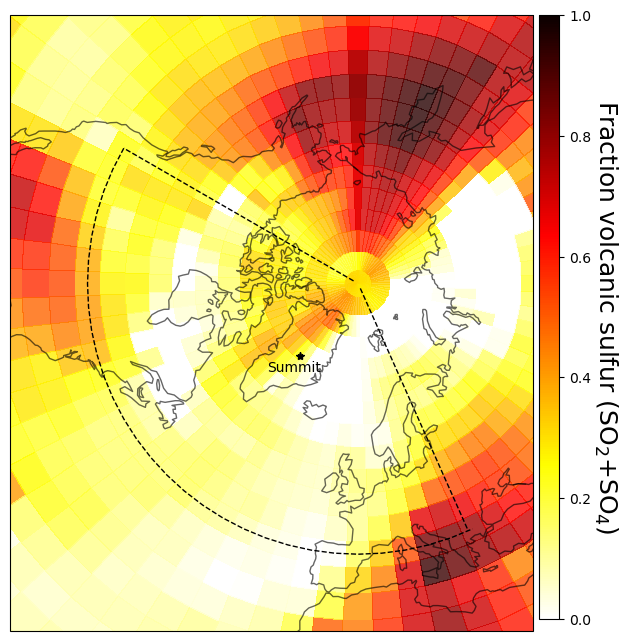

In [22]:
# You can also plot the model output of species concentration in map form!

fig = plt.figure(figsize=[10,8])
ax = plt.subplot(projection=ccrs.NorthPolarStereo())
a=10
dr_s,lon = add_cyclic_point(fvolc_map_pi, coord=fvolc_map_pi.lon)
color_norm = mpl.colors.Normalize(vmin=0,vmax=1)
llon, llat = np.meshgrid(lon[12:42],volc_SpeciesConc.AREA.lat[33:46])

# 72.5796° N, 38.4592° W are the coordinates of Summit, Greenland
ax.pcolormesh(lon,fvolc_map_pi.lat,dr_s,cmap='hot_r',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
# ax.pcolor(lon[20:36],novolc_SpeciesConc.AREA.lat[35:46],dr_s[35:46,20:36]*0,cmap='jet',norm=color_norm,transform=ccrs.PlateCarree(),alpha=1,edgecolor='k')
ax.contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[1],linestyles=['--'],zorder=5)
ax.contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[1],linestyles=['--'],zorder=5)
ax.contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[1],linestyles=['--'],zorder=5)

ax.plot(-38.62, 72.58, 'k*', markersize=6, transform=ccrs.PlateCarree())
ax.text(-46, 66.5, 'Summit', transform=ccrs.PlateCarree(),fontsize = 10,color='k')
ax.set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())

ax.coastlines(alpha=0.6)
# plt.title('Jongebloed fraction volcanic sulfur')
dm_nit = plt.cm.ScalarMappable(cmap='hot_r',norm=color_norm)
dm_nit.set_array([])
cax = plt.axes([0.78, 0.125, 0.02, 0.755])
cbar = plt.colorbar(dm_nit, orientation = 'vertical',cax=cax)
cbar.set_label('Fraction volcanic sulfur (SO$_2$+SO$_4$)', rotation=270,labelpad=20,fontsize=18)

/tmp/ipykernel_7538/4237569506.py:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[0] = plt.subplot(141,projection=ccrs.NorthPolarStereo())#,position=[0,0.1,0.4,0.8])
/tmp/ipykernel_7538/4237569506.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[1] = plt.subplot(142,projection=ccrs.NorthPolarStereo())#,position=[0.1,0.1,0.4,0.8])
/tmp/ipykernel_7538/4237569506.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(143,projection=ccrs.NorthPolarStereo())#,position=[0.2,0.1,0.4,0.8])
/home/disk/p/ujongebl/miniconda3/envs/pymc_env/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:161

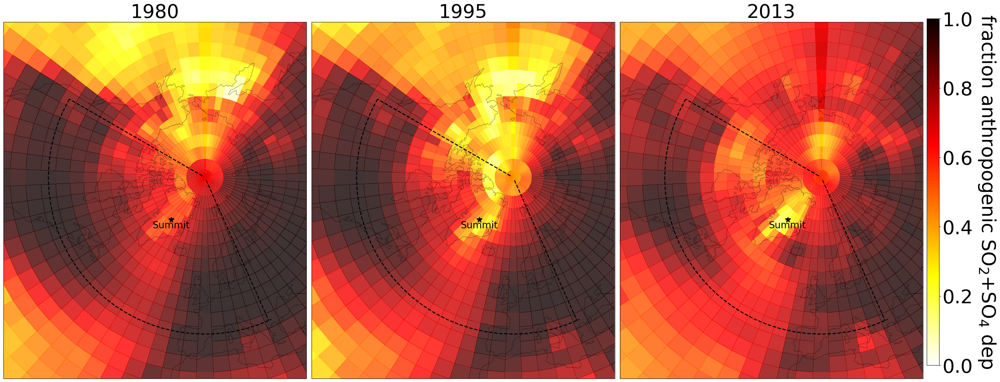

In [23]:
fig,ax = plt.subplots(ncols=3,nrows=1,figsize=[36,24],squeeze=True)
ax[0] = plt.subplot(141,projection=ccrs.NorthPolarStereo())#,position=[0,0.1,0.4,0.8])
ax[1] = plt.subplot(142,projection=ccrs.NorthPolarStereo())#,position=[0.1,0.1,0.4,0.8])
ax[2] = plt.subplot(143,projection=ccrs.NorthPolarStereo())#,position=[0.2,0.1,0.4,0.8])

j=40
l = 3
m=20
color_norm = mpl.colors.Normalize(vmin=0,vmax=1)

dr_s1,lon = add_cyclic_point(fanth_map_1980, coord=fanth_burden_map_1980.lon)
dr_s2,lon = add_cyclic_point(fanth_map_1995, coord=fanth_burden_map_1995.lon)
dr_s3,lon = add_cyclic_point(fanth_map_2013, coord=fanth_burden_map_2013.lon)
llon, llat = np.meshgrid(lon[12:42],volc_SpeciesConc.AREA.lat[33:46])

ax[0].pcolormesh(lon,fanth_map_2013.lat,dr_s1,cmap='hot_r',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[0].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[0].coastlines(alpha=0.4)
ax[0].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[0].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[0].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[0].plot(-38.62, 72.58, 'k*', markersize=12, transform=ccrs.PlateCarree())
ax[0].text(-46, 66.5, 'Summit', transform=ccrs.PlateCarree(),fontsize = j/2,color='k')


ax[1].pcolormesh(lon,fanth_map_2013.lat,dr_s2,cmap='hot_r',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[1].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[1].coastlines(alpha=0.4)
ax[1].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[1].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[1].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[1].plot(-38.62, 72.58, 'k*', markersize=12, transform=ccrs.PlateCarree())
ax[1].text(-46, 66.5, 'Summit', transform=ccrs.PlateCarree(),fontsize = j/2,color='k')


ax[2].pcolormesh(lon,fanth_map_2013.lat,dr_s3,cmap='hot_r',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[2].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[2].coastlines(alpha=0.4)
ax[2].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[2].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[2].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[2],linestyles=['--'],zorder=5)
ax[2].plot(-38.62, 72.58, 'k*', markersize=12, transform=ccrs.PlateCarree())
ax[2].text(-46, 66.5, 'Summit', transform=ccrs.PlateCarree(),fontsize = j/2,color='k')

ax[0].set_title('1980',fontsize=j)
ax[1].set_title('1995',fontsize=j)
ax[2].set_title('2013',fontsize=j)

plt.subplots_adjust(bottom=0, right=0.7, left=0.1, top=1)
dm_nit = plt.cm.ScalarMappable(cmap='hot_r',norm=color_norm)
dm_nit.set_array([])
cax = plt.axes([0.75, 0.3, 0.01, 0.42])
cbar = plt.colorbar(dm_nit, orientation = 'vertical',cax=cax)
cbar.set_label('fraction anthropogenic SO$_2$+SO$_4$ dep', rotation=270,labelpad=50,fontsize=j)
cbar.ax.tick_params(labelsize=j)
plt.tight_layout()

# ax[0].text(0.05, 0.07, 'f$_{anth}$ = 34%', transform=ax[0].transAxes,fontsize=j, fontweight='bold', va='top')
# ax[1].text(0.05, 0.07, 'f$_{anth}$ = 36%', transform=ax[1].transAxes,fontsize=j, fontweight='bold', va='top')
# ax[2].text(0.05, 0.07, 'f$_{anth}$ = 46%', transform=ax[2].transAxes,fontsize=j, fontweight='bold', va='top')


/tmp/ipykernel_7538/3119503696.py:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[0] = plt.subplot(141,projection=ccrs.NorthPolarStereo(),position=[0,0.1,0.4,0.8])
/tmp/ipykernel_7538/3119503696.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[1] = plt.subplot(142,projection=ccrs.NorthPolarStereo(),position=[0.1,0.1,0.4,0.8])
/tmp/ipykernel_7538/3119503696.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(143,projection=ccrs.NorthPolarStereo(),position=[0.2,0.1,0.4,0.8])
/tmp/ipykernel_7538/3119503696.py:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is depre

Text(0.5, 1.0, '2013')

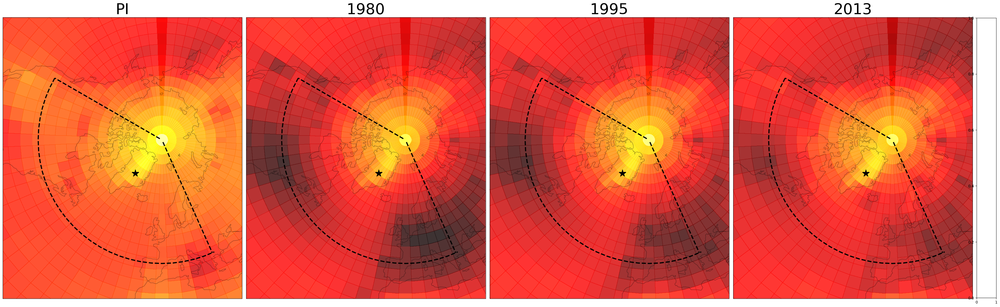

In [24]:
fig,ax = plt.subplots(ncols=4,nrows=1,figsize=[36,24],squeeze=True)
ax[0] = plt.subplot(141,projection=ccrs.NorthPolarStereo(),position=[0,0.1,0.4,0.8])
ax[1] = plt.subplot(142,projection=ccrs.NorthPolarStereo(),position=[0.1,0.1,0.4,0.8])
ax[2] = plt.subplot(143,projection=ccrs.NorthPolarStereo(),position=[0.2,0.1,0.4,0.8])
ax[3] = plt.subplot(144,projection=ccrs.NorthPolarStereo(),position=[0.3,0.1,0.4,0.8])

j=40
l = 3
m=20
color_norm = mpl.colors.LogNorm(vmin=np.min(dep_map_1980),vmax=np.max(dep_map_1980))
llon, llat = np.meshgrid(lon[12:42],volc_SpeciesConc.AREA.lat[33:46])

dr_s1,lon = add_cyclic_point(dep_map_pi, coord=burden_map_pi.lon)
dr_s2,lon = add_cyclic_point(dep_map_1980, coord=burden_map_1980.lon)
dr_s3,lon = add_cyclic_point(dep_map_1995, coord=np.mean(burden_map_1995,axis=0).lon)
dr_s4,lon = add_cyclic_point(dep_map_2013, coord=np.mean(burden_map_2013,axis=0).lon)

ax[0].pcolormesh(lon,burden_map_pi.lat,dr_s1,cmap='hot_r',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[0].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[0].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[0].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[0].plot(-38.62, 72.58, 'k*', markersize=m, transform=ccrs.PlateCarree())
# ax[0].text(-46, 66, 'Summit', transform=ccrs.PlateCarree(),fontsize = j,color='k')
ax[0].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[0].coastlines(alpha=0.4)


ax[1].pcolormesh(lon,burden_map_pi.lat,dr_s2,cmap='hot_r',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[1].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[1].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[1].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[1].plot(-38.62, 72.58, 'k*', markersize=m, transform=ccrs.PlateCarree())
# ax[1].text(-46, 66, 'Summit', transform=ccrs.PlateCarree(),fontsize = j,color='k')
ax[1].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[1].coastlines(alpha=0.4)


ax[2].pcolormesh(lon,burden_map_pi.lat,dr_s3,cmap='hot_r',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[2].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[2].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[2].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[2].plot(-38.62, 72.58, 'k*', markersize=m, transform=ccrs.PlateCarree())
# ax[2].text(-46, 66, 'Summit', transform=ccrs.PlateCarree(),fontsize = j,color='k')
ax[2].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[2].coastlines(alpha=0.4)


ax[3].pcolormesh(lon,burden_map_pi.lat,dr_s4,cmap='hot_r',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[3].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[3].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[3].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[3].plot(-38.62, 72.58, 'k*', markersize=m, transform=ccrs.PlateCarree())
# ax[3].text(-46, 66, 'Summit', transform=ccrs.PlateCarree(),fontsize = j,color='k')
ax[3].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[3].coastlines(alpha=0.4)


# plt.subplots_adjust(bottom=0, right=0.7, left=0.1, top=1)
plt.tight_layout(h_pad=0.1)
dm_nit = plt.cm.ScalarMappable(cmap='hot_r',norm=color_norm)
dm_nit.set_array([])
cax = plt.axes([1, 0.285, 0.02, 0.43])
# cbar = plt.colorbar(dm_nit, orientation = 'vertical',cax=cax)
# cbar.set_label('SO$_2$+SO$_4$ deposition (kg)', rotation=270,labelpad=50,fontsize=j)
# cbar.ax.tick_params(labelsize=j)

ax[0].set_title('PI',fontsize=j)
ax[1].set_title('1980',fontsize=j)
ax[2].set_title('1995',fontsize=j)
ax[3].set_title('2013',fontsize=j)

# ax[0].text(0.05, 0.07, 'f$_{volc}$ = 34%', transform=ax[0].transAxes,fontsize=j, fontweight='bold', va='top')
# ax[1].text(0.05, 0.07, 'f$_{volc}$ = 36%', transform=ax[1].transAxes,fontsize=j, fontweight='bold', va='top')
# ax[2].text(0.05, 0.07, 'f$_{volc}$ = 46%', transform=ax[2].transAxes,fontsize=j, fontweight='bold', va='top')
# ax[3].text(0.05, 0.07, 'f$_{volc}$ = 61%', transform=ax[3].transAxes,fontsize=j, fontweight='bold', va='top')


/tmp/ipykernel_7538/2674127123.py:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[0] = plt.subplot(141,projection=ccrs.NorthPolarStereo(),position=[0,0.1,0.4,0.8])
/tmp/ipykernel_7538/2674127123.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[1] = plt.subplot(142,projection=ccrs.NorthPolarStereo(),position=[0.1,0.1,0.4,0.8])
/tmp/ipykernel_7538/2674127123.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(143,projection=ccrs.NorthPolarStereo(),position=[0.2,0.1,0.4,0.8])
/tmp/ipykernel_7538/2674127123.py:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is depre

Text(0.5, 1.0, '2013')

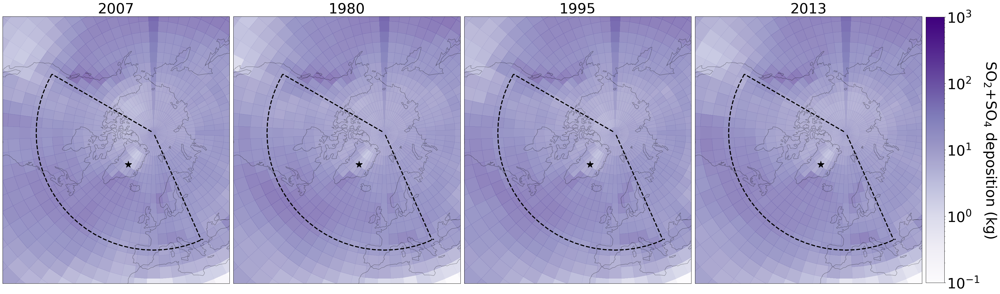

In [25]:
fig,ax = plt.subplots(ncols=4,nrows=1,figsize=[36,24],squeeze=True)
ax[0] = plt.subplot(141,projection=ccrs.NorthPolarStereo(),position=[0,0.1,0.4,0.8])
ax[1] = plt.subplot(142,projection=ccrs.NorthPolarStereo(),position=[0.1,0.1,0.4,0.8])
ax[2] = plt.subplot(143,projection=ccrs.NorthPolarStereo(),position=[0.2,0.1,0.4,0.8])
ax[3] = plt.subplot(144,projection=ccrs.NorthPolarStereo(),position=[0.3,0.1,0.4,0.8])

j=40
l = 3
m=20
llon, llat = np.meshgrid(lon[12:42],volc_SpeciesConc.AREA.lat[33:46])

dr_s1,lon = add_cyclic_point(volc_StateMet_met07.Met_PRECTOT.sum(dim='time'), coord=burden_map_pi.lon)
dr_s2,lon = add_cyclic_point(anth1980_StateMet.Met_PRECTOT.sum(dim='time'), coord=burden_map_1980.lon)
dr_s3,lon = add_cyclic_point(anth1995_StateMet.Met_PRECTOT.sum(dim='time'), coord=np.mean(burden_map_1995,axis=0).lon)
dr_s4,lon = add_cyclic_point(anthdef_StateMet.Met_PRECTOT.sum(dim='time'), coord=np.mean(burden_map_2013,axis=0).lon)
color_norm = mpl.colors.LogNorm(vmin=1e-1,
                                vmax=1e3)

ax[0].pcolormesh(lon,burden_map_pi.lat,dr_s1,cmap='Purples',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[0].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[0].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[0].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[0].plot(-38.62, 72.58, 'k*', markersize=m, transform=ccrs.PlateCarree())
# ax[0].text(-46, 66, 'Summit', transform=ccrs.PlateCarree(),fontsize = j,color='k')
ax[0].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[0].coastlines(alpha=0.4)


ax[1].pcolormesh(lon,burden_map_pi.lat,dr_s2,cmap='Purples',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[1].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[1].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[1].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[1].plot(-38.62, 72.58, 'k*', markersize=m, transform=ccrs.PlateCarree())
# ax[1].text(-46, 66, 'Summit', transform=ccrs.PlateCarree(),fontsize = j,color='k')
ax[1].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[1].coastlines(alpha=0.4)


ax[2].pcolormesh(lon,burden_map_pi.lat,dr_s3,cmap='Purples',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[2].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[2].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[2].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[2].plot(-38.62, 72.58, 'k*', markersize=m, transform=ccrs.PlateCarree())
# ax[2].text(-46, 66, 'Summit', transform=ccrs.PlateCarree(),fontsize = j,color='k')
ax[2].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[2].coastlines(alpha=0.4)


ax[3].pcolormesh(lon,burden_map_pi.lat,dr_s4,cmap='Purples',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax[3].contour(llon,llat,llat,levels=[40],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[3].contour(llon,llat,llon,levels=[80],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[3].contour(llon,llat,llon,levels=[24],colors='k',transform=ccrs.PlateCarree(),linewidths=[l],linestyles=['--'],zorder=5)
ax[3].plot(-38.62, 72.58, 'k*', markersize=m, transform=ccrs.PlateCarree())
# ax[3].text(-46, 66, 'Summit', transform=ccrs.PlateCarree(),fontsize = j,color='k')
ax[3].set_extent([-140, 30, 30, 90], crs=ccrs.PlateCarree())
ax[3].coastlines(alpha=0.4)


# plt.subplots_adjust(bottom=0, right=0.7, left=0.1, top=1)
plt.tight_layout(h_pad=0.1)
dm_nit = plt.cm.ScalarMappable(cmap='Purples',norm=color_norm)
dm_nit.set_array([])
cax = plt.axes([1, 0.285, 0.02, 0.43])
cbar = plt.colorbar(dm_nit, orientation = 'vertical',cax=cax)
cbar.set_label('SO$_2$+SO$_4$ deposition (kg)', rotation=270,labelpad=50,fontsize=j)
cbar.ax.tick_params(labelsize=j)

ax[0].set_title('2007',fontsize=j)
ax[1].set_title('1980',fontsize=j)
ax[2].set_title('1995',fontsize=j)
ax[3].set_title('2013',fontsize=j)

# ax[0].text(0.05, 0.07, 'f$_{volc}$ = 34%', transform=ax[0].transAxes,fontsize=j, fontweight='bold', va='top')
# ax[1].text(0.05, 0.07, 'f$_{volc}$ = 36%', transform=ax[1].transAxes,fontsize=j, fontweight='bold', va='top')
# ax[2].text(0.05, 0.07, 'f$_{volc}$ = 46%', transform=ax[2].transAxes,fontsize=j, fontweight='bold', va='top')
# ax[3].text(0.05, 0.07, 'f$_{volc}$ = 61%', transform=ax[3].transAxes,fontsize=j, fontweight='bold', va='top')


In [166]:
mask2 =  mask_1cell

dep_mask_novolc = ((wetlossconv_SO2_monthly_novolc * mask2).sum()+ 
                  (wetlossconv_SO4_monthly_novolc * mask2).sum()+
                  (SO2_per_month_novolc * mask2).sum() + 
                  (SO4_per_month_novolc * mask2).sum() + 
                  (wetlossls_SO2_monthly_novolc * mask2).sum()+ 
                  (wetlossls_SO4_monthly_novolc * mask2).sum()) / np.sum(mask_1cell*area) * 1e6 #convert to mg

dep_mask_pi = ((wetlossconv_SO2_monthly_pi * mask2).sum()+ 
              (wetlossconv_SO4_monthly_pi * mask2).sum()+
              (SO2_per_month_pi * mask2).sum() + 
              (SO4_per_month_pi * mask2).sum() + 
              (wetlossls_SO2_monthly_pi * mask2).sum()+ 
              (wetlossls_SO4_monthly_pi * mask2).sum()) / np.sum(mask_1cell*area) * 1e6

dep_mask_pi_07 = ((wetlossconv_SO2_monthly_pi_07 * mask2).sum()+ 
                  (wetlossconv_SO4_monthly_pi_07 * mask2).sum()+
                  (SO2_per_month_pi_07 * mask2).sum() + 
                  (SO4_per_month_pi_07 * mask2).sum() + 
                  (wetlossls_SO2_monthly_pi_07 * mask2).sum()+ 
                  (wetlossls_SO4_monthly_pi_07 * mask2).sum()) / np.sum(mask_1cell*area) * 1e6

dep_mask_2013 = ((wetlossconv_SO2_monthly_2013 * mask2).sum()+ 
                (wetlossconv_SO4_monthly_2013 * mask2).sum()+
                (SO2_per_month_2013 * mask2).sum() + 
                (SO4_per_month_2013 * mask2).sum() + 
                (wetlossls_SO2_monthly_2013 * mask2).sum()+ 
                (wetlossls_SO4_monthly_2013 * mask2).sum()) / np.sum(mask_1cell*area) * 1e6

dep_mask_1980 = ((wetlossconv_SO2_monthly_1980 * mask2).sum()+ 
                (wetlossconv_SO4_monthly_1980 * mask2).sum()+
                (SO2_per_month_1980 * mask2).sum() + 
                (SO4_per_month_1980 * mask2).sum() + 
                (wetlossls_SO2_monthly_1980 * mask2).sum()+ 
                (wetlossls_SO4_monthly_1980 * mask2).sum()) / np.sum(mask_1cell*area) * 1e6

dep_mask_1995 = ((wetlossconv_SO2_monthly_1995 * mask2).sum()+ 
                (wetlossconv_SO4_monthly_1995 * mask2).sum()+
                (SO2_per_month_1995 * mask2).sum() + 
                (SO4_per_month_1995 * mask2).sum() + 
                (wetlossls_SO2_monthly_1995 * mask2).sum()+ 
                (wetlossls_SO4_monthly_1995 * mask2).sum()) / np.sum(mask_1cell*area) * 1e6

dep_mask_pi_mean = (dep_mask_pi + dep_mask_pi_07)/2 
fvolc_dep_mask_pi = np.round(1 - dep_mask_novolc/dep_mask_pi_mean,2)*100
fanth_dep_mask_2013 = np.round((dep_mask_2013 - dep_mask_pi_mean) / dep_mask_2013,2)*100
fanth_dep_mask_1980 = np.round((dep_mask_1980 - dep_mask_pi_mean) / dep_mask_1980,2)*100
fanth_dep_mask_1995 = np.round((dep_mask_1995 - dep_mask_pi_mean) / dep_mask_1995,2)*100

print('dep fvolc',fvolc_dep_mask_pi.values)
print('2013 greenland dep fraction',fanth_dep_mask_2013.values)
print('1995 greenland dep fraction',fanth_dep_mask_1995.values)
print('1980 greenland dep fraction',fanth_dep_mask_1980.values)

dep fvolc 25.0
2013 greenland dep fraction 22.0
1995 greenland dep fraction 42.0
1980 greenland dep fraction 56.00000000000001


In [28]:
# convert from mm / day to m3 per day by dividing my 1000 and multiplying by cell area
# convert from m3 to kg by multiplying by 1000
# the 1000 factors end up canceling out
# multiply by days in month to get kg per month

monthly_precip_kg_1980 = np.zeros(12)
monthly_precip_kg_1995 = np.zeros(12)
monthly_precip_kg_2007 = np.zeros(12)
monthly_precip_kg_2013 = np.zeros(12)
for i in range (0,12):
    monthly_precip_kg_1980 =  np.sum(anth1980_StateMet.Met_PRECTOT[i] * days_in_month[i] * area * mask_1cell)
    monthly_precip_kg_1995 =  np.sum(anth1995_StateMet.Met_PRECTOT[i] * days_in_month[i] * area * mask_1cell)
    monthly_precip_kg_2007 =  np.sum(volc_StateMet_met07.Met_PRECTOT[i] * days_in_month[i] * area * mask_1cell)
    monthly_precip_kg_2013 =  np.sum(anthdef_StateMet.Met_PRECTOT[i] * days_in_month[i] * area * mask_1cell)


precip_kg_2007 = np.sum(monthly_precip_kg_2007)
precip_kg_1980 = np.sum(monthly_precip_kg_1980)
precip_kg_1995 = np.sum(monthly_precip_kg_1995)
precip_kg_2013 = np.sum(monthly_precip_kg_2013)

# convert from kg to ug by multiply by 10^6
# convert from 
conc_ug_kg_pi_07 = dep_mask_pi_07*1e3 * np.sum(mask_1cell*area) / precip_kg_2007
conc_ug_kg_pi    = dep_mask_pi*1e3 * np.sum(mask_1cell*area) / precip_kg_2013
conc_ug_kg_1980  = dep_mask_1980*1e3 * np.sum(mask_1cell*area) / precip_kg_1980
conc_ug_kg_1995  = dep_mask_1995*1e3 * np.sum(mask_1cell*area) / precip_kg_1995
conc_ug_kg_2013  = dep_mask_2013*1e3 * np.sum(mask_1cell*area) / precip_kg_2013

## CEDS

In [29]:
anthroSO2 = xr.open_dataset('./CEDS/SO2-em-anthro_CMIP_CEDS_1850-2019.nc')
SO2_agr = anthroSO2.SO2_agr
SO2_ene = anthroSO2.SO2_ene
SO2_ind = anthroSO2.SO2_ind
SO2_rco = anthroSO2.SO2_rco
SO2_shp = anthroSO2.SO2_shp
SO2_slv = anthroSO2.SO2_slv
SO2_tra = anthroSO2.SO2_tra
SO2_wst = anthroSO2.SO2_wst
anthroSO2_all_1850_2019 = SO2_agr + SO2_ene + SO2_ind + SO2_rco + SO2_shp + SO2_slv +SO2_tra + SO2_wst

In [30]:
anthroSO2_1750 = xr.open_dataset('./CEDS/SO2-em-anthro_CMIP_CEDS_1750.nc')
SO2_agr_1750 = anthroSO2_1750.SO2_agr
SO2_ene_1750 = anthroSO2_1750.SO2_ene
SO2_ind_1750 = anthroSO2_1750.SO2_ind
SO2_rco_1750 = anthroSO2_1750.SO2_rco
SO2_shp_1750 = anthroSO2_1750.SO2_shp
SO2_slv_1750 = anthroSO2_1750.SO2_slv
SO2_tra_1750 = anthroSO2_1750.SO2_tra
SO2_wst_1750 = anthroSO2_1750.SO2_wst
anthroSO2_all_1750 = SO2_agr_1750 + SO2_ene_1750 + SO2_ind_1750 + SO2_rco_1750 + SO2_shp_1750 + SO2_slv_1750 +SO2_tra_1750 + SO2_wst_1750

In [31]:
sec_in_month_1850_2019 = np.array([])

for i in range(0,(2019-1850)+2):
    sec_in_month_1850_2019 = np.hstack([sec_in_month_1850_2019,sec_in_month])

In [32]:
# anthroSO2_emiss_1850_2019 = np.zeros([len(sec_in_month_1850_2019),len(anthroSO2_all_1850_2019.lat),
#                                     len(anthroSO2_all_1850_2019.lon)])
# for i in range(0,len(sec_in_month_1850_2019),1): 
#     anthroSO2_emiss_1850_2019[i,:,:] = (
#         anthroSO2_all_1850_2019[i,:,:]) * sec_in_month_1850_2019[i]

# anthroSO2_emiss_1750 = np.zeros([len(sec_in_month),len(anthroSO2_all_1750.lat),len(anthroSO2_all_1750.lon)])

# for i in range(0,len(sec_in_month)):
#     anthroSO2_emiss_1750[i,:,:] = anthroSO2_all_1750[i,:,:] * sec_in_month[i]

In [33]:
# CREATE 1x1 DEGREE AREA FIELD

deg_to_rad = np.pi / 180
lat_difs = np.abs(np.sin(anthroSO2.isel(lat=slice(0,359)).lat.values*deg_to_rad)
                  - np.sin(anthroSO2.isel(lat=slice(1,360)).lat.values*deg_to_rad))
lon_difs = np.abs(anthroSO2.isel(lon=slice(0,719)).lon.values - anthroSO2.isel(lon=slice(1,720)).lon.values)*deg_to_rad

lat_grid = np.zeros([len(lat_difs),len(lon_difs)])
lon_grid = np.zeros([len(lat_difs),len(lon_difs)])

for i in range(0,len(lon_difs)):
    lat_grid[:,i] = lat_difs
    
for i in range(0,len(lat_difs)):
    lon_grid[i,:] = lon_difs
    
ceds_grid = np.zeros([len(lat_difs),len(lon_difs)])

for i in range(0,len(lat_difs)):
    for j in range(0,len(lon_difs)):

        ceds_grid[i,j] = lat_difs[i]*lon_difs[j]
        
R = 6378100 #radius of Earth in meters
area_ceds_reduced = R**2 * ceds_grid 

area_ceds = np.zeros([360,720])
area_ceds[0,:] = area_ceds_reduced[0,0]
area_ceds[:,0] = area_ceds_reduced[0,0]

area_ceds[359,:] = area_ceds_reduced[358,718]
area_ceds[:,718] = area_ceds_reduced[358,718]

area_ceds[1:360,1:720] = area_ceds_reduced

# I HAVE CHECKED AND THE AREA OF THE EARTH IS 510 TRILLION M2, WHICH ALIGNS WITH AREA_CEDS

In [34]:
anthroSO2_emiss_1850_2019 = np.zeros([len(sec_in_month_1850_2019),len(anthroSO2_all_1850_2019.lat),
                                    len(anthroSO2_all_1850_2019.lon)])
for i in range(0,len(sec_in_month_1850_2019),1): 
    anthroSO2_emiss_1850_2019[i,:,:] = (
        anthroSO2_all_1850_2019[i,:,:]) * sec_in_month_1850_2019[i] * area_ceds

anthroSO2_emiss_1750 = np.zeros([len(sec_in_month),len(anthroSO2_all_1750.lat),len(anthroSO2_all_1750.lon)])

for i in range(0,len(sec_in_month)):
    anthroSO2_emiss_1750[i,:,:] = anthroSO2_all_1750[i,:,:] * sec_in_month[i] * area_ceds

1975-01-01T00:00:00.000000000


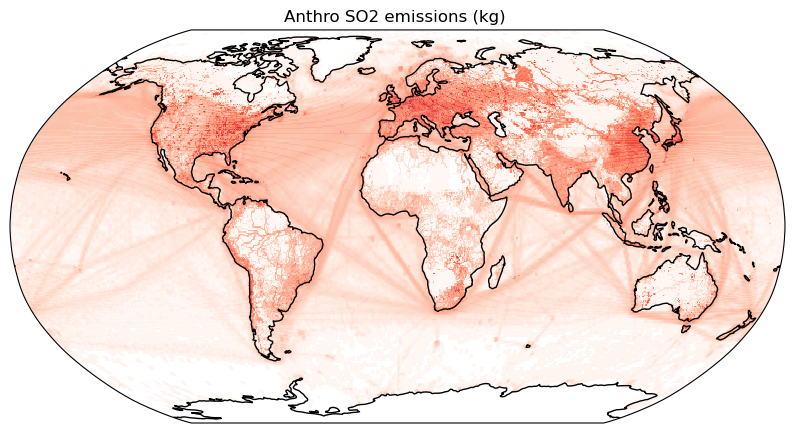

In [35]:
fig = plt.figure(figsize=[10,8])
ax = plt.subplot(projection=ccrs.Robinson())
a=10
color_norm = mpl.colors.LogNorm(1e2,1e9)
t=1500
ax.pcolormesh(anthroSO2.lon,anthroSO2.lat,anthroSO2_emiss_1850_2019[t,:,:],cmap='Reds',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax.set_title('Anthro SO2 emissions (kg) ')
ax.coastlines()
dm_nit = plt.cm.ScalarMappable(cmap='Reds',norm=color_norm)
dm_nit.set_array([])
# cbar = plt.colorbar(dm_nit, orientation = 'horizontal',pad=0.02)
# cbar.set_label('Emissions (kg SO2)', rotation=0,labelpad=10,fontsize=12)
print(anthroSO2.isel(time=t).time.values)

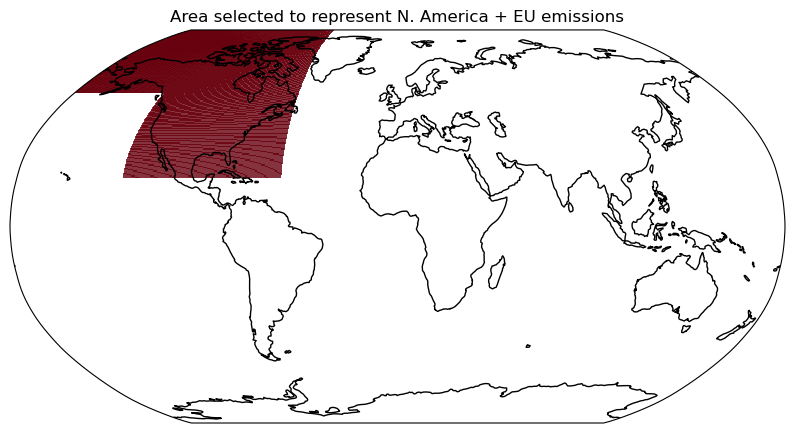

In [173]:
eunasu_cells = np.zeros(np.shape(area_ceds))
# eunasu_cells[250:,250:420]=1 #EU
eunasu_cells[220:,100:250]=1 # N. America
eunasu_cells[290:,0:150]=1 # Alaska
# eunasu_cells[280:,420:720]=1 # Russia

fig = plt.figure(figsize=[10,8])
ax = plt.subplot(projection=ccrs.Robinson())
a=10
color_norm = mpl.colors.LogNorm(1e-10,1)

ax.pcolormesh(anthroSO2.lon,anthroSO2.lat,eunasu_cells,cmap='Reds',norm=color_norm,transform=ccrs.PlateCarree(),alpha=0.8)
ax.set_title('Area selected to represent N. America + EU emissions')
ax.coastlines()


In [174]:
ceds_eunasu_emiss = np.zeros(np.shape(anthroSO2_emiss_1850_2019))
for i in range(0,np.shape(anthroSO2_emiss_1850_2019)[0]):
    ceds_eunasu_emiss[i,:,:] = anthroSO2_emiss_1850_2019[i,:,:]*eunasu_cells

ceds_eunasu_emiss_1750 = np.zeros(np.shape(anthroSO2_emiss_1750))
for i in range(0,np.shape(anthroSO2_emiss_1750)[0]):
    ceds_eunasu_emiss_1750[i,:,:] = anthroSO2_emiss_1750[i,:,:]*eunasu_cells

In [175]:
ceds_yrs = np.linspace(1850,2019,(2019-1850)+1)
eunasuSO2_annual = np.zeros([len(ceds_yrs),360,720])
global_annual_ceds = np.zeros([len(ceds_yrs),360,720])
eunasuSO2_1750 = np.zeros([360,720])
global_1750_ceds = np.zeros([360,720])

for i in range(0,len(ceds_yrs)):
#     print(ceds_yrs[i])
    for j in range(0,12):
        eunasuSO2_annual[i,:,:] = eunasuSO2_annual[i,:,:] + ceds_eunasu_emiss[(i*12 + j),:,:]
        global_annual_ceds[i,:,:] = global_annual_ceds[i,:,:] + anthroSO2_emiss_1850_2019[(i*12 + j),:,:]

eunasuSO2_1750 = np.sum(ceds_eunasu_emiss_1750, axis=0)
global_1750_ceds = np.sum(anthroSO2_emiss_1750, axis=0)

In [176]:
na_eu_su_emiss_ceds = eunasuSO2_annual.sum(axis=1).sum(axis=1)
global_emiss_ceds   = global_annual_ceds.sum(axis=1).sum(axis=1)

na_eu_su_emiss_ceds_1750 = eunasuSO2_1750.sum()
global_emiss_ceds_1750   = global_1750_ceds.sum()

differences could be related to region selection


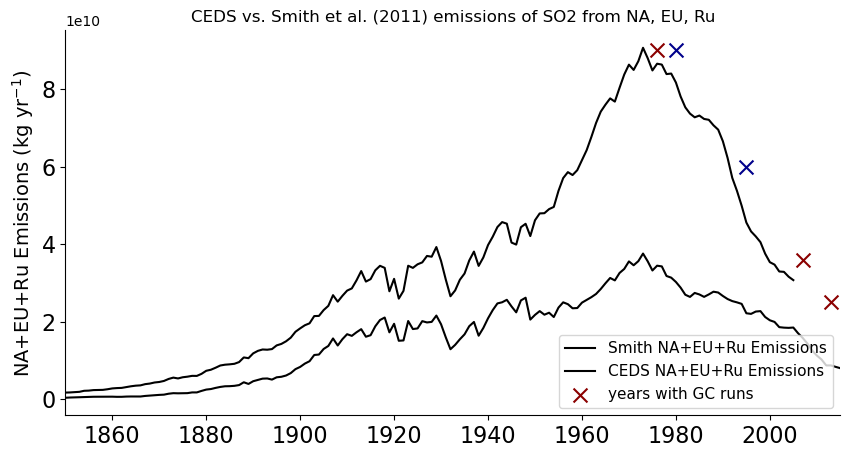

In [177]:
fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[10,5])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=100
# ax.scatter(2013,x2,marker='s',s=size,
#                color='maroon',label='2013 estimate from GEOS-Chem',alpha=aa)
ax.plot(year_smith,na_eu_su_emiss_smith,linestyle='-',color='k',linewidth=l,
         label='Smith NA+EU+Ru Emissions')
ax.plot(range(1850,2020,1),na_eu_su_emiss_ceds,linestyle='-',color='k',linewidth=l,
         label='CEDS NA+EU+Ru Emissions')
ax.set_xlim([1850,2015])

ax.scatter(1976,9e10,marker='x',color='darkred',s=size)
ax.scatter(1980,9e10,marker='x',color='darkblue',s=size)
ax.scatter(1995,6e10,marker='x',color='darkblue',s=size)
ax.scatter(2007,3.6e10,marker='x',color='darkred',s=size)
ax.scatter(2013,2.5e10,marker='x',color='darkred',s=size,label='years with GC runs')
# ax.set_ylim([0,1])

ax.set_ylabel('NA+EU+Ru Emissions (kg yr$^{-1}$)',fontsize=j-2)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(loc='lower right', fontsize= j-5)
ax.set_title('CEDS vs. Smith et al. (2011) emissions of SO2 from NA, EU, Ru')
print('differences could be related to region selection')

In [41]:
all_data = pd.read_excel('/home/cindylou/ujongebl/Notebooks/Bio_sulfur/all_data.xlsx').drop(8711).drop(8710)
year1 = all_data.year1
SO4_raw = all_data.SO4
nssSO4_raw = all_data.nssSO4
year = year1.values[::-1]
tstep=1
yr=np.linspace(int(year[1]),1202,int((2007-1202)/tstep+1))
nssSO4_df = pd.DataFrame(data=nssSO4_raw.values,index=year1.values,columns=['nssSO4'])
# nssSO4_1yr = nssSO4_df.groupby('year').mean()
nssSO4_1yr = nssSO4_df.groupby(by=None, axis=0, level=0, as_index=True).mean()

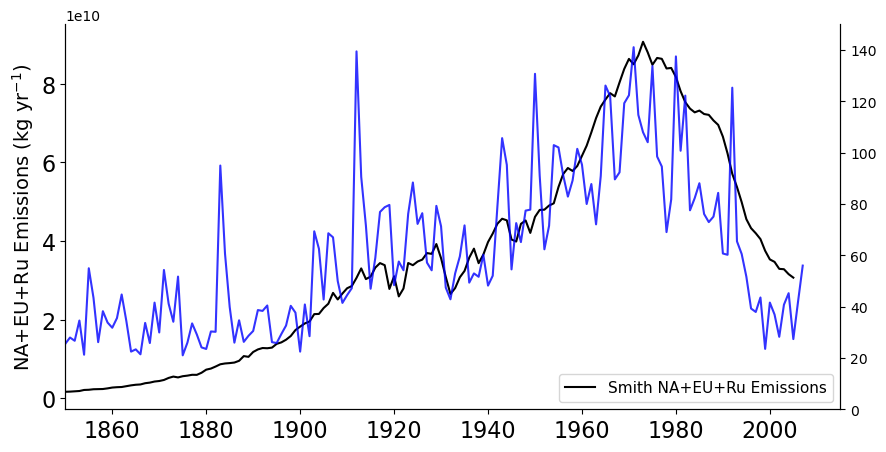

In [178]:
fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[10,5])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=100

ax.plot(year_smith,na_eu_su_emiss_smith,linestyle='-',color='k',linewidth=l,
         label='Smith NA+EU+Ru Emissions')
ax.set_xlim([1850,2015])

ax.set_ylabel('NA+EU+Ru Emissions (kg yr$^{-1}$)',fontsize=j-2)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax2 = ax.twinx()
ax2.plot(nssSO4_1yr.index,nssSO4_1yr,linewidth=l,color='blue',alpha=aa,label='[nssSO$_4$$^{2-}$] (µg kg$^{-1}$)')


ax.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)

ax2.set_ylim([0,150])
ax.legend(loc='lower right', fontsize= j-5)

# ax.set_title('CEDS vs. Smith et al. (2011) emissions of SO2 from NA, EU, Ru')
# print('differences could be related to region selection')

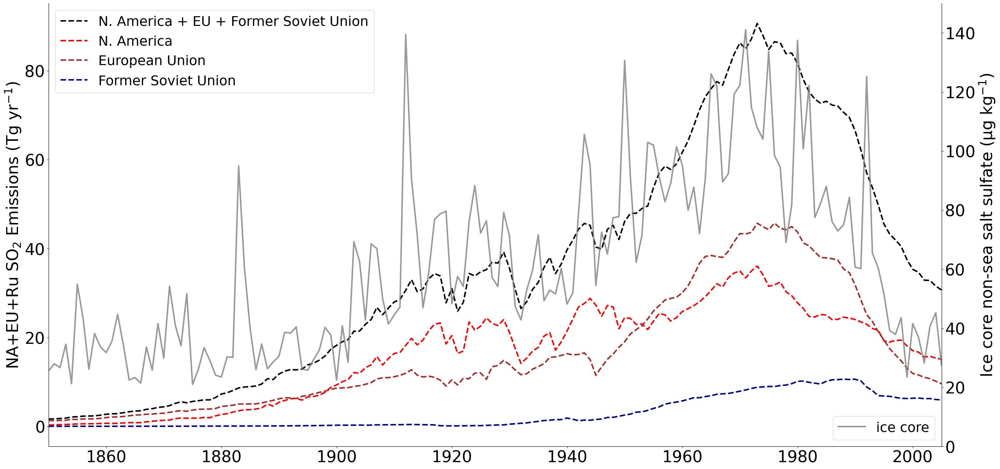

In [179]:
na_emiss_Ggyr = mainfig['North America emissions (Gg/yr)']
eu_emiss_Ggyr = mainfig['Europe emissions (Gg/yr)']
su_emiss_Ggyr = mainfig['Former S emissions (Gg/yr)']
t_emiss_Ggyr = na_emiss_Ggyr + eu_emiss_Ggyr + su_emiss_Ggyr
yr = mainfig['year']
ice_core_nssSO4 = mainfig['ice core SO42- [mg/L]']


fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[32,16])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)

l = 3
el = 0.5
aa = 0.8
aaa=0.05
j=32
size=100

ax.plot(yr,t_emiss_Ggyr/1e3,linestyle='--',color='k',linewidth=l,
         label='N. America + EU + Former Soviet Union')
ax.plot(yr,na_emiss_Ggyr/1e3,linestyle='--',color='r',linewidth=l,
         label='N. America')
ax.plot(yr,eu_emiss_Ggyr/1e3,linestyle='--',color='brown',linewidth=l,
         label='European Union')
ax.plot(yr,su_emiss_Ggyr/1e3,linestyle='--',color='darkblue',linewidth=l,
         label='Former Soviet Union')
ax.set_xlim([1850,2005])

ax.set_ylabel('NA+EU+Ru SO$_2$ Emissions (Tg yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax2 = ax.twinx()
ax2.plot(nssSO4_1yr.index,nssSO4_1yr,linewidth=l,color='gray',alpha=aa,label='ice core')


ax.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)

ax2.set_ylim([0,150])
ax.legend(loc='upper left', fontsize= j-5)

ax2.tick_params(axis='x', labelsize= j)
ax2.tick_params(axis='y', labelsize= j)

ax2.set_ylabel('Ice core non-sea salt sulfate (µg kg$^{-1}$)',fontsize=j)
ax2.legend(loc='lower right', fontsize= j-5)

# ax.set_title('CEDS vs. Smith et al. (2011) emissions of SO2 from NA, EU, Ru')
# print('differences could be related to region selection')

## LINEAR REGRESSION

- y values are the sulfur tropospheric burden from the PI run (called volc_SO4_burden_nolev_S and same for SO2)
- x values are emissions from Smith et al. 2011 from North America, EU, and Soviet Union

In [180]:
# Burden is calculated in back trajectory region for PI run (y1) and 2013 "PD" run (y2)
burden_pi = (volc_SO4_burden_nolev_S[:,33:46,12:42] + volc_SO2_burden_nolev_S[:,33:46,12:42]).mean(dim='time').sum(dim=('lat','lon'))
burden_pi_met07 = (volc_SO4_burden_nolev_S_met07[:,33:46,12:42] + volc_SO2_burden_nolev_S_met07[:,33:46,12:42]).mean(dim='time').sum(dim=('lat','lon'))
burden_1750_sz = ((piSO2_burden_sz[:,33:46,12:42] + piSO4_burden_sz[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_1975 = ((paSO2_burden_sz[:,33:46,12:42] + paSO4_burden_sz[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_1980 = ((SO2_burden_S_1980[:,33:46,12:42] + SO4_burden_S_1980[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_1995 = ((SO2_burden_S_1995[:,33:46,12:42] + SO4_burden_S_1995[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_2007 = ((pdSO2_burden_sz[:,33:46,12:42] + pdSO4_burden_sz[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_2013 = ((anthdef_SO4_burden_nolev_S[:,33:46,12:42] + anthdef_SO2_burden_nolev_S[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_1750_sh = ((SO2_burden_S_1750[:,33:46,12:42] + SO4_burden_S_1750[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_1960_sh = ((SO2_burden_S_1960[:,33:46,12:42] + SO4_burden_S_1960[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_1973_sh = ((SO2_burden_S_1973[:,33:46,12:42] + SO4_burden_S_1973[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_1986_sh = ((SO2_burden_S_1986[:,33:46,12:42] + SO4_burden_S_1986[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_1999_sh = ((SO2_burden_S_1999[:,33:46,12:42] + SO4_burden_S_1999[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_2013_sh = ((SO2_burden_S_2013_sh[:,33:46,12:42] + SO4_burden_S_2013_sh[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))

burden_bm2010 = ((SO2_burden_S_2010[:,33:46,12:42] + SO4_burden_S_2010[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2011 = ((SO2_burden_S_2011[:,33:46,12:42] + SO4_burden_S_2011[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2012 = ((SO2_burden_S_2012[:,33:46,12:42] + SO4_burden_S_2012[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2013 = ((SO2_burden_S_2013[:,33:46,12:42] + SO4_burden_S_2013[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2014 = ((SO2_burden_S_2014[:,33:46,12:42] + SO4_burden_S_2014[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2015 = ((SO2_burden_S_2015[:,33:46,12:42] + SO4_burden_S_2015[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2016 = ((SO2_burden_S_2016[:,33:46,12:42] + SO4_burden_S_2016[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2017 = ((SO2_burden_S_2017[:,33:46,12:42] + SO4_burden_S_2017[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2018 = ((SO2_burden_S_2018[:,33:46,12:42] + SO4_burden_S_2018[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_bm2019 = ((SO2_burden_S_2019[:,33:46,12:42] + SO4_burden_S_2019[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))

burden_h2s   = ((Jongebl_volc_SO2_burden_nolev_S[:,33:46,12:42] + Jongebl_volc_SO4_burden_nolev_S[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
burden_h2s17 = ((Jongebl_volc3_SO2_burden_nolev_S[:,33:46,12:42] + Jongebl_volc3_SO4_burden_nolev_S[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))

# Emissions are assumed to be zero in PI, and x2 is 2013 emissions from the GEOS-Chem input
# from first cell in this sheet: ds_def_anth.EmisSO2_Anthro
anthro_emiss_pi = 0
anthro_emiss_1750 = na_eu_su_emiss_ceds_1750
anthro_emiss_1960 = na_eu_su_emiss_ceds[110]
anthro_emiss_1980 = na_eu_su_emiss_ceds[130]
anthro_emiss_1995 = na_eu_su_emiss_ceds[145]
anthro_emiss_1973 = na_eu_su_emiss_ceds[123]
anthro_emiss_1975 = na_eu_su_emiss_ceds[125]
anthro_emiss_1986 = na_eu_su_emiss_ceds[136]
anthro_emiss_1999 = na_eu_su_emiss_ceds[149]
anthro_emiss_2007 = na_eu_su_emiss_ceds[157]
anthro_emiss_2010 = na_eu_su_emiss_ceds[160]
anthro_emiss_2011 = na_eu_su_emiss_ceds[161]
anthro_emiss_2012 = na_eu_su_emiss_ceds[162]
anthro_emiss_2013 = na_eu_su_emiss_ceds[163]
anthro_emiss_2014 = na_eu_su_emiss_ceds[164]
anthro_emiss_2015 = na_eu_su_emiss_ceds[165]
anthro_emiss_2016 = na_eu_su_emiss_ceds[166]
anthro_emiss_2017 = na_eu_su_emiss_ceds[167]
anthro_emiss_2018 = na_eu_su_emiss_ceds[168]
anthro_emiss_2019 = na_eu_su_emiss_ceds[169]

# all runs
xs = np.array([anthro_emiss_pi,anthro_emiss_pi,anthro_emiss_1750,anthro_emiss_1750,anthro_emiss_1960,
               anthro_emiss_1973,anthro_emiss_1975,anthro_emiss_1980,anthro_emiss_1986,anthro_emiss_1995,
               anthro_emiss_1999,anthro_emiss_2007,anthro_emiss_2010,
               anthro_emiss_2011,anthro_emiss_2012,anthro_emiss_2013, anthro_emiss_2013,anthro_emiss_2013,
               anthro_emiss_2015,anthro_emiss_2016,anthro_emiss_2017,anthro_emiss_2018,
               anthro_emiss_2019])
ys = np.array([burden_pi,burden_pi_met07,burden_1750_sz,burden_1750_sh,burden_1960_sh,burden_1973_sh,
               burden_1975,burden_1980,burden_1986_sh,burden_1995,burden_1999_sh,burden_2007,
               burden_bm2010,burden_bm2011,
               burden_bm2012,burden_bm2013, burden_2013,burden_2013_sh,burden_bm2015,
               burden_bm2016,burden_bm2017,burden_bm2018,burden_bm2019])

slope, intercept, rvalue, pvalue, stderr = stats.linregress(xs,ys)

# version 13 runs by Ursula (uj)
xs2 = np.array([anthro_emiss_pi,anthro_emiss_pi,anthro_emiss_1980,anthro_emiss_1995,anthro_emiss_2013])
ys2 = np.array([burden_pi,burden_pi_met07,burden_1980,burden_1995,burden_2013])

slope_uj, intercept_uj, rvalue_uj, pvalue_uj, stderr_uj = stats.linregress(xs2,ys2)

# version 12 runs by Shuting (sz)
xs3 = np.array([anthro_emiss_1750,anthro_emiss_1975,anthro_emiss_2007])
ys3 = np.array([burden_1750_sz,burden_1975,burden_2007])

slope_sz, intercept_sz, rvalue_sz, pvalue_sz, stderr_sz = stats.linregress(xs3,ys3)

# version 12 runs by Shohei (sh)
xs4 = np.array([anthro_emiss_1750,anthro_emiss_1960,anthro_emiss_1973,anthro_emiss_1986,anthro_emiss_1999,anthro_emiss_2013])
ys4 = np.array([burden_1750_sh,burden_1960_sh,burden_1973_sh,burden_1986_sh,burden_1999_sh,burden_2013_sh])

slope_sh, intercept_sh, rvalue_sh, pvalue_sh, stderr_sh = stats.linregress(xs4,ys4)

# all runs?
xs5 = np.array([anthro_emiss_pi,anthro_emiss_pi,anthro_emiss_1750,anthro_emiss_1960,anthro_emiss_1973,
               anthro_emiss_1975,anthro_emiss_1986,anthro_emiss_1999,
               anthro_emiss_2007,anthro_emiss_2010,
               anthro_emiss_2011,anthro_emiss_2012, anthro_emiss_2013,anthro_emiss_2013,
               anthro_emiss_2014,anthro_emiss_2015,anthro_emiss_2016,anthro_emiss_2017,anthro_emiss_2018,
               anthro_emiss_2019])
ys5 = np.array([burden_pi,burden_pi_met07,burden_1750_sz,burden_1960_sh,burden_1973_sh,
               burden_1975,burden_1986_sh,burden_1999_sh,burden_2007,
               burden_bm2010,burden_bm2011,
               burden_bm2012,burden_bm2013,burden_2013_sh,burden_bm2014,burden_bm2015,
               burden_bm2016,burden_bm2017,burden_bm2018,burden_bm2019])

slope5, intercept5, rvalue, pvalue, stderr = stats.linregress(xs5,ys5)

# all version 12 runs
xs6 = np.array([anthro_emiss_1750,anthro_emiss_1750,anthro_emiss_1960,anthro_emiss_1973,anthro_emiss_1975,anthro_emiss_1986,
                anthro_emiss_1999,anthro_emiss_2007,anthro_emiss_2013])
ys6 = np.array([burden_1750_sz,burden_1750_sh,burden_1960_sh,burden_1973_sh,burden_1975,burden_1986_sh,
                burden_1999_sh,burden_2007,burden_2013_sh])

slope_v12, intercept_v12, rvalue_v12, pvalue_v12, stderr_v12 = stats.linregress(xs6,ys6)



(0.0, 100.0)

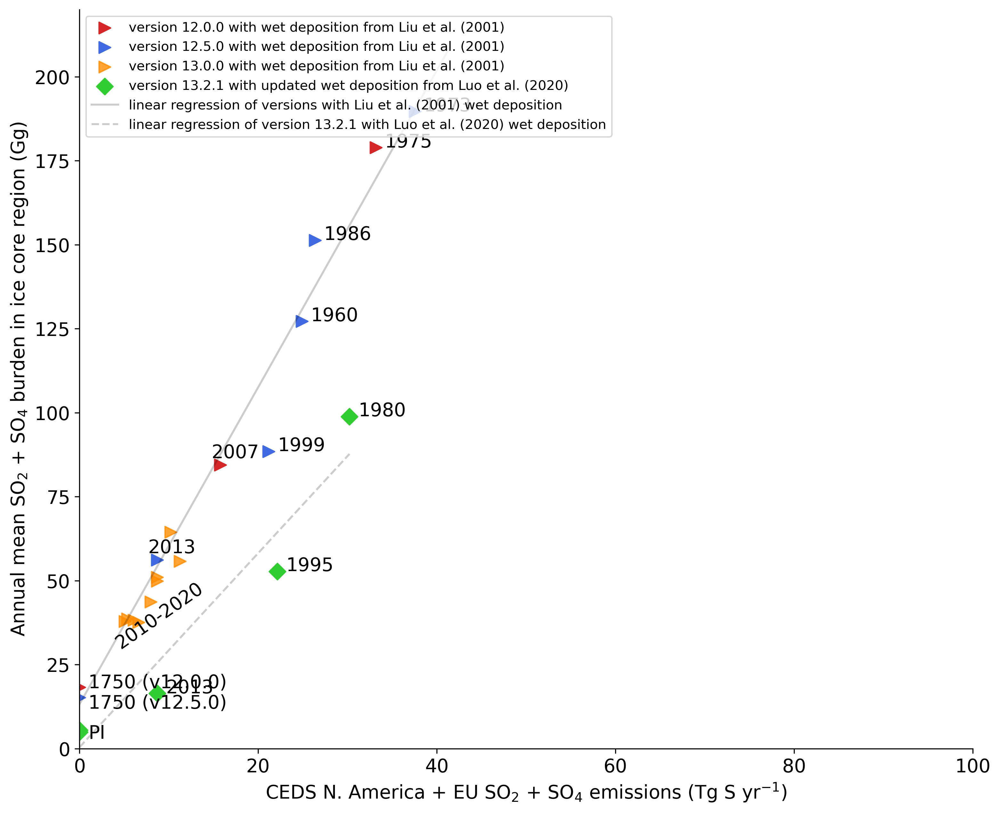

In [181]:
fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[12,10],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=14
size=75
m1 = '>'
m2 = 'D'
pltxs = np.linspace(0,anthro_emiss_1973+anthro_emiss_1973/10,10)
pltys = pltxs*slope_v12+intercept_v12
pltxs = pltxs*1e-9
pltys = pltys*1e-6
# ax.scatter(xs,ys,marker='s',s=size,
#                color='maroon',label='estimates from GEOS-Chem',alpha=aa)
ax.scatter(anthro_emiss_1750*1e-9, burden_1750_sh*1e-6, marker=m1,s=size,# label='SH PI',
               color='royalblue')
ax.scatter(anthro_emiss_1750*1e-9, burden_1750_sz*1e-6, marker=m1,s=size,
           label = 'version 12.0.0 with wet deposition from Liu et al. (2001)', #label='SZ PI',
               color='tab:red')
ax.scatter(anthro_emiss_1975*1e-9, burden_1975*1e-6, marker=m1,s=size, #label='SZ 1975' ^,
               color='tab:red')
ax.scatter(anthro_emiss_2007*1e-9, burden_2007*1e-6, marker=m1,s=size, #label='SZ 2007' *, 
               color='tab:red')
ax.scatter(anthro_emiss_1960*1e-9, burden_1960_sh*1e-6, marker=m1,s=size, 
           label = 'version 12.5.0 with wet deposition from Liu et al. (2001)', #label='SH 1960' >, 
               color='royalblue')
ax.scatter(anthro_emiss_1973*1e-9, burden_1973_sh*1e-6, marker=m1,s=size, #label='SH 1973' <, 
               color='royalblue')
ax.scatter(anthro_emiss_1986*1e-9, burden_1986_sh*1e-6, marker=m1,s=size, #label='SH 1986' *, 
               color='royalblue')
ax.scatter(anthro_emiss_1999*1e-9, burden_1999_sh*1e-6, marker=m1,s=size, #label='SH 1999' o, 
               color='royalblue')
ax.scatter(anthro_emiss_2013*1e-9, burden_2013_sh*1e-6, marker=m1,s=size, # label='SH 2013' x, 
               color='royalblue')
ax.scatter(anthro_emiss_2010*1e-9, burden_bm2010*1e-6, marker=m1,s=size, alpha=0.8, 
           label = 'version 13.0.0 with wet deposition from Liu et al. (2001)', #label='BM 2010', 
               color='darkorange')
ax.scatter(anthro_emiss_2011*1e-9, burden_bm2011*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2011' x, 
               color='darkorange')
ax.scatter(anthro_emiss_2012*1e-9, burden_bm2012*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2012' *, 
               color='darkorange')
ax.scatter(anthro_emiss_2013*1e-9, burden_bm2013*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2013' >, 
               color='darkorange')
# ax.scatter(anthro_emiss_2014*1e-9, burden_bm2014*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2014' <, 
#                color='darkorange')
ax.scatter(anthro_emiss_2015*1e-9, burden_bm2015*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2015' ^, 
               color='darkorange')
ax.scatter(anthro_emiss_2016*1e-9, burden_bm2016*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2016' o, 
               color='darkorange')
ax.scatter(anthro_emiss_2017*1e-9, burden_bm2017*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2017' v, 
               color='darkorange')
ax.scatter(anthro_emiss_2018*1e-9, burden_bm2018*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2018' +, 
               color='darkorange')
ax.scatter(anthro_emiss_2019*1e-9, burden_bm2019*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2019' D, 
               color='darkorange')
ax.scatter(anthro_emiss_pi*1e-9, burden_pi*1e-6, marker=m2,s=size,  #label='UJ no anthro', 
               color='limegreen')
ax.scatter(anthro_emiss_pi*1e-9, burden_pi_met07*1e-6, marker=m2,s=size, 
           label = 'version 13.2.1 with updated wet deposition from Luo et al. (2020)', #label='UJ no anthro met07', 
               color='limegreen')
ax.scatter(anthro_emiss_1980*1e-9, burden_1980*1e-6, marker=m2,s=size, #label='UJ 1980', 
               color='limegreen')
ax.scatter(anthro_emiss_1995*1e-9, burden_1995*1e-6, marker=m2,s=size, #label='UJ 1995', 
               color='limegreen')
ax.scatter(anthro_emiss_2013*1e-9, burden_2013*1e-6, marker=m2,s=size, #label='UJ 2013', 
               color='limegreen')

ax.plot(pltxs,pltys,linestyle='-',color='k',linewidth=l, label='linear regression of versions with Liu et al. (2001) wet deposition',alpha = 0.2)
#          label='linear regression of GEOS-Chem burden from emissions')

pltxs = np.linspace(0,anthro_emiss_1980,10)
pltys = pltxs*slope_uj+intercept_uj
pltxs = pltxs*1e-9
pltys = pltys*1e-6

ax.plot(pltxs,pltys,linestyle='--',color='k',linewidth=l,label='linear regression of version 13.2.1 with Luo et al. (2020) wet deposition',alpha = 0.2)

ax.set_ylabel('Annual mean SO$_2$ + SO$_4$ burden in ice core region (Gg)',fontsize=j)
ax.set_xlabel('CEDS N. America + EU SO$_2$ + SO$_4$ emissions (Tg S yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
j=14
ax.legend(loc='upper left', fontsize= j-4)
factor=1e9*1e-9
factor2=1e5*1e-6
factor3 = 1e7*1e-6
ax.text(1e9*1e-9,1.8e7*1e-6,"1750 (v12.0.0)",fontsize=j)
ax.text(1e9*1e-9,1.2e7*1e-6,"1750 (v12.5.0)",fontsize=j)
# ax.text(1e9*1e-9,0,"v13 PI",fontsize=j)
ax.text(1e9*1e-9,3e6*1e-6,"PI",fontsize=j)
ax.text(anthro_emiss_1980*1e-9+factor,burden_1980*1e-6+factor2,"1980",fontsize=j)
ax.text(anthro_emiss_1995*1e-9+factor,burden_1995*1e-6+factor2,"1995",fontsize=j)
ax.text(anthro_emiss_2013*1e-9+factor,burden_2013*1e-6+factor2,"2013",fontsize=j)
ax.text(anthro_emiss_2007*1e-9-1*factor,burden_2007*1e-6+factor3/5,"2007",fontsize=j)
ax.text(anthro_emiss_1975*1e-9+factor,burden_1975*1e-6+factor2,"1975",fontsize=j)
ax.text(anthro_emiss_2013*1e-9-1*factor,burden_2013_sh*1e-6+factor3/5,"2013",fontsize=j)
ax.text(anthro_emiss_2013*1e-9-5*factor,burden_bm2013*1e-6-2.0*factor3,"2010-2020",fontsize=j,rotation=35)
# ax.text(anthro_emiss_2013+factor,burden_bm2013-factor3*10,"(yellow)",fontsize=j)
ax.text(anthro_emiss_1999*1e-9+factor,burden_1999_sh*1e-6+factor2,"1999",fontsize=j)
ax.text(anthro_emiss_1960*1e-9+factor,burden_1960_sh*1e-6+factor2,"1960",fontsize=j)
ax.text(anthro_emiss_1986*1e-9+factor,burden_1986_sh*1e-6+factor2,"1986",fontsize=j)
ax.text(anthro_emiss_1973*1e-9+factor,burden_1973_sh*1e-6+factor2,"1973",fontsize=j)
# ax.text(anthro_emiss_2013*1e-9-10*factor,burden_bm2014*1e-6+factor3/2,"Bárðarbunga eruption",fontsize=j-5)
# ax.text(anthro_emiss_2013*1e-9-10*factor,burden_bm2014*1e-6,"(Iceland, 2014)",fontsize=j-5)
# ax.text(anthro_emiss_2013*1e-9-10*factor,burden_bm2014*1e-6-factor3/2,"Not in regression",fontsize=j-5)

ax.set_ylim([0,220])
ax.set_xlim([0,100])
# plt.show()

Text(9.189068699862943, <xarray.DataArray ()>
array(11.96030548), '2013')

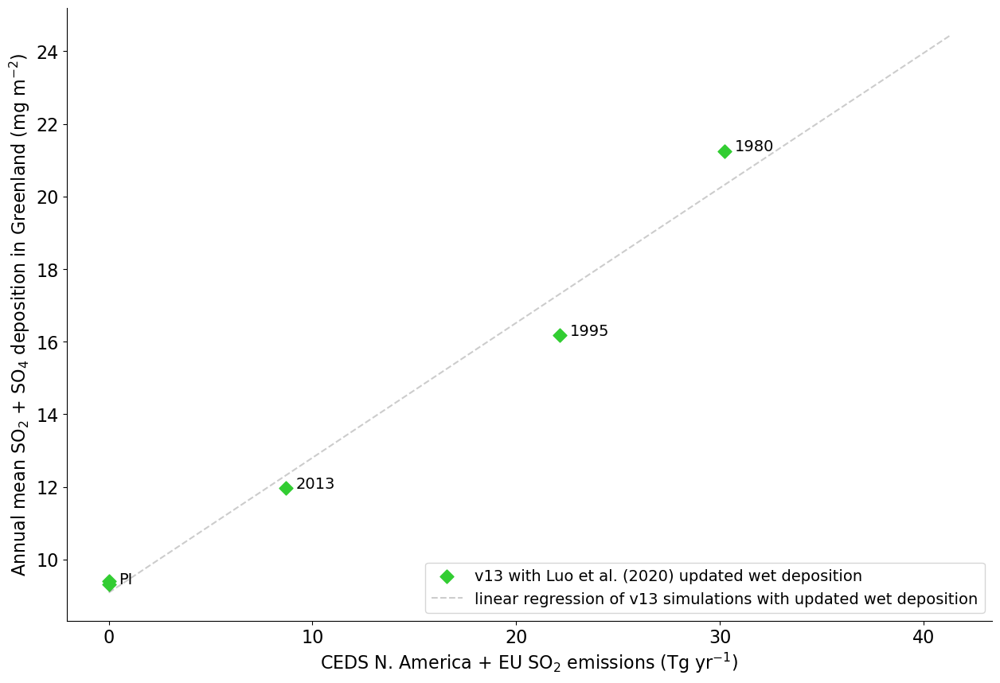

In [182]:
pltfactor=1
xs = np.array([anthro_emiss_pi,anthro_emiss_pi,anthro_emiss_1980,anthro_emiss_1995,anthro_emiss_2013])
ys = np.array([dep_mask_pi,dep_mask_pi_07,dep_mask_1980,dep_mask_1995,dep_mask_2013])
# ys = np.array([wetlossls_pi,wetlossls_pi_met07,wetlossls_1980,wetlossls_1995,wetlossls_2013])

slope_dep, intercept_dep, rvalue_dep, pvalue_dep, stderr_dep = stats.linregress(xs,ys)

fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[15,10])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=75
m1 = '>'
m2 = 'D'
pltxs = np.linspace(0,anthro_emiss_1973+anthro_emiss_1973/10,10)
pltys = pltxs*slope_dep+intercept_dep
pltxs = pltxs*1e-9
pltys = pltys*pltfactor

ax.scatter(anthro_emiss_pi*1e-9, dep_mask_pi*pltfactor, marker=m2,s=size, 
           label = 'v13 with Luo et al. (2020) updated wet deposition', #label='UJ no anthro met07', 
               color='limegreen')
ax.scatter(anthro_emiss_pi*1e-9, dep_mask_pi_07*pltfactor, marker=m2,s=size, color='limegreen')

ax.scatter(anthro_emiss_1980*1e-9, dep_mask_1980*pltfactor, marker=m2,s=size,color='limegreen')
ax.scatter(anthro_emiss_1995*1e-9, dep_mask_1995*pltfactor, marker=m2,s=size,color='limegreen')
ax.scatter(anthro_emiss_2013*1e-9, dep_mask_2013*pltfactor, marker=m2,s=size,color='limegreen')
# ax.scatter(xs*1e-9,ys*1e-6,color='limegreen',marker=m2,s=size)

ax.plot(pltxs,pltys,linestyle='--',color='k',linewidth=l,label='linear regression of v13 simulations with updated wet deposition',alpha = 0.2)

ax.set_ylabel('Annual mean SO$_2$ + SO$_4$ deposition in Greenland (mg m$^{-2}$)',fontsize=j)
ax.set_xlabel('CEDS N. America + EU SO$_2$ emissions (Tg yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
j=14
ax.legend(loc='lower right', fontsize= j)
factor=0.5e9*1e-9
factor2=0.0001
factor3 = 0.5e7*1e-6
ax.text(anthro_emiss_pi*1e-9+factor,dep_mask_pi*pltfactor+factor2,"PI",fontsize=j)
# ax.text(anthro_emiss_pi*1e-9+factor,dep_pi_met07*1e-6+3e16,"PI Met 07",fontsize=j)
ax.text(anthro_emiss_1995*1e-9+factor,dep_mask_1995*pltfactor+factor2,"1995",fontsize=j)
ax.text(anthro_emiss_1980*1e-9+factor,dep_mask_1980*pltfactor+factor2,"1980",fontsize=j)
ax.text(anthro_emiss_2013*1e-9+factor,dep_mask_2013*pltfactor+factor2,"2013",fontsize=j)


Text(9.189068699862943, <xarray.DataArray ()>
array(1.77675006)
Coordinates:
    time     datetime64[ns] 2013-12-16T12:00:00, '2013')

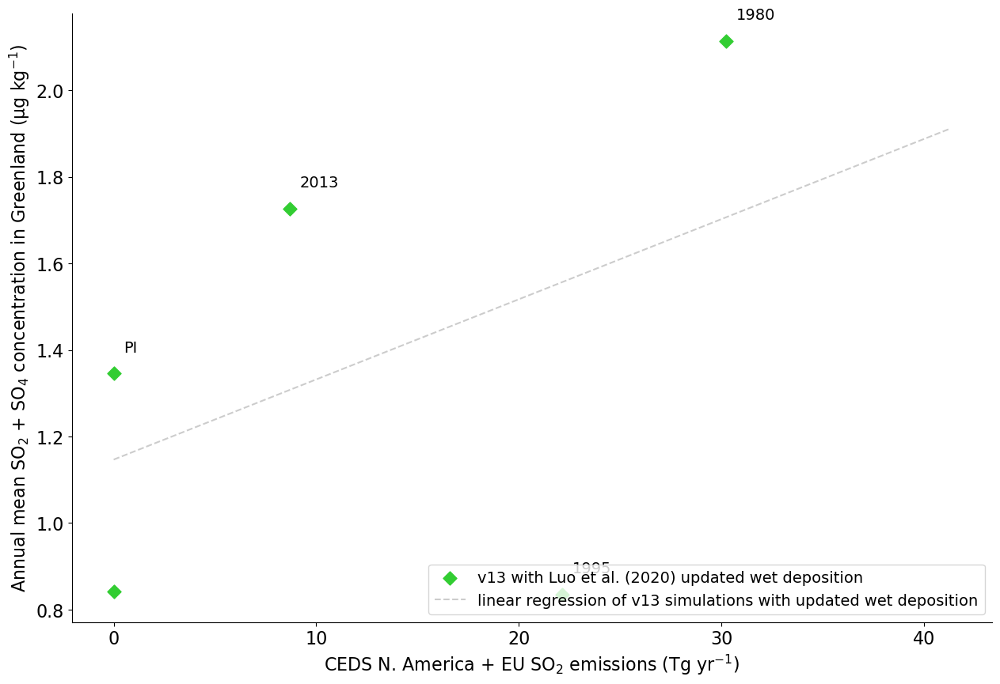

In [183]:
pltfactor=1
xconc = xs2
yconc = np.array([conc_ug_kg_pi,conc_ug_kg_pi_07,conc_ug_kg_1980,conc_ug_kg_1995,conc_ug_kg_2013])
# ys = np.array([wetlossls_pi,wetlossls_pi_met07,wetlossls_1980,wetlossls_1995,wetlossls_2013])

slope_conc, intercept_conc, rvalue_conc, pvalue_conc, stderr_conc = stats.linregress(xconc,yconc)

fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[15,10])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=75
m1 = '>'
m2 = 'D'
pltxs = np.linspace(0,anthro_emiss_1973+anthro_emiss_1973/10,10)
pltys = pltxs*slope_conc+intercept_conc
pltxs = pltxs*1e-9
pltys = pltys*pltfactor

ax.scatter(anthro_emiss_pi*1e-9, conc_ug_kg_pi*pltfactor, marker=m2,s=size, 
           label = 'v13 with Luo et al. (2020) updated wet deposition', #label='UJ no anthro met07', 
               color='limegreen')
ax.scatter(anthro_emiss_pi*1e-9, conc_ug_kg_pi_07*pltfactor, marker=m2,s=size, color='limegreen')

ax.scatter(anthro_emiss_1980*1e-9, conc_ug_kg_1980*pltfactor, marker=m2,s=size,color='limegreen')
ax.scatter(anthro_emiss_1995*1e-9, conc_ug_kg_1995*pltfactor, marker=m2,s=size,color='limegreen')
ax.scatter(anthro_emiss_2013*1e-9, conc_ug_kg_2013*pltfactor, marker=m2,s=size,color='limegreen')
# ax.scatter(xs*1e-9,ys*1e-6,color='limegreen',marker=m2,s=size)

ax.plot(pltxs,pltys,linestyle='--',color='k',linewidth=l,label='linear regression of v13 simulations with updated wet deposition',alpha = 0.2)

ax.set_ylabel('Annual mean SO$_2$ + SO$_4$ concentration in Greenland (µg kg$^{-1}$)',fontsize=j)
ax.set_xlabel('CEDS N. America + EU SO$_2$ emissions (Tg yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
j=14
ax.legend(loc='lower right', fontsize= j)
factor=0.5e9*1e-9
factor2=0.5e5*1e-6
factor3 = 0.5e7*1e-6
ax.text(anthro_emiss_pi*1e-9+factor,conc_ug_kg_pi*pltfactor+factor2,"PI",fontsize=j)
# ax.text(anthro_emiss_pi*1e-9+factor,dep_pi_met07*1e-6+3e16,"PI Met 07",fontsize=j)
ax.text(anthro_emiss_1995*1e-9+factor,conc_ug_kg_1995*pltfactor+factor2,"1995",fontsize=j)
ax.text(anthro_emiss_1980*1e-9+factor,conc_ug_kg_1980*pltfactor+factor2,"1980",fontsize=j)
ax.text(anthro_emiss_2013*1e-9+factor,conc_ug_kg_2013*pltfactor+factor2,"2013",fontsize=j)


In [48]:
# drydep_pi = drydep_SO2_kg_pi + drydep_SO4_kg_pi
# drydep_pi_met07 = drydep_SO2_kg_pi_07 + drydep_SO4_kg_pi_07
# drydep_1980 = drydep_SO2_kg_1980 + drydep_SO4_kg_1980
# drydep_1995 = drydep_SO2_kg_1995 + drydep_SO4_kg_1995
# drydep_2013 = drydep_SO2_kg_2013 + drydep_SO4_kg_2013

# wetlossls_pi = SO2_wetlossls_kg_pi + SO4_wetlossls_kg_pi
# wetlossls_pi_met07 = SO2_wetlossls_kg_pi_07 + SO4_wetlossls_kg_pi_07
# wetlossls_1980 = SO2_wetlossls_kg_1980 + SO4_wetlossls_kg_1980
# wetlossls_1995 = SO2_wetlossls_kg_1995 + SO4_wetlossls_kg_1995
# wetlossls_2013 = SO2_wetlossls_kg_2013 + SO4_wetlossls_kg_2013

# wetlossconv_pi = SO2_wetlossconv_kg_pi + SO4_wetlossconv_kg_pi
# wetlossconv_pi_met07 = SO2_wetlossconv_kg_pi_07 + SO4_wetlossconv_kg_pi_07
# wetlossconv_1980 = SO2_wetlossconv_kg_1980 + SO4_wetlossconv_kg_1980
# wetlossconv_1995 = SO2_wetlossconv_kg_1995 + SO4_wetlossconv_kg_1995
# wetlossconv_2013 = SO2_wetlossconv_kg_2013 + SO4_wetlossconv_kg_2013

# totaldep_pi = drydep_pi + wetlossls_pi + wetlossconv_pi
# totaldep_pi_met07 = drydep_pi_met07 + wetlossls_pi_met07 + wetlossconv_pi_met07
# totaldep_1980 = drydep_1980 + wetlossls_1980 + wetlossconv_1980
# totaldep_1995 = drydep_1995 + wetlossls_1995 + wetlossconv_1995
# totaldep_2013 = drydep_2013 + wetlossls_2013 + wetlossconv_2013


In [49]:
# burden_pi = (volc_SO4_burden_nolev_S[:,33:46,12:42] + volc_SO2_burden_nolev_S[:,33:46,12:42]).mean(dim='time').sum(dim=('lat','lon'))
# burden_pi_met07 = (volc_SO4_burden_nolev_S_met07[:,33:46,12:42] + volc_SO2_burden_nolev_S_met07[:,33:46,12:42]).mean(dim='time').sum(dim=('lat','lon'))
# burden_1980 = ((SO2_burden_S_1980[:,33:46,12:42] + SO4_burden_S_1980[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
# burden_1995 = ((SO2_burden_S_1995[:,33:46,12:42] + SO4_burden_S_1995[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))
# burden_2013 = ((anthdef_SO4_burden_nolev_S[:,33:46,12:42] + anthdef_SO2_burden_nolev_S[:,33:46,12:42])).mean(dim='time').sum(dim=('lat','lon'))


In [184]:
# Now reconstruct burden over time period from Smith et al. 2011 using the x values from the spreadsheet and the 
# slope calculated above
recon_y_uj = np.zeros([len(na_eu_su_emiss_ceds)])
recon_y_v12 = np.zeros([len(na_eu_su_emiss_ceds)])
recon_y_dep = np.zeros([len(na_eu_su_emiss_ceds)])
recon_y_conc = np.zeros([len(na_eu_su_emiss_ceds)])

for i in range(0,len(na_eu_su_emiss_ceds)): 
    recon_y_uj[i] = np.sum(na_eu_su_emiss_ceds[i] * slope_uj + intercept_uj) 
    recon_y_v12[i] = np.sum(na_eu_su_emiss_ceds[i] * slope_v12 + intercept_v12)
    recon_y_dep[i] = na_eu_su_emiss_ceds[i] * slope_dep + intercept_dep
    recon_y_conc[i] = na_eu_su_emiss_ceds[i] * slope_conc + intercept_conc



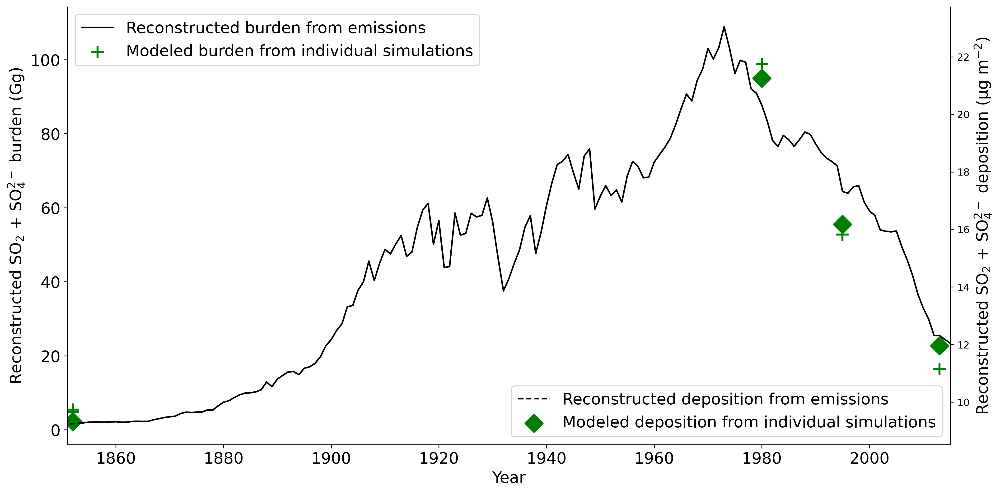

In [185]:
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=[16,8],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)

j=16
ax.set_xlim([1851,2015])
# ax.set_ylim([0,1e2])
ax.set_ylabel('Reconstructed SO$_2$ + SO$_4^{2-}$ burden (Gg)',fontsize=j)
ax.set_xlabel('Year',fontsize=j)

ax.tick_params(labelsize=j)
m2 = '+'
m3 = 'D'
size=150
ax.plot(ceds_yrs,recon_y_uj*1e-6,color='k',label = 'Reconstructed burden from emissions')
# ax.plot(ceds_yrs,recon_y_v12,color='k',linestyle = '--',label = 'v12 without updated wet deposition')
ax.scatter(1852, burden_pi_met07*1e-6, marker=m2,s=size, linewidth = 2,
           label = 'Modeled burden from individual simulations', #label='UJ no anthro met07', 
               color='green')
ax.scatter(1852, burden_pi*1e-6, marker=m2,s=size, linewidth = 2,
           #label='UJ no anthro met07', 
               color='green')
ax.scatter(1980, burden_1980*1e-6, marker=m2,s=size,linewidth = 2, #label='UJ 1980', 
               color='green')
ax.scatter(1995, burden_1995*1e-6, marker=m2,s=size,linewidth = 2, #label='UJ 1995', 
               color='green')
ax.scatter(2013, burden_2013*1e-6, marker=m2,s=size,linewidth = 2, #label='UJ 2013', 
               color='green')

ax2 = ax.twinx()
ax2.set_ylabel('Reconstructed SO$_2$ + SO$_4^{2-}$ deposition (µg m$^{-2}$)',fontsize=j)

ax2.plot(ceds_yrs,recon_y_dep*pltfactor,linestyle='--',color='k',label = 'Reconstructed deposition from emissions')
ax2.scatter(1852, dep_mask_pi*pltfactor, marker=m3,s=size, linewidth = 2,
           label = 'Modeled deposition from individual simulations', #label='UJ no anthro met07', 
               color='green')
# ax.scatter(1852, burden_pi*1e-6, marker=m2,s=size, linewidth = 2,
#            #label='UJ no anthro met07', 
#                color='green')
ax2.scatter(1980, dep_mask_1980*pltfactor, marker=m3,s=size,linewidth = 2, #label='UJ 1980', 
               color='green')
ax2.scatter(1995, dep_mask_1995*pltfactor, marker=m3,s=size,linewidth = 2, #label='UJ 1995', 
               color='green')
ax2.scatter(2013, dep_mask_2013*pltfactor, marker=m3,s=size,linewidth = 2, #label='UJ 2013', 
               color='green')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(loc='upper left',fontsize=j)
ax2.spines['top'].set_visible(False)
ax2.legend(loc='lower right',fontsize=j)

## Bayesian inference regression

https://www.quantstart.com/articles/Bayesian-Linear-Regression-Models-with-PyMC3/

uncertainty factors:
- anthropogenic emissions of SO$_2$: "For  all  years  with  over-lapping  data  between  1990  and  2015,  the  absolute  magni-tude  of  global  emissions  is  within ±15 %  for  NOx,  SO2, NH3,  and  BC;  within  22 %  for  CO  and  OC;  and  within 50 % for NMVOCs." where that is a 5–95% interval, i.e. 2sigma. So 1sigma is 7.5%
- intercept uncertainty: assume difference between 2007 and 2013 PI burden is 1sigma?

Input X as a distribution with mean = emissions, sigma = 7% of emissions. Y is a normal distribution with mean = burden and distribution = 15% of burden. linear regress this with MCMC

In [186]:
f1 = 0.075 # standard deviation of CEDS emissions, where the 5 to 95% range is 15%
X0 = np.random.normal(loc=xs2[0],scale=anthro_emiss_1750*f1,size=100)
X0[X0<0] = 0
X1 = np.random.normal(loc=xs2[1],scale=anthro_emiss_1750*f1,size=100)
X1[X1<0] = 0
X2 = np.random.normal(loc=xs2[2],scale=xs2[2]*f1,size=100)
X3 = np.random.normal(loc=xs2[3],scale=xs2[3]*f1,size=100)
X4 = np.random.normal(loc=xs2[4],scale=xs2[4]*f1,size=100)

X = np.vstack([X0,X1,X2,X3,X4])

f2 = 1 # assume standard deviation of burden is equal to PI burden
pi = (burden_pi + burden_pi_met07)/2
Y0 = np.random.normal(loc=ys2[0],scale=pi*f2,size=100)
Y1 = np.random.normal(loc=ys2[1],scale=pi*f2,size=100)
Y2 = np.random.normal(loc=ys2[2],scale=pi*f2,size=100)
Y3 = np.random.normal(loc=ys2[3],scale=pi*f2,size=100)
Y4 = np.random.normal(loc=ys2[4],scale=pi*f2,size=100)

Y = np.vstack([Y0,Y1,Y2,Y3,Y4])

In [187]:
f1 = 0.075 # standard deviation of CEDS emissions, where the 5 to 95% range is 15%
X0 = np.random.normal(loc=xs[0],scale=anthro_emiss_1750*f1,size=100)
X0[X0<0] = 0
X1 = np.random.normal(loc=xs[1],scale=anthro_emiss_1750*f1,size=100)
X1[X1<0] = 0
X2 = np.random.normal(loc=xs[2],scale=xs2[2]*f1,size=100)
X3 = np.random.normal(loc=xs[3],scale=xs2[3]*f1,size=100)
X4 = np.random.normal(loc=xs[4],scale=xs2[4]*f1,size=100)

Xdep = np.vstack([X0,X1,X2,X3,X4])*1e-9

f2 = 1 # assume standard deviation of burden is difference between two modeled PI burden
pi = np.abs(dep_mask_pi - dep_mask_pi_07)*2
Y0 = np.random.normal(loc=ys[0],scale=pi*f2,size=100)
Y1 = np.random.normal(loc=ys[1],scale=pi*f2,size=100)
Y2 = np.random.normal(loc=ys[2],scale=pi*f2,size=100)
Y3 = np.random.normal(loc=ys[3],scale=pi*f2,size=100)
Y4 = np.random.normal(loc=ys[4],scale=pi*f2,size=100)

Ydep = np.vstack([Y0,Y1,Y2,Y3,Y4])

In [188]:
f1 = 0.075 # standard deviation of CEDS emissions, where the 5 to 95% range is 15%
X0 = np.random.normal(loc=xs2[0],scale=anthro_emiss_1750*f1,size=100)
X0[X0<0] = 0
X1 = np.random.normal(loc=xs2[1],scale=anthro_emiss_1750*f1,size=100)
X1[X1<0] = 0
X2 = np.random.normal(loc=xs2[2],scale=xs2[2]*f1,size=100)
X3 = np.random.normal(loc=xs2[3],scale=xs2[3]*f1,size=100)
X4 = np.random.normal(loc=xs2[4],scale=xs2[4]*f1,size=100)

Xconc = np.vstack([X0,X1,X2,X3,X4])

f2 = 1 # assume standard deviation of burden is difference between two modeled PI burden
pi = (yconc[0] - yconc[1])
Y0 = np.random.normal(loc=yconc[0],scale=pi*f2,size=100)
Y1 = np.random.normal(loc=yconc[1],scale=pi*f2,size=100)
Y2 = np.random.normal(loc=yconc[2],scale=pi*f2,size=100)
Y3 = np.random.normal(loc=yconc[3],scale=pi*f2,size=100)
Y4 = np.random.normal(loc=yconc[4],scale=pi*f2,size=100)

Yconc = np.vstack([Y0,Y1,Y2,Y3,Y4])

In [189]:
f1 = 0.075 # standard deviation of CEDS emissions, where the 5 to 95% range is 15%
X0v12 = np.random.normal(loc=xs6[0],scale=anthro_emiss_1750*f1,size=100)
X0v12[X0v12<0] = 0
X1v12 = np.random.normal(loc=xs6[1],scale=anthro_emiss_1750*f1,size=100)
X1v12[X1v12<0] = 0
X2v12 = np.random.normal(loc=xs6[2],scale=xs2[2]*f1,size=100)
X3v12 = np.random.normal(loc=xs6[3],scale=xs2[3]*f1,size=100)
X4v12 = np.random.normal(loc=xs6[4],scale=xs2[4]*f1,size=100)
X5v12 = np.random.normal(loc=xs6[5],scale=xs2[4]*f1,size=100)
X6v12 = np.random.normal(loc=xs6[6],scale=xs2[4]*f1,size=100)
X7v12 = np.random.normal(loc=xs6[7],scale=xs2[4]*f1,size=100)
X8v12 = np.random.normal(loc=xs6[8],scale=xs2[4]*f1,size=100)

Xv12 = np.vstack([X0v12,X1v12,X2v12,X3v12,X4v12,X5v12,X6v12,X7v12,X8v12])

f2 = 1 # assume standard deviation of burden is equal to PI burden
piv12 = (burden_1750_sh + burden_1750_sz)/2
Y0v12 = np.random.normal(loc=ys6[0],scale=piv12*f2,size=100)
Y1v12 = np.random.normal(loc=ys6[1],scale=piv12*f2,size=100)
Y2v12 = np.random.normal(loc=ys6[2],scale=piv12*f2,size=100)
Y3v12 = np.random.normal(loc=ys6[3],scale=piv12*f2,size=100)
Y4v12 = np.random.normal(loc=ys6[4],scale=piv12*f2,size=100)
Y5v12 = np.random.normal(loc=ys6[5],scale=piv12*f2,size=100)
Y6v12 = np.random.normal(loc=ys6[6],scale=piv12*f2,size=100)
Y7v12 = np.random.normal(loc=ys6[7],scale=piv12*f2,size=100)
Y8v12 = np.random.normal(loc=ys6[8],scale=piv12*f2,size=100)

Yv12 = np.vstack([Y0v12,Y1v12,Y2v12,Y3v12,Y4v12,Y5v12,Y6v12,Y7v12,Y8v12])

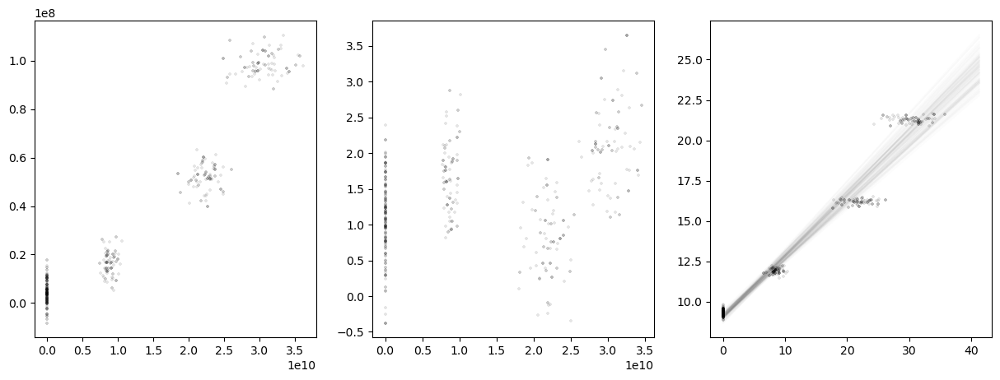

In [190]:
fig,ax = plt.subplots(ncols=3,nrows=1,figsize=[15,5])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.1)

size=5
slopes = np.array([])
slopesv12 = np.array([])
slopes_dep = np.array([])
slopes_conc = np.array([])
intercepts = np.array([])
interceptsv12 = np.array([])
intercepts_dep = np.array([])
intercepts_conc = np.array([])
xpnts = np.linspace(xs2[0],anthro_emiss_1973+anthro_emiss_1973/10,100)

for i in range(0,100,1):
    j = int(np.random.rand()*100)
    k = int(np.random.rand()*100)
    slope, intercept, rvalue, pvalue, stderr = stats.linregress(X[:,j],Y[:,k])
    slopev12, interceptv12, rvaluev12, pvaluev12, stderrv12 = stats.linregress(Xv12[:,j],Yv12[:,k])
    slope_dep, intercept_dep, rvalue_dep, pvalue_dep, stderr_dep = stats.linregress(Xdep[:,j],Ydep[:,k])
    slope_conc, intercept_conc, rvalue_conc, pvalue_conc, stderr_conc = stats.linregress(Xconc[:,j],Yconc[:,k])
    slopes = np.hstack([slopes,slope])
    intercepts = np.hstack([intercepts,intercept])
    slopes_conc = np.hstack([slopes_conc,slope_conc])
    intercepts_conc = np.hstack([intercepts_conc,intercept_conc])
    slopesv12 = np.hstack([slopesv12,slopev12])
    slopes_dep = np.hstack([slopes_dep,slope_dep])
    intercepts_dep = np.hstack([intercepts_dep,intercept_dep])
    interceptsv12 = np.hstack([interceptsv12,interceptv12])
    ax[0].scatter(X[:,j],Y[:,j],marker=m2,color='k',s=size,alpha=0.1)
#     ax[0].plot(xpnts,xpnts*slope+intercept,color='k',alpha=0.01)
    ax[1].scatter(Xconc[:,j],Yconc[:,j],marker=m2,color='k',s=size,alpha=0.1)
#     ax[1].plot(xpnts,xpnts*slope_conc+intercept_conc,color='k',alpha=0.01)
    ax[2].scatter(Xdep[:,j],Ydep[:,j],marker=m2,color='k',s=size,alpha=0.1)
    ax[2].plot(xpnts*1e-9,xpnts*1e-9*slope_dep+intercept_dep,color='k',alpha=0.01)

In [191]:
def glm_mcmc_inference(df, iterations):
    # Create the glm using the Bambi model syntax
    model = bmb.Model("y ~ x", df)

    # Fit the model using a NUTS (No-U-Turn Sampler) 
    trace = model.fit(
        draws=iterations,
        tune=500,
        discard_tuned_samples=True,
        chains=1, 
        progressbar=True)
    return trace

def plot_glm_model(trace):
    pm.plot_trace(trace)
    plt.tight_layout()
    plt.show()

In [192]:
if __name__ == "__main__":
    
    df = pd.DataFrame( #take linear simulated data from above
        {"x": X.reshape(500),
         "y": Y.reshape(500)
        })
    dfv12 = pd.DataFrame( #take linear simulated data from above
        {"x": Xv12.reshape(900),
         "y": Yv12.reshape(900)
        })
    df_dep = pd.DataFrame( #take linear simulated data from above
        {"x": Xdep.reshape(500),
         "y": Ydep.reshape(500)
        })
    
    df_conc = pd.DataFrame( #take linear simulated data from above
        {"x": Xconc.reshape(500),
         "y": Yconc.reshape(500)
        })
    
#     trace = glm_mcmc_inference(df, 500)
#     tracev12 = glm_mcmc_inference(dfv12, 500)
    trace_dep = glm_mcmc_inference(df_dep, 500)
#     trace_conc = glm_mcmc_inference(df_conc, 500)
    bayes_intercept = trace['posterior'].Intercept.values
    bayes_slope = trace['posterior'].x.values
    bayes_interceptv12 = tracev12['posterior'].Intercept.values
    bayes_slopev12 = tracev12['posterior'].x.values
    bayes_intercept_dep = trace_dep['posterior'].Intercept.values
    bayes_slope_dep = trace_dep['posterior'].x.values
    bayes_intercept_conc = trace_conc['posterior'].Intercept.values
    bayes_slope_conc = trace_conc['posterior'].x.values
#     plot_glm_model(trace)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (1 chains in 1 job)
NUTS: [Intercept, x, y_sigma]


Sampling 1 chain for 500 tune and 500 draw iterations (500 + 500 draws total) took 2 seconds.


In [193]:
np.mean(bayes_intercept_dep)

9.12870203535281

In [194]:
np.mean(intercepts_dep)

9.108929421569195

(0.0, 100.0)

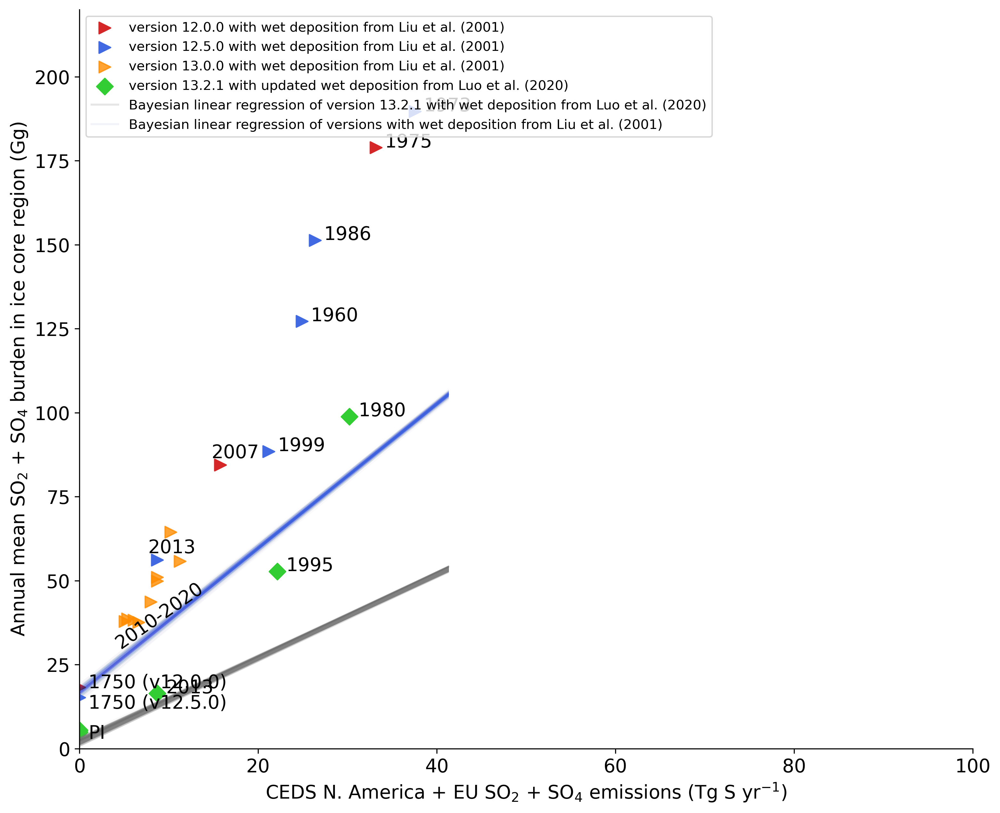

In [195]:
fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[12,10],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=14
size=75
m1 = '>'
m2 = 'D'
# pltxs = np.linspace(0,anthro_emiss_1973+anthro_emiss_1973/5,10)
# pltys = pltxs*slope_v12+intercept_v12
# pltxs = pltxs*1e-9
# pltys = pltys*1e-6

for i in range(0,1000,1):
    l = int(np.random.rand()*1000)
    k = int(np.random.rand()*1000)
#     plt.scatter(X[:,l],Y[:,k],marker=m2,color='k',s=size,alpha=0.1)
    plt.plot(xpnts*1e-9,(xpnts*bayes_slope[0,i]+bayes_intercept[0,i])*1e-6,color='gray',linewidth=0.5,alpha=0.07)
    plt.plot(xpnts*1e-9,(xpnts*bayes_slopev12[0,i]+bayes_interceptv12[0,i])*1e-6,
             color='royalblue',linewidth=0.5,alpha=0.008)

# ax.scatter(xs,ys,marker='s',s=size,
#                color='maroon',label='estimates from GEOS-Chem',alpha=aa)
ax.scatter(anthro_emiss_1750*1e-9, burden_1750_sh*1e-6, marker=m1,s=size,# label='SH PI',
               color='royalblue')
ax.scatter(anthro_emiss_1750*1e-9, burden_1750_sz*1e-6, marker=m1,s=size,
           label = 'version 12.0.0 with wet deposition from Liu et al. (2001)', #label='SZ PI',
               color='tab:red')
ax.scatter(anthro_emiss_1975*1e-9, burden_1975*1e-6, marker=m1,s=size, #label='SZ 1975' ^,
               color='tab:red')
ax.scatter(anthro_emiss_2007*1e-9, burden_2007*1e-6, marker=m1,s=size, #label='SZ 2007' *, 
               color='tab:red')
ax.scatter(anthro_emiss_1960*1e-9, burden_1960_sh*1e-6, marker=m1,s=size, 
           label = 'version 12.5.0 with wet deposition from Liu et al. (2001)', #label='SH 1960' >, 
               color='royalblue')
ax.scatter(anthro_emiss_1973*1e-9, burden_1973_sh*1e-6, marker=m1,s=size, #label='SH 1973' <, 
               color='royalblue')
ax.scatter(anthro_emiss_1986*1e-9, burden_1986_sh*1e-6, marker=m1,s=size, #label='SH 1986' *, 
               color='royalblue')
ax.scatter(anthro_emiss_1999*1e-9, burden_1999_sh*1e-6, marker=m1,s=size, #label='SH 1999' o, 
               color='royalblue')
ax.scatter(anthro_emiss_2013*1e-9, burden_2013_sh*1e-6, marker=m1,s=size, # label='SH 2013' x, 
               color='royalblue')
ax.scatter(anthro_emiss_2010*1e-9, burden_bm2010*1e-6, marker=m1,s=size, alpha=0.8, 
           label = 'version 13.0.0 with wet deposition from Liu et al. (2001)', #label='BM 2010', 
               color='darkorange')
ax.scatter(anthro_emiss_2011*1e-9, burden_bm2011*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2011' x, 
               color='darkorange')
ax.scatter(anthro_emiss_2012*1e-9, burden_bm2012*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2012' *, 
               color='darkorange')
ax.scatter(anthro_emiss_2013*1e-9, burden_bm2013*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2013' >, 
               color='darkorange')
# ax.scatter(anthro_emiss_2014*1e-9, burden_bm2014*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2014' <, 
#                color='darkorange')
ax.scatter(anthro_emiss_2015*1e-9, burden_bm2015*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2015' ^, 
               color='darkorange')
ax.scatter(anthro_emiss_2016*1e-9, burden_bm2016*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2016' o, 
               color='darkorange')
ax.scatter(anthro_emiss_2017*1e-9, burden_bm2017*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2017' v, 
               color='darkorange')
ax.scatter(anthro_emiss_2018*1e-9, burden_bm2018*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2018' +, 
               color='darkorange')
ax.scatter(anthro_emiss_2019*1e-9, burden_bm2019*1e-6, marker=m1,s=size, alpha=0.8, #label='BM 2019' D, 
               color='darkorange')
ax.scatter(anthro_emiss_pi*1e-9, burden_pi*1e-6, marker=m2,s=size,  #label='UJ no anthro', 
               color='limegreen')
ax.scatter(anthro_emiss_pi*1e-9, burden_pi_met07*1e-6, marker=m2,s=size, 
           label = 'version 13.2.1 with updated wet deposition from Luo et al. (2020)', color='limegreen')
           #label='UJ no anthro met07'
ax.scatter(anthro_emiss_1980*1e-9, burden_1980*1e-6, marker=m2,s=size, #label='UJ 1980', 
               color='limegreen')
ax.scatter(anthro_emiss_1995*1e-9, burden_1995*1e-6, marker=m2,s=size, #label='UJ 1995', 
               color='limegreen')
ax.scatter(anthro_emiss_2013*1e-9, burden_2013*1e-6, marker=m2,s=size, #label='UJ 2013', 
               color='limegreen')

plt.plot(xpnts*1e-9,(xpnts*bayes_slope[0,1]+bayes_intercept[0,1])*1e-6,color='k',alpha=0.1,
         label='Bayesian linear regression of version 13.2.1 with wet deposition from Luo et al. (2020)')
plt.plot(xpnts*1e-9,(xpnts*bayes_slopev12[0,1]+bayes_interceptv12[0,1])*1e-6,color='darkblue',alpha=0.05,
         label='Bayesian linear regression of versions with wet deposition from Liu et al. (2001)')



ax.set_ylabel('Annual mean SO$_2$ + SO$_4$ burden in ice core region (Gg)',fontsize=j)
ax.set_xlabel('CEDS N. America + EU SO$_2$ + SO$_4$ emissions (Tg S yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
j=14
ax.legend(loc='upper left', fontsize= j-4)
factor=1e9*1e-9
factor2=1e5*1e-6
factor3 = 1e7*1e-6
ax.text(1e9*1e-9,1.8e7*1e-6,"1750 (v12.0.0)",fontsize=j)
ax.text(1e9*1e-9,1.2e7*1e-6,"1750 (v12.5.0)",fontsize=j)
# ax.text(1e9*1e-9,0,"v13 PI",fontsize=j)
ax.text(1e9*1e-9,3e6*1e-6,"PI",fontsize=j)
ax.text(anthro_emiss_1980*1e-9+factor,burden_1980*1e-6+factor2,"1980",fontsize=j)
ax.text(anthro_emiss_1995*1e-9+factor,burden_1995*1e-6+factor2,"1995",fontsize=j)
ax.text(anthro_emiss_2013*1e-9+factor,burden_2013*1e-6+factor2,"2013",fontsize=j)
ax.text(anthro_emiss_2007*1e-9-1*factor,burden_2007*1e-6+factor3/5,"2007",fontsize=j)
ax.text(anthro_emiss_1975*1e-9+factor,burden_1975*1e-6+factor2,"1975",fontsize=j)
ax.text(anthro_emiss_2013*1e-9-1*factor,burden_2013_sh*1e-6+factor3/5,"2013",fontsize=j)
ax.text(anthro_emiss_2013*1e-9-5*factor,burden_bm2013*1e-6-2.0*factor3,"2010-2020",fontsize=j,rotation=35)
# ax.text(anthro_emiss_2013+factor,burden_bm2013-factor3*10,"(yellow)",fontsize=j)
ax.text(anthro_emiss_1999*1e-9+factor,burden_1999_sh*1e-6+factor2,"1999",fontsize=j)
ax.text(anthro_emiss_1960*1e-9+factor,burden_1960_sh*1e-6+factor2,"1960",fontsize=j)
ax.text(anthro_emiss_1986*1e-9+factor,burden_1986_sh*1e-6+factor2,"1986",fontsize=j)
ax.text(anthro_emiss_1973*1e-9+factor,burden_1973_sh*1e-6+factor2,"1973",fontsize=j)
# ax.text(anthro_emiss_2013*1e-9-10*factor,burden_bm2014*1e-6+factor3/2,"Bárðarbunga eruption",fontsize=j-5)
# ax.text(anthro_emiss_2013*1e-9-10*factor,burden_bm2014*1e-6,"(Iceland, 2014)",fontsize=j-5)
# ax.text(anthro_emiss_2013*1e-9-10*factor,burden_bm2014*1e-6-factor3/2,"Not in regression",fontsize=j-5)

ax.set_ylim([0,220])
ax.set_xlim([0,100])
# plt.show()

Text(9.189068699862943, <xarray.DataArray ()>
array(11.96120548), '2013')

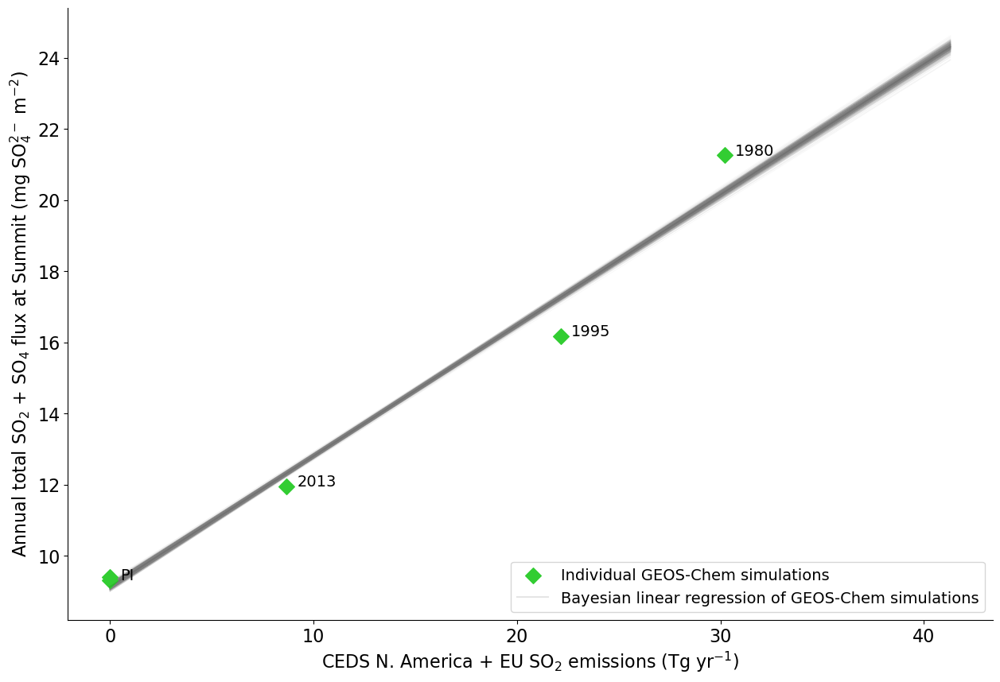

In [351]:
pltfactor=1
fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[15,10])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=100
m1 = '>'
m2 = 'D'
pltxs = np.linspace(0,anthro_emiss_1973+anthro_emiss_1973/10,10)
pltys = pltxs*slope_dep+intercept_dep
pltxs = pltxs*1e-9
pltys = pltys*pltfactor

for i in range(0,500,1):
    l = int(np.random.rand()*500)
    k = int(np.random.rand()*500)
#     plt.scatter(X[:,l],Y[:,k],marker=m2,color='k',s=size,alpha=0.1)
    plt.plot(xpnts*1e-9,(xpnts*1e-9*bayes_slope_dep[0,i]+bayes_intercept_dep[0,i])*pltfactor,
             color='gray',linewidth=0.5,alpha=0.07)

ax.scatter(anthro_emiss_pi*1e-9, dep_mask_pi*pltfactor, marker=m2,s=size, 
           label = 'Individual GEOS-Chem simulations', #label='UJ no anthro met07', 
               color='limegreen',zorder=2)
ax.scatter(anthro_emiss_pi*1e-9, dep_mask_pi_07*pltfactor, marker=m2,s=size, color='limegreen',zorder=2)

ax.scatter(anthro_emiss_1980*1e-9, dep_mask_1980*pltfactor, marker=m2,s=size,color='limegreen',zorder=2)
ax.scatter(anthro_emiss_1995*1e-9, dep_mask_1995*pltfactor, marker=m2,s=size,color='limegreen',zorder=2)
ax.scatter(anthro_emiss_2013*1e-9, dep_mask_2013*pltfactor, marker=m2,s=size,color='limegreen',zorder=2)
# ax.scatter(xs*1e-9,ys*1e-6,color='limegreen',marker=m2,s=size)

plt.plot(xpnts*1e-9,(xpnts*1e-9*np.mean(bayes_slope_dep[:])+np.mean(bayes_intercept_dep[:]))*pltfactor,color='k',alpha=0.1,
         label='Bayesian linear regression of GEOS-Chem simulations')

ax.set_ylabel('Annual total SO$_2$ + SO$_4$ flux at Summit (mg SO$_4^{2-}$ m$^{-2}$)',fontsize=j)
ax.set_xlabel('CEDS N. America + EU SO$_2$ emissions (Tg yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
j=14
ax.legend(loc='lower right', fontsize= j)
factor=0.5e9*1e-9
factor2=0.001
factor3 = 0.5e7*1e-6
ax.text(anthro_emiss_pi*1e-9+factor,dep_mask_pi*pltfactor+factor2,"PI",fontsize=j)
# ax.text(anthro_emiss_pi*1e-9+factor,dep_pi_met07*1e-6+3e16,"PI Met 07",fontsize=j)
ax.text(anthro_emiss_1995*1e-9+factor,dep_mask_1995*pltfactor+factor2,"1995",fontsize=j)
ax.text(anthro_emiss_1980*1e-9+factor,dep_mask_1980*pltfactor+factor2,"1980",fontsize=j)
ax.text(anthro_emiss_2013*1e-9+factor,dep_mask_2013*pltfactor+factor2,"2013",fontsize=j)


Text(9.694068699862942, <xarray.DataArray ()>
array(1.72675006)
Coordinates:
    time     datetime64[ns] 2013-12-16T12:00:00, '2013')

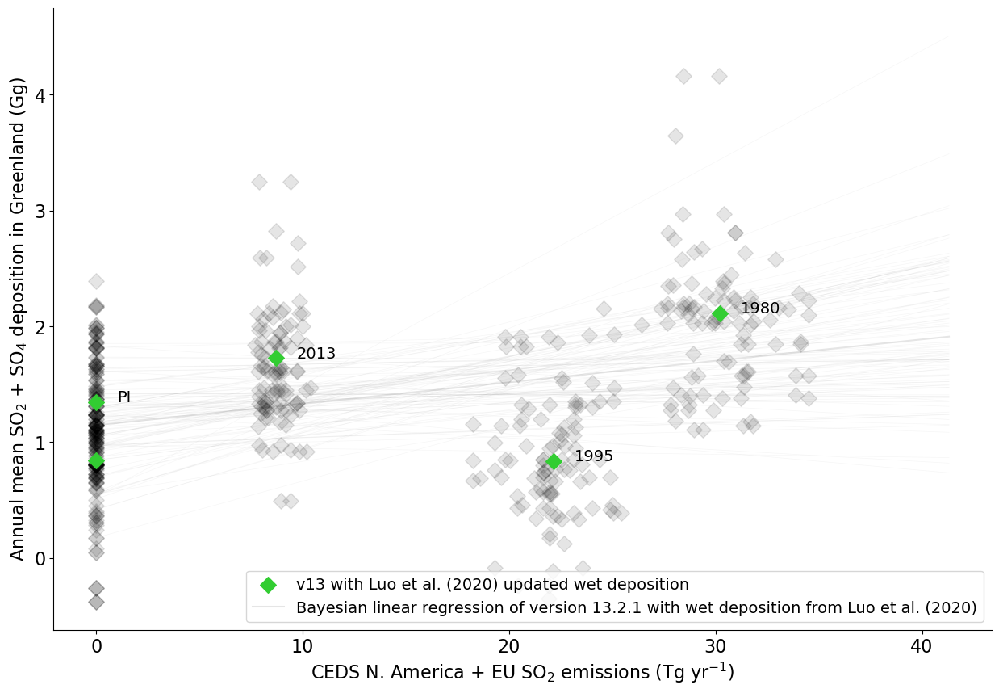

In [197]:
pltfactor=1
fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[15,10])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)
xconc = np.array([anthro_emiss_pi,anthro_emiss_pi,anthro_emiss_1980,anthro_emiss_1995,anthro_emiss_2013])
yconc = np.array([conc_ug_kg_pi,conc_ug_kg_pi_07,conc_ug_kg_1980,conc_ug_kg_1995,conc_ug_kg_2013])
# ys = np.array([wetlossls_pi,wetlossls_pi_met07,wetlossls_1980,wetlossls_1995,wetlossls_2013])

slope_conc, intercept_conc, rvalue_conc, pvalue_conc, stderr_conc = stats.linregress(xconc,yconc)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=100
m1 = '>'
m2 = 'D'
pltxs = np.linspace(0,anthro_emiss_1973+anthro_emiss_1973/10,10)
pltys = pltxs*slope_conc+intercept_conc
pltxs = pltxs*1e-9
pltys = pltys*pltfactor

for i in range(0,100,1):
    l = int(np.random.rand()*100)
    k = int(np.random.rand()*100)
    plt.scatter(Xconc[:,l]*1e-9,Yconc[:,k],marker=m2,color='k',s=size,alpha=0.1)
    plt.plot(xpnts*1e-9,(xpnts*slopes_conc[i]+intercepts_conc[i]),
             color='gray',linewidth=0.5,alpha=0.07)

ax.scatter(anthro_emiss_pi*1e-9, conc_ug_kg_pi*pltfactor, marker=m2,s=size, 
           label = 'v13 with Luo et al. (2020) updated wet deposition', #label='UJ no anthro met07', 
               color='limegreen',zorder=2)
ax.scatter(anthro_emiss_pi*1e-9, conc_ug_kg_pi_07*pltfactor, marker=m2,s=size, color='limegreen',zorder=2)

ax.scatter(anthro_emiss_1980*1e-9, conc_ug_kg_1980*pltfactor, marker=m2,s=size,color='limegreen',zorder=2)
ax.scatter(anthro_emiss_1995*1e-9, conc_ug_kg_1995*pltfactor, marker=m2,s=size,color='limegreen',zorder=2)
ax.scatter(anthro_emiss_2013*1e-9, conc_ug_kg_2013*pltfactor, marker=m2,s=size,color='limegreen',zorder=2)
# ax.scatter(xs*1e-9,ys*1e-6,color='limegreen',marker=m2,s=size)

plt.plot(xpnts*1e-9,(xpnts*slope_conc+intercept_conc),color='k',alpha=0.1,
         label='Bayesian linear regression of version 13.2.1 with wet deposition from Luo et al. (2020)')

ax.set_ylabel('Annual mean SO$_2$ + SO$_4$ deposition in Greenland (Gg)',fontsize=j)
ax.set_xlabel('CEDS N. America + EU SO$_2$ emissions (Tg yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
j=14
ax.legend(loc='lower right', fontsize= j)
factor=1.005
factor2=0
factor3 = 1.005
ax.text(anthro_emiss_pi*1e-9+factor,conc_ug_kg_pi*pltfactor+factor2,"PI",fontsize=j)
# ax.text(anthro_emiss_pi*1e-9+factor,dep_pi_met07*1e-6+3e16,"PI Met 07",fontsize=j)
ax.text(anthro_emiss_1995*1e-9+factor,conc_ug_kg_1995*pltfactor+factor2,"1995",fontsize=j)
ax.text(anthro_emiss_1980*1e-9+factor,conc_ug_kg_1980*pltfactor+factor2,"1980",fontsize=j)
ax.text(anthro_emiss_2013*1e-9+factor,conc_ug_kg_2013*pltfactor+factor2,"2013",fontsize=j)


In [273]:
bayes_burden = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope[0,:])])
fanth_bayes = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope[0,:])])
bayes_pi = np.random.normal(loc = (ys2[0]+ys2[1])/2,scale = np.abs(ys2[0] - ys2[1]),size=len(bayes_slope[0,:]))

bayes_burdenv12 = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slopev12[0,:])])
fanth_bayesv12 = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slopev12[0,:])])
bayes_piv12 = np.random.normal(loc = (ys6[0]+ys6[1])/2,scale = np.abs(ys6[0] - ys6[1]),size=len(bayes_slopev12[0,:]))

bayes_dep = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope_dep[0,:])])
fanth_bayes_dep = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope_dep[0,:])])
anth_bayes_dep = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope_dep[0,:])])
bayes_pi_dep = np.random.normal(loc = (ys[0]+ys[1])/2,scale = np.abs(ys[0] - ys[1]),size=len(bayes_slope_dep[0,:]))

bayes_conc = np.zeros([len(na_eu_su_emiss_ceds),len(slopes_conc)])
fanth_bayes_conc = np.zeros([len(na_eu_su_emiss_ceds),len(slopes_conc)])
bayes_pi_conc = np.random.normal(loc = (ys[0]+ys[1])/2,scale = np.abs(ys[0] - ys[1]),size=len(slopes_conc))


for i in range(0,len(na_eu_su_emiss_ceds)):
    bayes_burden[i,:] = na_eu_su_emiss_ceds[i] * bayes_slope[0,:] + bayes_intercept[0,:]
    fanth_bayes[i,:] = (bayes_burden[i,:]-bayes_pi) / (bayes_burden[i,:])
    bayes_dep[i,:] = na_eu_su_emiss_ceds[i]*1e-9 * bayes_slope_dep[0,:] + bayes_intercept_dep[0,:]
    fanth_bayes_dep[i,:] = (bayes_dep[i,:]-bayes_pi_dep) / (bayes_dep[i,:])
    anth_bayes_dep[i,:] = (bayes_dep[i,:]-bayes_dep[0,:])
    bayes_burdenv12[i,:] = na_eu_su_emiss_ceds[i] * bayes_slopev12[0,:] + bayes_interceptv12[0,:]
    fanth_bayesv12[i,:] = (bayes_burdenv12[i,:]-bayes_piv12) / (bayes_burdenv12[i,:])
    bayes_conc[i,:] = na_eu_su_emiss_ceds[i] * slopes_conc + intercepts_conc
    fanth_bayes_conc[i,:] = (bayes_conc[i,:]-bayes_pi_conc) / (bayes_conc[i,:])


In [274]:
# Now reconstruct burden over time period from Smith et al. 2011 using the x values from the spreadsheet and the 
# slope from Bayesian regression above
recon_y_uj = np.mean(bayes_burden,axis=1)
recon_y_uj_5 = np.zeros(len(ceds_yrs))
recon_y_uj_95 = np.zeros(len(ceds_yrs))

recon_y_dep = np.mean(bayes_dep,axis=1)
recon_y_dep_5 = np.zeros(len(ceds_yrs))
recon_y_dep_95 = np.zeros(len(ceds_yrs))

recon_anth_dep = np.mean(anth_bayes_dep,axis=1)
recon_anth_dep_5 = np.zeros(len(ceds_yrs))
recon_anth_dep_95 = np.zeros(len(ceds_yrs))

recon_y_conc = np.mean(bayes_conc,axis=1)
recon_y_conc_5 = np.zeros(len(ceds_yrs))
recon_y_conc_95 = np.zeros(len(ceds_yrs))

for i in range(0,len(ceds_yrs)):
    recon_y_uj_5[i] = np.percentile(bayes_burden[i,:],5)
    recon_y_uj_95[i] = np.percentile(bayes_burden[i,:],95)
    recon_y_v12 = np.mean(bayes_burdenv12,axis=1)
    recon_y_dep_5[i] = np.percentile(bayes_dep[i,:],5)
    recon_y_dep_95[i] = np.percentile(bayes_dep[i,:],95)
    recon_anth_dep_5[i] = np.percentile(anth_bayes_dep[i,:],5)
    recon_anth_dep_95[i] = np.percentile(anth_bayes_dep[i,:],95)
    recon_y_conc_5[i] = np.percentile(bayes_conc[i,:],5)
    recon_y_conc_95[i] = np.percentile(bayes_conc[i,:],95)



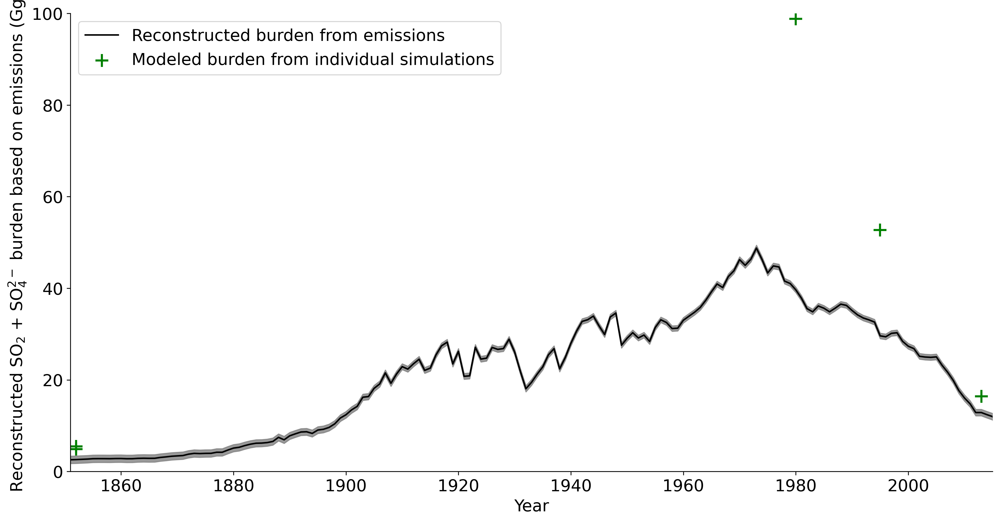

In [275]:
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=[16,8],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)

j=16
ax.set_xlim([1851,2015])
ax.set_ylim([0,1e2])
ax.set_ylabel('Reconstructed SO$_2$ + SO$_4^{2-}$ burden based on emissions (Gg)',fontsize=j)
ax.set_xlabel('Year',fontsize=j)

ax.tick_params(labelsize=j)
m2 = '+'
size=150
ax.plot(ceds_yrs,recon_y_uj*1e-6,color='k',label = 'Reconstructed burden from emissions')
# ax.plot(ceds_yrs,recon_y_v12,color='k',linestyle = '--',label = 'v12 without updated wet deposition')
ax.scatter(1852, burden_pi_met07*1e-6, marker=m2,s=size, linewidth = 2,
           label = 'Modeled burden from individual simulations', #label='UJ no anthro met07', 
               color='green')
ax.scatter(1852, burden_pi*1e-6, marker=m2,s=size, linewidth = 2,
           #label='UJ no anthro met07', 
               color='green')
ax.scatter(1980, burden_1980*1e-6, marker=m2,s=size,linewidth = 2, #label='UJ 1980', 
               color='green')
ax.scatter(1995, burden_1995*1e-6, marker=m2,s=size,linewidth = 2, #label='UJ 1995', 
               color='green')
ax.scatter(2013, burden_2013*1e-6, marker=m2,s=size,linewidth = 2, #label='UJ 2013', 
               color='green')
ax.fill_between(ceds_yrs,recon_y_uj_5*1e-6,recon_y_uj_95*1e-6,
              color='gray',alpha=0.8) #,label='model $f_{anth}$ uncertainty')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(loc='upper left',fontsize=j)

In [276]:
dep_mask_pi_07

<xarray.DataArray ()>
array(9.40935115)

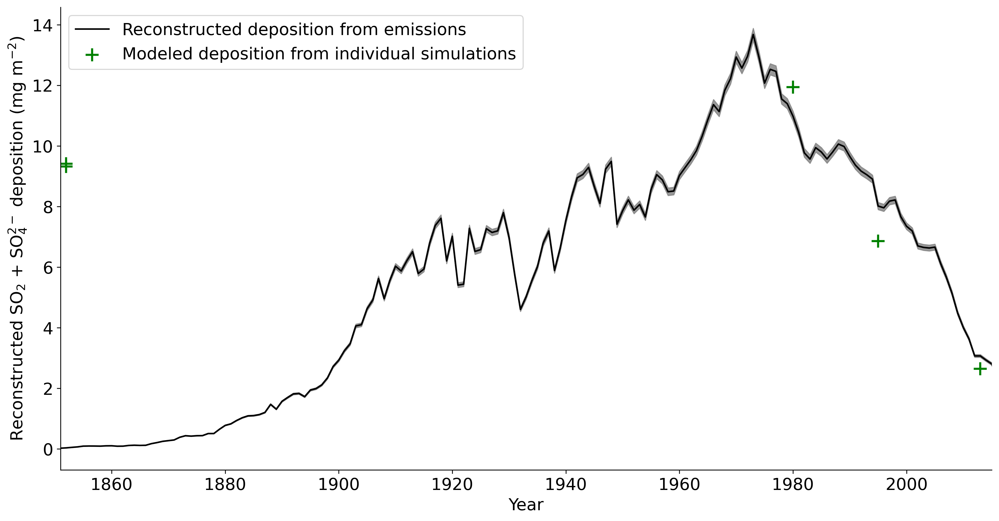

In [277]:
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=[16,8],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)

j=16
ax.set_xlim([1851,2015])
# ax.set_ylim([0,1e2])
ax.set_ylabel('Reconstructed SO$_2$ + SO$_4^{2-}$ deposition (mg m$^{-2}$)',fontsize=j)
ax.set_xlabel('Year',fontsize=j)

ax.tick_params(labelsize=j)
m2 = '+'
size=150
ax.plot(ceds_yrs,recon_anth_dep,color='k',label = 'Reconstructed deposition from emissions')
# ax.plot(ceds_yrs,recon_y_v12,color='k',linestyle = '--',label = 'v12 without updated wet deposition')
ax.scatter(1852, dep_mask_pi_07, marker=m2,s=size, linewidth = 2,
           label = 'Modeled deposition from individual simulations', #label='UJ no anthro met07', 
               color='green')
ax.scatter(1852, dep_mask_pi, marker=m2,s=size, linewidth = 2,
           #label='UJ no anthro met07', 
               color='green')
ax.scatter(1980, dep_mask_1980-dep_mask_pi, marker=m2,s=size,linewidth = 2, #label='UJ 1980', 
               color='green')
ax.scatter(1995, dep_mask_1995-dep_mask_pi, marker=m2,s=size,linewidth = 2, #label='UJ 1995', 
               color='green')
ax.scatter(2013, dep_mask_2013-dep_mask_pi, marker=m2,s=size,linewidth = 2, #label='UJ 2013', 
               color='green')
ax.fill_between(ceds_yrs,recon_anth_dep_5,recon_anth_dep_95,
              color='gray',alpha=0.8) #,label='model $f_{anth}$ uncertainty')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(loc='upper left',fontsize=j)

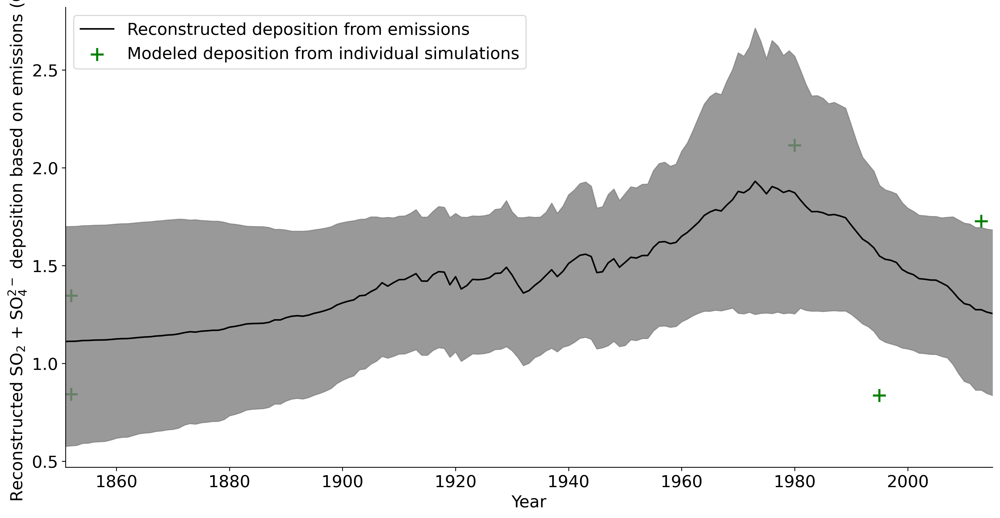

In [66]:
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=[16,8],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)

j=16
ax.set_xlim([1851,2015])
# ax.set_ylim([0,1e2])
ax.set_ylabel('Reconstructed SO$_2$ + SO$_4^{2-}$ deposition based on emissions (Gg)',fontsize=j)
ax.set_xlabel('Year',fontsize=j)

ax.tick_params(labelsize=j)
m2 = '+'
size=150
pltfactor=1
ax.plot(ceds_yrs,recon_y_conc*pltfactor,color='k',label = 'Reconstructed deposition from emissions')
# ax.plot(ceds_yrs,recon_y_v12,color='k',linestyle = '--',label = 'v12 without updated wet deposition')
ax.scatter(1852, conc_ug_kg_pi_07*pltfactor, marker=m2,s=size, linewidth = 2,
           label = 'Modeled deposition from individual simulations', #label='UJ no anthro met07', 
               color='green')
ax.scatter(1852, conc_ug_kg_pi*pltfactor, marker=m2,s=size, linewidth = 2,
           #label='UJ no anthro met07', 
               color='green')
ax.scatter(1980, conc_ug_kg_1980*pltfactor, marker=m2,s=size,linewidth = 2, #label='UJ 1980', 
               color='green')
ax.scatter(1995, conc_ug_kg_1995*pltfactor, marker=m2,s=size,linewidth = 2, #label='UJ 1995', 
               color='green')
ax.scatter(2013, conc_ug_kg_2013*pltfactor, marker=m2,s=size,linewidth = 2, #label='UJ 2013', 
               color='green')
ax.fill_between(ceds_yrs,recon_y_conc_5*pltfactor,recon_y_conc_95*pltfactor,
              color='gray',alpha=0.8) #,label='model $f_{anth}$ uncertainty')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(loc='upper left',fontsize=j)

## d34Santh, fbio, and fvolc

In [130]:
novolc_RRTMG              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/novolc_pi_13.2.1/OutputDir/GEOSChem.RRTMG.2013.nc4")
novolc_SpeciesConc        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/novolc_pi_13.2.1/OutputDir/GEOSChem.SpeciesConc.2013.nc4")
novolc_StateMet           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/novolc_pi_13.2.1/OutputDir/GEOSChem.StateMet.2013.nc4")

novolc_RRTMG_met07              = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_novolc/OutputDir/GEOSChem.RRTMG.2007.nc4")
novolc_SpeciesConc_met07        = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_novolc/OutputDir/GEOSChem.SpeciesConc.2007.nc4")
novolc_StateMet_met07           = xr.open_dataset("/home/cindylou/ujongebl/0915_GCClassic.13.2.1/rundir/pi_met07_novolc/OutputDir/GEOSChem.StateMet.2007.nc4")

novolc_SO4 = novolc_SpeciesConc['SpeciesConc_SO4']
novolc_SO4['lev'] = np.arange(72)
novolc_SO4 = novolc_SO4*(novolc_SO4.lev<novolc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")
novolc_SO2 = novolc_SpeciesConc['SpeciesConc_SO2']
novolc_SO2['lev'] = np.arange(72)
novolc_SO2 = novolc_SO2*(novolc_SO2.lev<novolc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

novolc_AD = novolc_StateMet.Met_AD
novolc_AD['lev'] = np.arange(72)
novolc_AD = novolc_AD*(novolc_AD.lev<novolc_StateMet.Met_TropLev).transpose("time","lev","lat","lon")

novolc_SO4_burden_S = novolc_SO4 * novolc_AD * 32/28.97
novolc_SO2_burden_S = novolc_SO2 * novolc_AD * 32/28.97

novolc_SO4_burden_nolev_S = np.sum(novolc_SO4_burden_S,axis=1)
novolc_SO2_burden_nolev_S = np.sum(novolc_SO2_burden_S,axis=1)    

novolc_SO4_met07 = novolc_SpeciesConc_met07['SpeciesConc_SO4']
novolc_SO4_met07['lev'] = np.arange(72)
novolc_SO4_met07 = novolc_SO4_met07*(novolc_SO4_met07.lev<novolc_StateMet_met07.Met_TropLev).transpose("time","lev","lat","lon")
novolc_SO2_met07 = novolc_SpeciesConc_met07['SpeciesConc_SO2']
novolc_SO2_met07['lev'] = np.arange(72)
novolc_SO2_met07 = novolc_SO2_met07*(novolc_SO2_met07.lev<novolc_StateMet_met07.Met_TropLev).transpose("time","lev","lat","lon")

novolc_AD_met07 = novolc_StateMet_met07.Met_AD
novolc_AD_met07['lev'] = np.arange(72)
novolc_AD_met07 = novolc_AD_met07*(novolc_AD_met07.lev<novolc_StateMet_met07.Met_TropLev).transpose("time","lev","lat","lon")

novolc_SO4_burden_S_met07 = novolc_SO4_met07 * volc_AD_met07 * 32/28.97
novolc_SO2_burden_S_met07 = novolc_SO2_met07 * volc_AD_met07 * 32/28.97

novolc_SO2_burden_nolev_S_met07 = np.sum(novolc_SO2_burden_S_met07,axis=1)
novolc_SO4_burden_nolev_S_met07 = np.sum(novolc_SO4_burden_S_met07,axis=1)

novolc_burden_pi = (novolc_SO4_burden_nolev_S[:,33:46,12:42] + novolc_SO2_burden_nolev_S[:,33:46,12:42]).mean(dim='time').sum(dim=('lat','lon'))
novolc_burden_pi_met07 = (novolc_SO4_burden_nolev_S_met07[:,33:46,12:42] + novolc_SO2_burden_nolev_S_met07[:,33:46,12:42]).mean(dim='time').sum(dim=('lat','lon'))


In [131]:
fbio_uj = ((np.sum(novolc_burden_pi).values+np.sum(novolc_burden_pi_met07).values)/2)/ (recon_y_uj)
fbio_uj = (np.sum(novolc_burden_pi).values)/ (recon_y_uj)
fvolc_uj = (np.sum(burden_pi).values - np.sum(novolc_burden_pi).values)/ (recon_y_uj)
fbio_dep = (dep_mask_novolc.values)/recon_y_dep
fvolc_dep = (dep_mask_pi_mean.values - dep_mask_novolc.values)/recon_y_dep

In [132]:
all_data = pd.read_excel('../Bio_sulfur/all_data.xlsx').drop(8711).drop(8710)
year1 = all_data.year1
SO4_raw = all_data.SO4
nssSO4_raw = all_data.nssSO4
year = year1.values[::-1]
tstep=1
yr=np.linspace(int(year[1]),1202,int((2007-1202)/tstep+1))
nssSO4_df = pd.DataFrame(data=nssSO4_raw.values,index=year1.values,columns=['nssSO4'])
# nssSO4_1yr = nssSO4_df.groupby('year').mean()
nssSO4_1yr = nssSO4_df.groupby(by=None, axis=0, level=0, as_index=True).mean()

In [133]:
patris02 = pd.read_csv('../VolcanicS_GC_results/PatrisDatasimple.csv')
patris02_pi = patris02.loc[patris02.MeanDate<1850]
patris02_pi_nssSO4 = patris02_pi.PatrisnssSO4
patris02_pi_d34S = patris02_pi.d34SnssSO4
patris02_pd = patris02.loc[patris02.MeanDate>1850]
patris02_pd_nssSO4 = patris02_pd.PatrisnssSO4
patris02_pd_d34S = patris02_pd.d34SnssSO4
patris_yr = patris02.MeanDate
patris_d34S_tot = patris02.d34S_tot
patris_d34S_nssSO4_orig = patris02.d34SnssSO4
iaeas1_d34Sacc = -0.3
iaeas2_d34Sacc = 22.62
iaeas3_d34Sacc = -32.49
iaeas4_d34Sacc = 16.90
iaeas5_d34Sacc = 0.49
iaeas6_d34Sacc = -34.05
nbs127_d34Sacc = 21.12
# correct Patris data because IAEA-S-2 used to be 21.8 but was corrected to 22.62 after Patris paper was published
patris_VCDT_corr_func = np.polyfit([iaeas1_d34Sacc,21.8,nbs127_d34Sacc],
                                   [iaeas1_d34Sacc,iaeas2_d34Sacc,nbs127_d34Sacc],1)
patris_wSSA_d34S_CORR = patris_VCDT_corr_func[0]*patris_d34S_tot+patris_VCDT_corr_func[1]

d34Sss = 21 # d34S of sea salt
patris_fss = 0.25*(patris02.Na)/(patris02.SO4) # calculate the fraction of sea salt in each ice core sample
patris_d34S_CORR = (patris_wSSA_d34S_CORR-d34Sss*patris_fss)/(1-patris_fss)

patris02_pi_d34S_CORR = patris_d34S_CORR[patris02.MeanDate<1850]
patris02_pd_d34S_CORR = patris_d34S_CORR[patris02.MeanDate>1850]

patris02_pi_nssSO4 = patris02.loc[patris02.MeanDate<1850].PatrisnssSO4
patris02_pd_nssSO4 = patris02.loc[patris02.MeanDate>1850].PatrisnssSO4


In [134]:
ice_core_pi = pd.read_excel('./Supplementary_data_1_ice_core_measurements_pi.xlsx')
ice_core_pd = pd.read_excel('./Supplementary_data_1_ice_core_measurements_pd.xlsx')

year_pre        = ice_core_pi['Year']
Na_pre          = ice_core_pi['sodium concentration (µg kg-1)']
SO4_pre         = ice_core_pi['sulfate concentration (µg kg-1)']
bioSO4_pre      = ice_core_pi['biogenic sulfate concentration (µg kg-1)']
volcSO4_pre     = ice_core_pi['volcanic sulfate concentration (µg kg-1)']
sigma_bio_pre   = ice_core_pi['biogenic sulfate error bar']
sigma_volc_pre  = ice_core_pi['volcanic sulfate error bar']
nssSO4_pre      = ice_core_pi['nssSO4 concentration (µg kg-1)']
d34S_pre        = ice_core_pi['d34S(nssSO4) (permille)']
sample_lenth    = ice_core_pi['# years combined into sample']

year_ind        = ice_core_pd['Year']
Na_ind          = ice_core_pd['sodium concentration (µg kg-1)']
SO4_ind         = ice_core_pd['sulfate concentration (µg kg-1)']
bioSO4_ind      = ice_core_pd['biogenic sulfate concentration (µg kg-1)']
volcSO4_ind     = ice_core_pd['Assumed volcanic sulfate concentration (µg kg-1)']
anthSO4         = ice_core_pd['Anthropogenic sulfate concentration (µg kg-1)']
sigma_bio_ind   = ice_core_pd['biogenic sulfate error bar']
sigma_volc_ind  = ice_core_pd['volcanic sulfate error bar']
sigma_anth      = ice_core_pd['anthropogenic sulfate error bar']
nssSO4_ind      = ice_core_pd['nssSO4 concentration (µg kg-1)']
d34S_ind        = ice_core_pd['d34S(nssSO4) (permille)']
bioSO4_ind5     = ice_core_pd['biogenic sulfate assuming 5th percentile volcano']
bioSO4_ind95    = ice_core_pd['biogenic sulfate assuming 95th percentile volcano']
volcSO4_ind5    = ice_core_pd['5th percentile volcano']
volcSO4_ind95    = ice_core_pd['95th percentile volcano']
anthSO4_ind5    = ice_core_pd['anthropogenic sulfate assuming 5th percentile volcano']
anthSO4_ind95   = ice_core_pd['anthropogenic sulfate assuming 95th percentile volcano']

sigma_Na = 0.0007 #*Na # 0.80 ppb for MSA, convert to µg
sigma_SO4 = 0.0003 #*sulfate_pre
sigma_nssSO4_pre = np.sqrt(0.25*(Na_pre**2*sigma_SO4**2 + SO4_pre**2*sigma_Na**2))
sigma_nssSO4_ind = np.sqrt(0.25*(Na_ind**2*sigma_SO4**2 + SO4_ind**2*sigma_Na**2))
process_std_std = 1.2

ice_core_fbio = bioSO4_ind/nssSO4_ind
sigma_fbio = np.sqrt((1/nssSO4_ind)**2 * sigma_bio_ind**2 + (
    -bioSO4_ind/nssSO4_ind**2)**2 * sigma_nssSO4_ind**2)
fbio_95 = bioSO4_ind95/nssSO4_ind
fbio_5 = bioSO4_ind5/nssSO4_ind

ice_core_fanth = anthSO4/nssSO4_ind
sigma_fanth = np.sqrt((1/nssSO4_ind)**2 * sigma_anth**2 + (
    -anthSO4/nssSO4_ind**2)**2 * sigma_nssSO4_ind**2)
fanth_95 = anthSO4_ind95/nssSO4_ind
fanth_5 = anthSO4_ind5/nssSO4_ind

ice_core_fvolc = volcSO4_ind/nssSO4_ind
sigma_fvolc = np.sqrt((1/nssSO4_ind)**2 * sigma_volc_ind**2 + (
    -volcSO4_ind/nssSO4_ind**2)**2 * sigma_nssSO4_ind**2)
fvolc_95 = volcSO4_ind95/nssSO4_ind
fvolc_5 = volcSO4_ind5/nssSO4_ind

The geometric mean intercept with patris samples is  2.94
The standard error associated with the industrial era linear regression  0.35


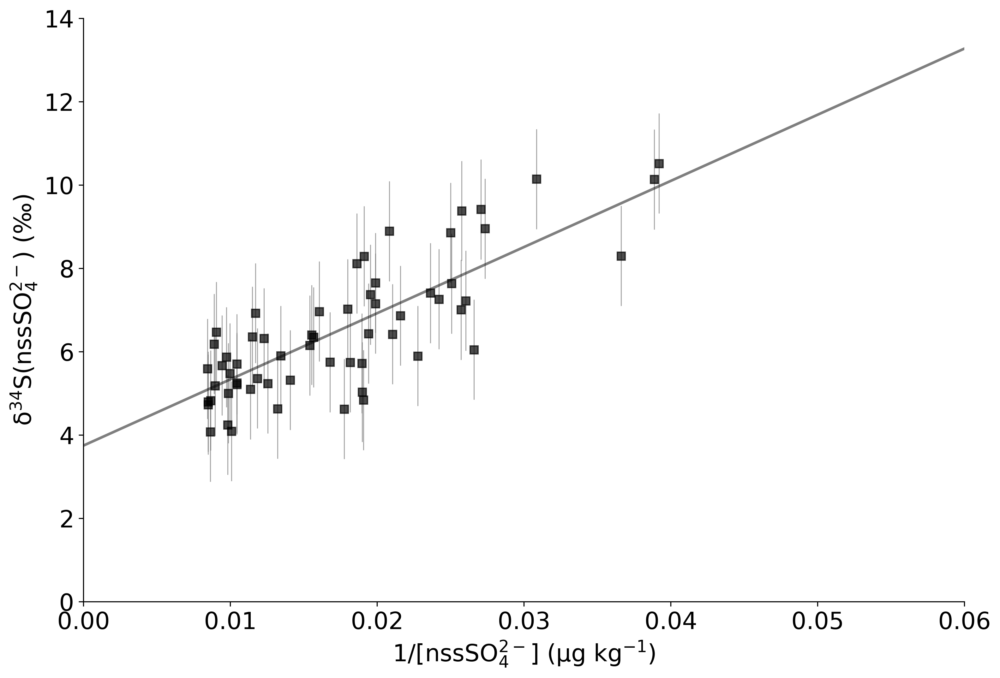

In [135]:
x = 1/np.hstack([nssSO4_ind[0:33],nssSO4_ind[36:40],nssSO4_ind[41:45],nssSO4_ind[48:]])
y = np.hstack([d34S_ind[0:33],d34S_ind[36:40],d34S_ind[41:45],d34S_ind[48:]])

# x = 1/nssSO4_ind
# y = d34S_ind
slope, intercept, r, p, stderr_slope = stats.linregress(x,y)
GM_slope = slope/r
gm_int = np.mean(y - GM_slope*x)
yhat = slope*x+intercept
Syx = np.sqrt(np.sum((y-yhat)**2)/(len(x)-2))
Sb_anth = Syx*np.sqrt(np.sum(x**2)/(len(x)*np.sum((x-np.mean(x))**2)))
print('The geometric mean intercept with patris samples is ',np.round(gm_int,2))
print('The standard error associated with the industrial era linear regression ',np.round(Sb_anth,2))
k = 18
i = np.linspace(0,0.08,50)
j = slope*i+intercept
fig,ax = plt.subplots(figsize = [12,8],dpi=300)
ax.set_ylabel('δ$^{34}$S(nssSO$_4^{2-}$) (‰)',fontsize=k)
ax.set_xlabel('1/[nssSO$_4^{2-}$] (µg kg$^{-1}$)',fontsize=k)
ax.tick_params(labelsize=k)
ax.tick_params(labelsize=k)

s=6
# plt.ylabel('δ$^{34}$S(nssSO$_4$$^{2-}$) (‰)',fontsize=k)
ax.set_xlabel('1/[nssSO$_4^{2-}$] (µg kg$^{-1}$)',fontsize=k)
ax.errorbar(1/nssSO4_ind,d34S_ind,process_std_std,label='Ice core samples from 1850-2007',fmt='s',markersize=s,color='k',
             ecolor='gray',linewidth=0.75,alpha=0.7)
# ax.scatter(1/patris02_pd_nssSO4,patris02_pd_d34S,label='Patris et al. (2002)',s = s*2,marker='o',color='white',
#            edgecolor='darkgreen',alpha=1)
# ax.scatter(1/patris02_pd_nssSO4,patris02_pd_d34S,s = s,marker='x',color='k',edgecolor='k',alpha=0.8)
ax.plot(i,j,color = 'black',linewidth = 2,alpha=0.5,label='Linear regression of industrial-era samples')
ax.set_ylim([0,14])
ax.set_xlim([0.0,0.06])

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

The ordinary intercept of uncorr patris samples is        1.98
The geometric mean intercept of uncorr patris samples is  1.92
The standard error associated with uncorr samples is      0.39
The ordinary intercept of CORR patris samples is        2.16
The geometric mean intercept of CORR patris samples is  2.08
The standard error associated with CORR samples is      0.45


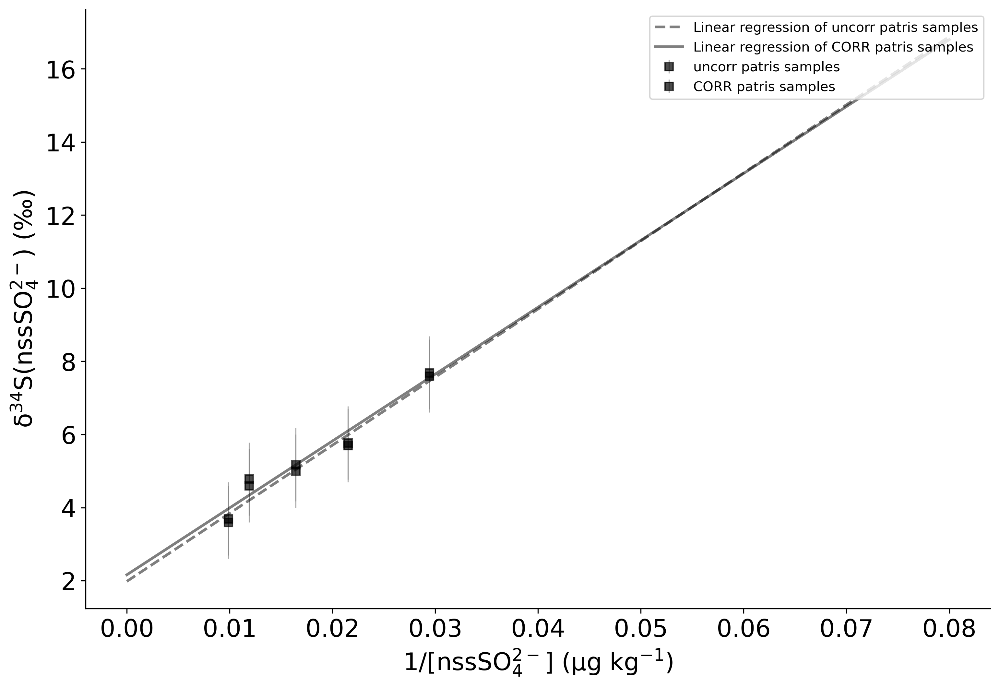

In [136]:
x1 = 1/patris02_pd_nssSO4
y1 = patris02_pd_d34S
x2 = 1/patris02_pd_nssSO4
y2 = patris02_pd_d34S_CORR

slope1, intercept1, r1, p1, stderr_slope1 = stats.linregress(x1,y1)
slope2, intercept2, r2, p2, stderr_slope2 = stats.linregress(x2,y2)
GM_slope1 = slope1/r1
gm_int1 = np.mean(y1 - GM_slope1*x1)
yhat1 = slope1*x1+intercept1
Syx1 = np.sqrt(np.sum((y1-yhat1)**2)/(len(x1)-2))
Sb_anth1 = Syx1*np.sqrt(np.sum(x1**2)/(len(x1)*np.sum((x1-np.mean(x1))**2)))

GM_slope2 = slope2/r2
gm_int2 = np.mean(y2 - GM_slope2*x2)
yhat2 = slope2*x2+intercept2
Syx2 = np.sqrt(np.sum((y2-yhat2)**2)/(len(x2)-2))
Sb_anth2 = Syx2*np.sqrt(np.sum(x2**2)/(len(x2)*np.sum((x2-np.mean(x2))**2)))
print('The ordinary intercept of uncorr patris samples is       ',np.round(intercept1,2))
print('The geometric mean intercept of uncorr patris samples is ',np.round(gm_int1,2))
print('The standard error associated with uncorr samples is     ',np.round(Sb_anth1,2))

print('The ordinary intercept of CORR patris samples is       ',np.round(intercept2,2))
print('The geometric mean intercept of CORR patris samples is ',np.round(gm_int2,2))
print('The standard error associated with CORR samples is     ',np.round(Sb_anth2,2))

k = 18
i = np.linspace(0,0.08,50)
j1 = slope1*i+intercept1
j2 = slope2*i+intercept2
fig,ax = plt.subplots(figsize = [12,8],dpi=300)
ax.set_ylabel('δ$^{34}$S(nssSO$_4^{2-}$) (‰)',fontsize=k)
ax.set_xlabel('1/[nssSO$_4^{2-}$] (µg kg$^{-1}$)',fontsize=k)
ax.tick_params(labelsize=k)
ax.tick_params(labelsize=k)

s=6
# plt.ylabel('δ$^{34}$S(nssSO$_4$$^{2-}$) (‰)',fontsize=k)
ax.set_xlabel('1/[nssSO$_4^{2-}$] (µg kg$^{-1}$)',fontsize=k)
ax.errorbar(x1,y1,1,label='uncorr patris samples',fmt='s',markersize=s,color='k',
             ecolor='gray',linewidth=0.75,alpha=0.7)
ax.errorbar(x2,y2,1,label='CORR patris samples',fmt='s',markersize=s,color='k',
             ecolor='gray',linewidth=0.75,alpha=0.7)

ax.plot(i,j1,color = 'black',linestyle = '--',linewidth = 2,alpha=0.5,label='Linear regression of uncorr patris samples')
ax.plot(i,j2,color = 'black',linewidth = 2,alpha=0.5,label='Linear regression of CORR patris samples')
# ax.set_ylim([0,14])
# ax.set_xlim([0.0,0.06])

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 'upper right')

In [346]:
len(x)

808

In [347]:
accum = shuting_summit_accum[1850.5:2007.5]
x = nssSO4_1yr.values[nssSO4_1yr.index>1849]
nssSO4_1yr_flux = np.array([])
for i in range(0,len(x)):
    nssSO4_1yr_flux = np.hstack([nssSO4_1yr_flux,nssSO4_1yr.values[i]*accum.values[i]])

Text(-0.06, 0.95, 'b')

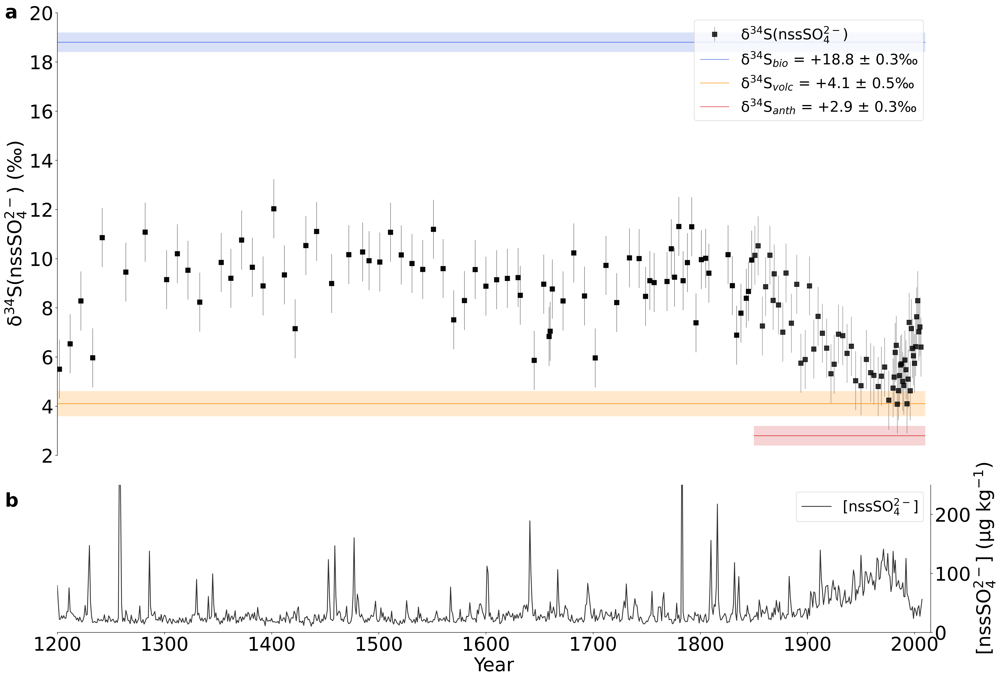

In [348]:
fig, ax = plt.subplots(ncols=1,nrows=2,figsize=[28,20],gridspec_kw={'height_ratios': [3, 1]},dpi=300)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.1)
j=34

for i in range(0,2,1):
    ax[i].patch.set_facecolor('white')
    ax[i].patch.set_alpha(0)

size = 12
s = 200
line=2
meanline=3
m=8
ax[0].errorbar(year_pre,d34S_pre.values,process_std_std,fmt='s',color='k',ecolor='gray',markersize=m,linewidth=1,alpha=0.8)
ax[0].errorbar(year_ind,d34S_ind.values,process_std_std,fmt='s',color='k',ecolor='gray',markersize=m,linewidth=1,alpha=0.8)
# ax[0].scatter(patris_yr[5:],patris02_pi_d34S,marker='o',color='white',edgecolor='k',s=m**2*2,alpha=1,label ='δ$^{34}$S(nssSO$_4^{2-}$) (Patris et al., 2002)')
# ax[0].errorbar(patris_yr[5:],patris02_pi_d34S,1,fmt='o',color='white',ecolor='gray',markersize=m,linewidth=1,alpha=0.8)
# ax[0].scatter(patris_yr[:5],patris02_pd_d34S,marker='o',color='white',edgecolor='k',s=m**2*2,alpha=1)
# ax[0].errorbar(patris_yr[:5],patris02_pd_d34S,1,fmt='o',color='white',ecolor='gray',markersize=m,linewidth=1,alpha=0.8)
ax[0].hlines(2.8,1850,2010,linestyles = '-',color = 'tab:red',linewidth = 35,alpha=0.2)
ax[0].hlines(4.1,1200,2010,linestyles = '-',color = 'darkorange',linewidth = 45,alpha=0.2)
ax[0].hlines(18.8,1200,2010,linestyles = '-',color = 'royalblue',linewidth = 35,alpha=0.2)
ax[0].hlines(2.8,1850,2010,linestyles = '-',color = 'tab:red',linewidth = 1,alpha=0.9,label='δ$^{34}$S$_{anth}$ = +2.9 ± 0.3‰')
ax[0].hlines(4.1,1200,2010,linestyles = '-',color = 'darkorange',linewidth = 1,alpha=0.9,label='δ$^{34}$S$_{volc}$ = +4.1 ± 0.5‰')
ax[0].hlines(18.8,1200,2010,linestyles = '-',color = 'royalblue',linewidth = 1,alpha=0.9,label='δ$^{34}$S$_{bio}$ = +18.8 ± 0.3‰')

p1 = ax[0].errorbar(year_pre,d34S_pre.values,process_std_std,fmt='s',color='k',ecolor='gray',markersize=m,linewidth=1,alpha=0.8)
# p2 = ax[0].errorbar(patris_yr[5:],patris02_pi_d34S,1,fmt='o',color='k',ecolor='gray',markersize=m,linewidth=1,alpha=0.8,label ='δ$^{34}$S(nssSO$_4^{2-}$) (Patris et al., 2002)')
# p2 = ax[0].scatter(patris_yr[5:],patris02_pi_d34S,marker='o',color='white',edgecolor='k',s=m**2*2,alpha=1,label ='δ$^{34}$S(nssSO$_4^{2-}$) (Patris et al., 2002)')
p3 = ax[0].hlines(18.8,1200,2010,linestyles = '-',color = 'royalblue',linewidth = 1,alpha=0.9,label='δ$^{34}$S$_{bio}$ = +18.8 ± 0.3‰')
p4 = ax[0].hlines(4.1,1200,2010,linestyles = '-',color = 'darkorange',linewidth = 1,alpha=0.9,label='δ$^{34}$S$_{volc}$ = +4.1 ± 0.5‰')
p5 = ax[0].hlines(2.8,1850,2010,linestyles = '-',color = 'tab:red',linewidth = 1,alpha=0.9,label='δ$^{34}$S$_{anth}$ = +2.9 ± 0.3‰')
l0 = ax[0].legend([p1,p3,p4,p5], ['δ$^{34}$S(nssSO$_4^{2-}$)', #'δ$^{34}$S(nssSO$_4^{2-}$) (Patris et al., 2002)',
                           'δ$^{34}$S$_{bio}$ = +18.8 ± 0.3‰','δ$^{34}$S$_{volc}$ = +4.1 ± 0.5‰',
                                     'δ$^{34}$S$_{anth}$ = +2.9 ± 0.3‰'],loc='upper right',fontsize=j-8)
# l1 = ax[0].legend([p1,p2], ['δ$^{34}$S(nssSO$_4^{2-}$) (this study)','δ$^{34}$S(nssSO$_4^{2-}$) (Patris et al., 2002)',],loc='upper right',fontsize=j-8)

# ax[0].text(1200,4.5,"δ$^{34}$S$_{volc}$ = +4.3 ± 0.5‰", fontsize=j-6,alpha=1)
# ax[0].text(1200,18.9,"δ$^{34}$S$_{bio}$ = +18.8 ± 0.3‰", fontsize=j-6,alpha=1)

ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].spines['bottom'].set_visible(False)
ax[0].axes.get_xaxis().set_visible(False)
ax[1].spines['top'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[1].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")

ax[1].plot(nssSO4_1yr.index,nssSO4_1yr.values,color='k',linewidth=1.5,alpha=0.8,label='[nssSO$_4^{2-}$]')


ax[1].legend(loc='upper right',fontsize=j-8)

ax[0].tick_params(labelsize= j-2)
ax[1].tick_params(labelsize= j-2)

ax[0].set_ylabel('δ$^{34}$S(nssSO$_4^{2-}$) (‰)',fontsize=j)
ax[1].set_ylabel('[nssSO$_4^{2-}$] (µg kg$^{-1}$)',fontsize=j)
ax[1].set_xlabel('Year',fontsize=j)
ax[0].set_xlim([1200,2015])
ax[1].set_xlim([1200,2015])
ax[0].set_ylim([2,20])
ax[1].set_ylim([0,250])

for i, label in enumerate(('A', 'B')):
    ax[i].tick_params(labelsize=j)

ax[0].text(-0.06, 1.02, 'a', transform=ax[0].transAxes,fontsize=j, fontweight='bold', va='top')
ax[1].text(-0.06, 0.95, 'b', transform=ax[1].transAxes,fontsize=j, fontweight='bold', va='top')


(0.0, 1.0)

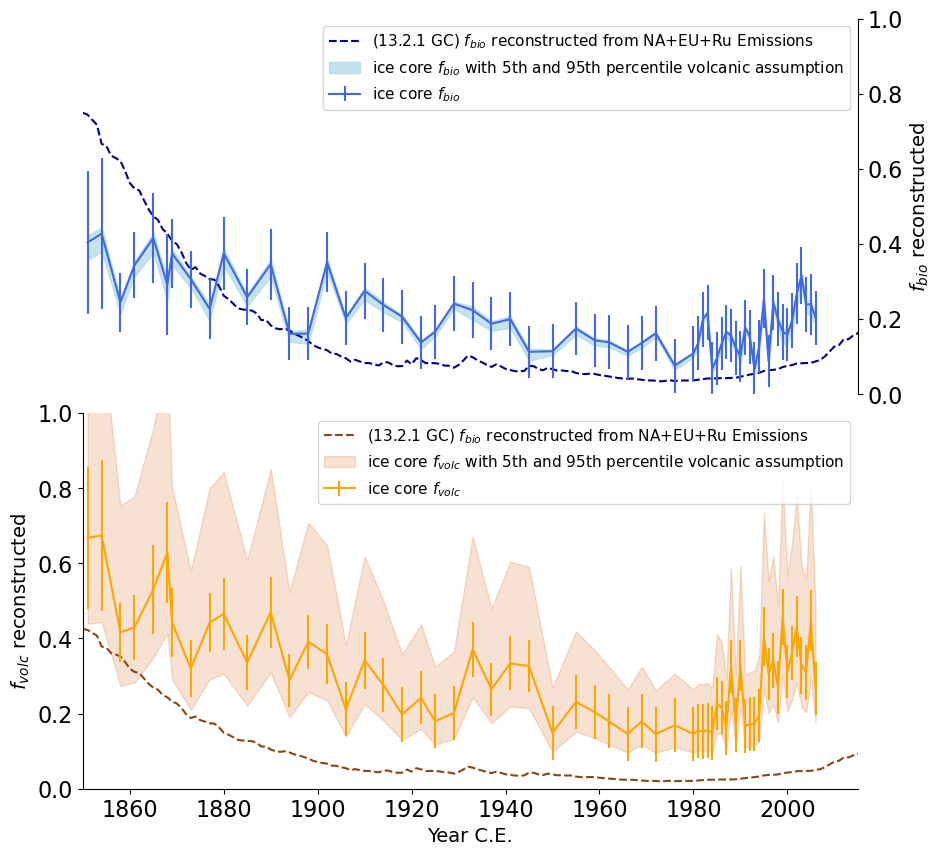

In [138]:
ice_core_fbio = bioSO4_ind/nssSO4_ind

fig,ax = plt.subplots(ncols=1,nrows=2,figsize=[10,10])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.05)
ax[0].patch.set_facecolor('white')
ax[0].patch.set_alpha(0)
ax[1].patch.set_facecolor('white')
ax[1].patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=75

ax[0].plot(ceds_yrs,fbio_uj,linestyle='--',color='darkblue',linewidth=l,
         label='(13.2.1 GC) $f_{bio}$ reconstructed from NA+EU+Ru Emissions')
ax[0].errorbar(year_ind,ice_core_fbio,sigma_fbio,
              color='royalblue',label='ice core $f_{bio}$')
ax[0].fill_between(year_ind,fbio_95,fbio_5,
              color='lightblue',alpha=0.7,
                   label='ice core $f_{bio}$ with 5th and 95th percentile volcanic assumption')
ax[0].set_xlim([1850,2015])

ax[0].set_ylabel('$f_{bio}$ reconstructed',fontsize=j-2)
ax[0].axes.get_xaxis().set_visible(False)
ax[0].tick_params(axis='y', labelsize= j)
ax[0].yaxis.tick_right()
ax[0].yaxis.set_label_position("right")
ax[0].spines['top'].set_visible(False)
ax[0].spines['bottom'].set_visible(False)
ax[0].spines['left'].set_visible(False)
ax[0].legend(loc='upper right', fontsize= j-5)
ax[0].set_ylim([0,1])

ax[1].plot(ceds_yrs,fvolc_uj,linestyle='--',color='saddlebrown',linewidth=l,
         label='(13.2.1 GC) $f_{bio}$ reconstructed from NA+EU+Ru Emissions')
ax[1].errorbar(year_ind,ice_core_fvolc,sigma_fbio,
              color='orange',label='ice core $f_{volc}$')
ax[1].fill_between(year_ind,fvolc_5,fvolc_95,
              color='chocolate',alpha=0.2,
                   label='ice core $f_{volc}$ with 5th and 95th percentile volcanic assumption')
ax[1].set_xlim([1850,2015])

ax[1].set_ylabel('$f_{volc}$ reconstructed',fontsize=j-2)
ax[1].set_xlabel('Year C.E.',fontsize=j-2)
ax[1].tick_params(axis='x', labelsize= j)
ax[1].tick_params(axis='y', labelsize= j)

ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].legend(loc='upper right', fontsize= j-5)
ax[1].set_ylim([0,1])

(0.0, 1.0)

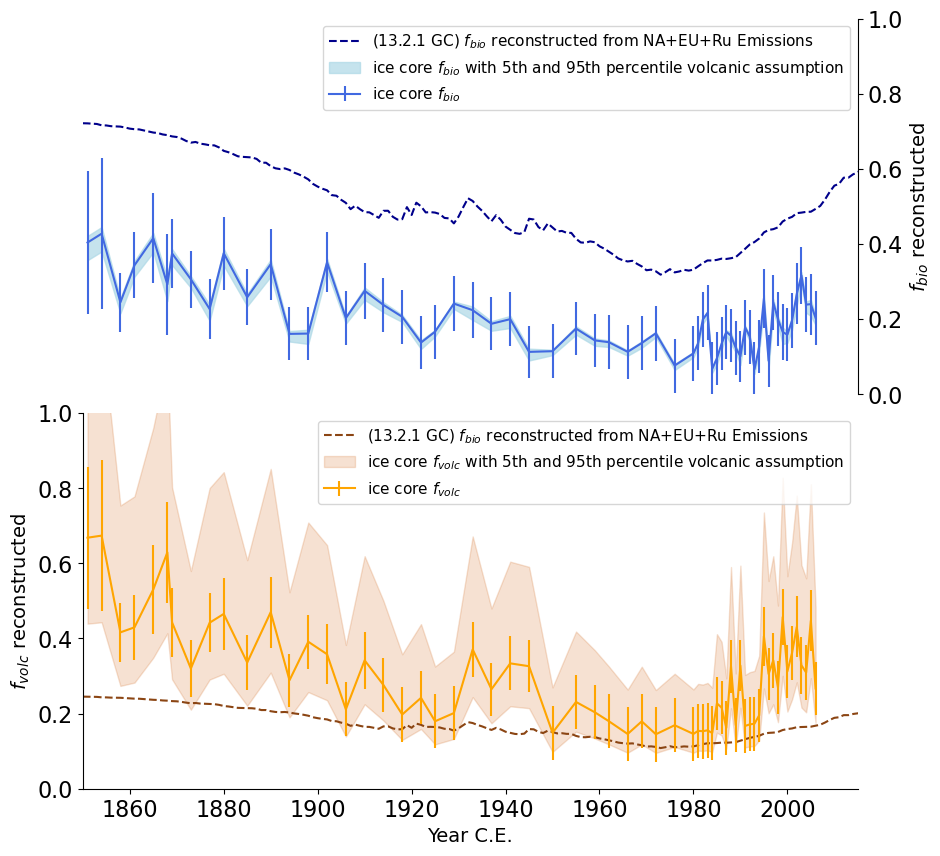

In [139]:
ice_core_fbio = bioSO4_ind/nssSO4_ind

fig,ax = plt.subplots(ncols=1,nrows=2,figsize=[10,10])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.05)
ax[0].patch.set_facecolor('white')
ax[0].patch.set_alpha(0)
ax[1].patch.set_facecolor('white')
ax[1].patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=75

ax[0].plot(ceds_yrs,fbio_dep,linestyle='--',color='darkblue',linewidth=l,
         label='(13.2.1 GC) $f_{bio}$ reconstructed from NA+EU+Ru Emissions')
ax[0].errorbar(year_ind,ice_core_fbio,sigma_fbio,
              color='royalblue',label='ice core $f_{bio}$')
ax[0].fill_between(year_ind,fbio_95,fbio_5,
              color='lightblue',alpha=0.7,
                   label='ice core $f_{bio}$ with 5th and 95th percentile volcanic assumption')
ax[0].set_xlim([1850,2015])

ax[0].set_ylabel('$f_{bio}$ reconstructed',fontsize=j-2)
ax[0].axes.get_xaxis().set_visible(False)
ax[0].tick_params(axis='y', labelsize= j)
ax[0].yaxis.tick_right()
ax[0].yaxis.set_label_position("right")
ax[0].spines['top'].set_visible(False)
ax[0].spines['bottom'].set_visible(False)
ax[0].spines['left'].set_visible(False)
ax[0].legend(loc='upper right', fontsize= j-5)
ax[0].set_ylim([0,1])

ax[1].plot(ceds_yrs,fvolc_dep,linestyle='--',color='saddlebrown',linewidth=l,
         label='(13.2.1 GC) $f_{bio}$ reconstructed from NA+EU+Ru Emissions')
ax[1].errorbar(year_ind,ice_core_fvolc,sigma_fbio,
              color='orange',label='ice core $f_{volc}$')
ax[1].fill_between(year_ind,fvolc_5,fvolc_95,
              color='chocolate',alpha=0.2,
                   label='ice core $f_{volc}$ with 5th and 95th percentile volcanic assumption')
ax[1].set_xlim([1850,2015])

ax[1].set_ylabel('$f_{volc}$ reconstructed',fontsize=j-2)
ax[1].set_xlabel('Year C.E.',fontsize=j-2)
ax[1].tick_params(axis='x', labelsize= j)
ax[1].tick_params(axis='y', labelsize= j)

ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].legend(loc='upper right', fontsize= j-5)
ax[1].set_ylim([0,1])

(0.0, 1.0)

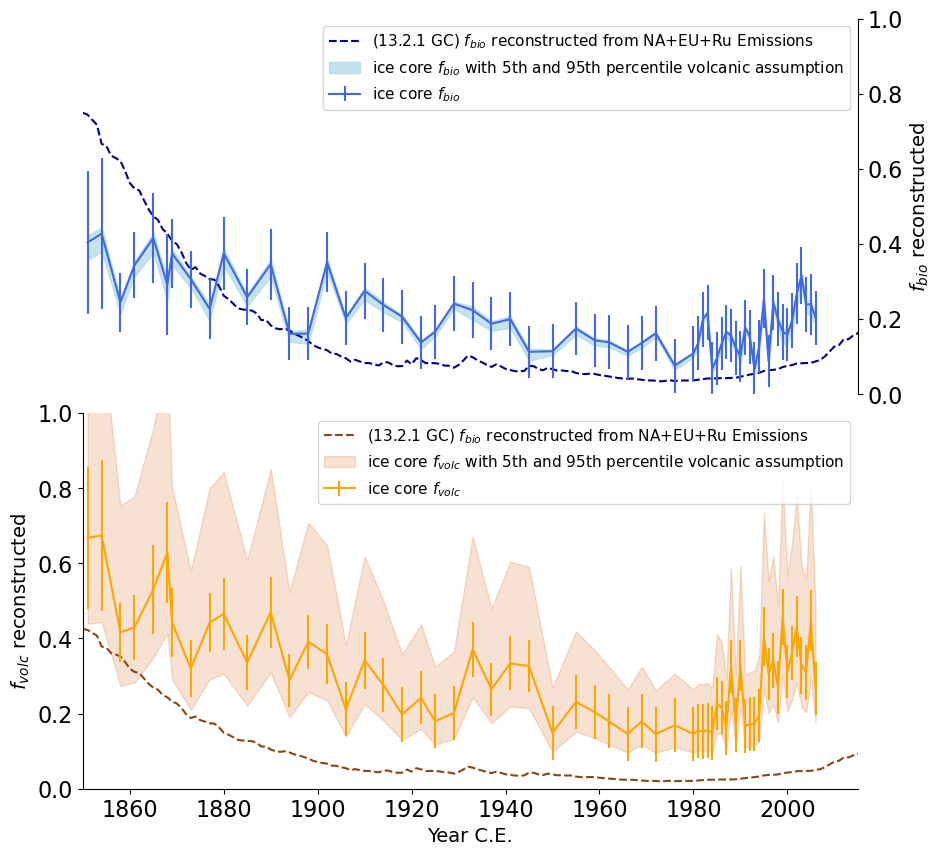

In [140]:
ice_core_fbio = bioSO4_ind/nssSO4_ind

fig,ax = plt.subplots(ncols=1,nrows=2,figsize=[10,10])
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.05)
ax[0].patch.set_facecolor('white')
ax[0].patch.set_alpha(0)
ax[1].patch.set_facecolor('white')
ax[1].patch.set_alpha(0)

l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=16
size=75

ax[0].plot(ceds_yrs,fbio_uj,linestyle='--',color='darkblue',linewidth=l,
         label='(13.2.1 GC) $f_{bio}$ reconstructed from NA+EU+Ru Emissions')
ax[0].errorbar(year_ind,ice_core_fbio,sigma_fbio,
              color='royalblue',label='ice core $f_{bio}$')
ax[0].fill_between(year_ind,fbio_95,fbio_5,
              color='lightblue',alpha=0.7,
                   label='ice core $f_{bio}$ with 5th and 95th percentile volcanic assumption')
ax[0].set_xlim([1850,2015])

ax[0].set_ylabel('$f_{bio}$ reconstructed',fontsize=j-2)
ax[0].axes.get_xaxis().set_visible(False)
ax[0].tick_params(axis='y', labelsize= j)
ax[0].yaxis.tick_right()
ax[0].yaxis.set_label_position("right")
ax[0].spines['top'].set_visible(False)
ax[0].spines['bottom'].set_visible(False)
ax[0].spines['left'].set_visible(False)
ax[0].legend(loc='upper right', fontsize= j-5)
ax[0].set_ylim([0,1])

ax[1].plot(ceds_yrs,fvolc_uj,linestyle='--',color='saddlebrown',linewidth=l,
         label='(13.2.1 GC) $f_{bio}$ reconstructed from NA+EU+Ru Emissions')
ax[1].errorbar(year_ind,ice_core_fvolc,sigma_fbio,
              color='orange',label='ice core $f_{volc}$')
ax[1].fill_between(year_ind,fvolc_5,fvolc_95,
              color='chocolate',alpha=0.2,
                   label='ice core $f_{volc}$ with 5th and 95th percentile volcanic assumption')
ax[1].set_xlim([1850,2015])

ax[1].set_ylabel('$f_{volc}$ reconstructed',fontsize=j-2)
ax[1].set_xlabel('Year C.E.',fontsize=j-2)
ax[1].tick_params(axis='x', labelsize= j)
ax[1].tick_params(axis='y', labelsize= j)

ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].legend(loc='upper right', fontsize= j-5)
ax[1].set_ylim([0,1])

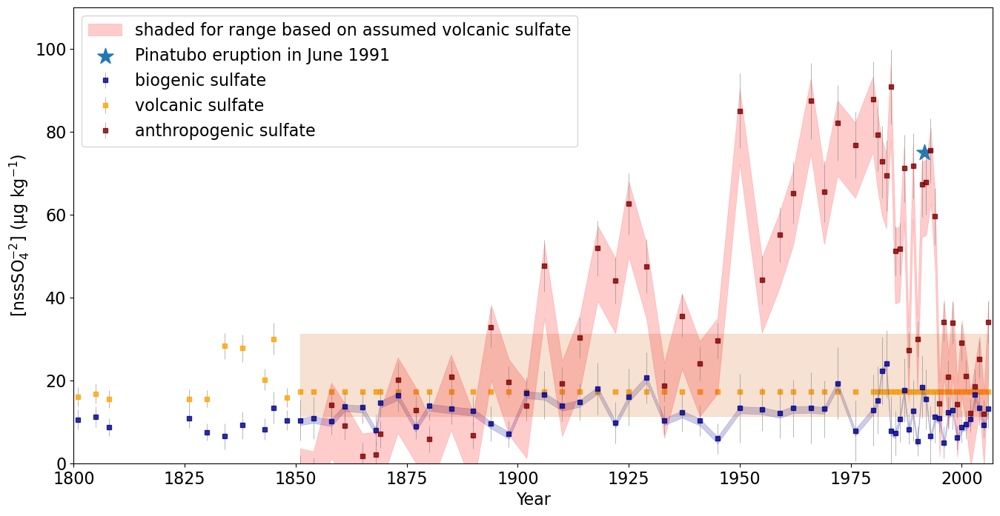

In [141]:
fig, ax = plt.subplots(figsize = [16,8])
ax.set_ylabel('[nssSO$_4^{-2}$] (µg kg$^{-1}$)',fontsize=j)
ax.set_xlabel('Year',fontsize=j)
# plt.title('Volcanic, biogenic, anthropogenic non-sea salt sulfate (big eruptions excluded)',fontsize = 18)
ax.set_xlim([1800,2007])
ax.set_ylim([0,110])

size = 4
ax.errorbar(year_pre,bioSO4_pre,sigma_bio_pre,fmt='s',markersize=size,color='darkblue',ecolor='gray',linewidth=0.5,label='biogenic sulfate',alpha=0.8)
ax.errorbar(year_ind,bioSO4_ind,sigma_bio_ind,fmt='s',markersize=size,color='darkblue',ecolor='gray',linewidth=0.5,alpha=0.8)

ax.errorbar(year_pre,volcSO4_pre,sigma_volc_pre,fmt='s',markersize=size,color='orange',ecolor='gray',linewidth=0.5,label='volcanic sulfate',alpha=0.8)
ax.scatter(year_ind,volcSO4_ind,marker='s',s=size**2,color='orange',alpha=0.8)

ax.errorbar(year_ind,anthSO4,sigma_anth,fmt='s',markersize=size,color='maroon',ecolor='gray',linewidth=0.5,label='anthropogenic sulfate',alpha=0.8)

ax.fill_between(year_ind,bioSO4_ind5,bioSO4_ind95,color='darkblue',linewidth=0.5,alpha=0.2)
ax.fill_between(year_ind,volcSO4_ind5,volcSO4_ind95,color='chocolate',linewidth=0.5,alpha=0.2)
ax.fill_between(year_ind,anthSO4_ind5,anthSO4_ind95,color='red',label='shaded for range based on assumed volcanic sulfate',linewidth=0.5,alpha=0.2)
ax.scatter(1991.5,75,marker='*',s=size**4,label='Pinatubo eruption in June 1991')

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)
ax.legend(loc='upper left',fontsize=j)

### Conclusions from volcanic eruption analysis
I should mark out St Helens (1980), El Chichon (1982), Pinatubo (1991), Augustine (1976 and 1986), and Spurr (1992)

## Computing deposition flux instead of concentration

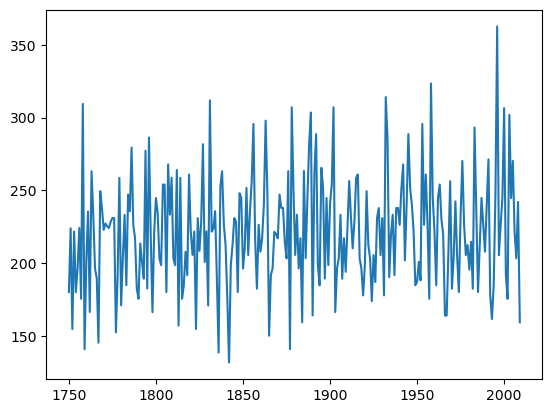

In [146]:
shuting_summit = pd.read_excel('../VolcanicS_GC_results/Accumulation_Data/Net_Accum_Shuting_042321.xlsx')
length_shuting = len(np.round(shuting_summit.Mid_Year).groupby(shuting_summit.Mid_Year).mean())-3
shuting_year = (shuting_summit.Mid_Year.groupby(shuting_summit.Mid_Year).mean().iloc[0:length_shuting]-0.5)
shuting_summit_accum = shuting_summit.Summit2010.groupby(shuting_summit.Mid_Year).sum().iloc[0:length_shuting]
plt.plot(shuting_year,shuting_summit_accum)

In [147]:
yr1 = shuting_year.values
yr2 = year_ind
yr3 = np.array([])
accum = np.array([])
i = 0
j = 0
while i < len(yr1) and j < len(yr2):
    if yr1[i] > yr2[j]:
        j = j+1
    elif yr1[i] < yr2[j]:
        i = i+1
    elif yr1[i] == yr2[j]:
        yr3 = np.hstack([yr3,yr1[i]])
        accum = np.hstack([accum,shuting_summit_accum.values[i]])
        i = i+1
        j = j+1
#     elif yr1[i]+1 == yr2[j]:
#         yr4 = np.hstack([yr4,yr1[i]+1])
#         concs2 = np.hstack([concs,anthSO4.values[j]])
    else:
        print('error')
accum # accumulation is kg water per m2 per year


array([210.2, 235.6, 182.4, 217. , 150.1, 221.5, 220.1, 237.9, 140.8,
       205.6, 263.3, 164. , 184.7, 244.7, 307.1, 233.2, 223.8, 228.6,
       196.3, 212.6, 205.5, 205.5, 286.3, 191.7, 251.6, 288.7, 187. ,
       260.9, 244.8, 244.7, 163.9, 256.3, 242.4, 270.2, 195.5, 214.7,
       182.4, 293.2, 235.6, 180.1, 211.6, 244.8, 226.3, 207.9, 240.1,
       271.3, 177.8, 161.6, 184.6, 247.1, 362.6, 205.5, 226.3, 244.8,
       306.5, 191.7, 175.4, 301.9, 244.7, 270.2, 221.6])

In [161]:
anthSO4_dep_mg_m2 = anthSO4 * accum / 1e3 #convert from µg per m2 to mg per m2
anthSO4_5_dep_mg_m2 = anthSO4_ind5 * accum / 1e3
anthSO4_95_dep_mg_m2 = anthSO4_ind95 * accum / 1e3

In [308]:
eruptions = pd.read_excel('../ModernS/IcelandAlaskaErupt.xlsx')[0:545]
iceland_alaska_erupt = eruptions.Year[eruptions['MaxVEI'].values>3]
yr1 = iceland_alaska_erupt.values[::-1]
yr2 = year_ind
yr3 = np.array([])
concs = np.array([])
deps = np.array([])
i = 0
j = 0
while i < len(yr1) and j < len(yr2):
    if yr1[i] > yr2[j]:
        j = j+1
    elif yr1[i] < yr2[j]:
        i = i+1
    elif yr1[i] == yr2[j]:
        yr3 = np.hstack([yr3,yr1[i]])
        concs = np.hstack([concs,anthSO4.values[j]])
        deps = np.hstack([deps,anthSO4_dep_mg_m2.values[j]])
        i = i+1
        j = j+1
    elif yr1[i]+1 == yr2[j]:
        yr3 = np.hstack([yr3,yr1[i]+1])
        concs = np.hstack([concs,anthSO4.values[j]])
        deps = np.hstack([deps,anthSO4_dep_mg_m2.values[j]])
    else:
        print('error')
yr3

array([1976., 1980., 1981., 1986., 1992.])

In [309]:
eruptions_global = pd.read_excel('../ModernS/GlobalEruptions.xlsx')[0:2993]
big_erupt = eruptions_global.Year[eruptions_global['VEI'].values>4]
yr1 = big_erupt.values[::-1]
yr2 = year_ind
yr4 = np.array([])
concs2 = np.array([])
deps2 = np.array([])
i = 0
j = 0
while i < len(yr1) and j < len(yr2):
    if yr1[i] > yr2[j]:
        j = j+1
    elif yr1[i] < yr2[j]:
        i = i+1
    elif yr1[i] == yr2[j]:
        yr4 = np.hstack([yr4,yr1[i]])
        concs2 = np.hstack([concs2,anthSO4.values[j]])
        deps2 = np.hstack([deps2,anthSO4_dep_mg_m2.values[j]])
        i = i+1
        j = j+1
#     elif yr1[i]+1 == yr2[j]:
#         yr4 = np.hstack([yr4,yr1[i]+1])
#         concs2 = np.hstack([concs,anthSO4.values[j]])
    else:
        print('error')
yr4

array([1980., 1981., 1982., 1983., 1984., 1985., 1986., 1991.])

In [310]:
# 1980, 1981, 1982, 1983, 1984, 1985, 1986 = St. Helens, VEI 5
# 1982 = El Chichon, VEI 5 and St Helens, VEI 5
eruptyrs = np.hstack([yr3[0],yr3[4],yr4[0],yr4[1],yr4[6],yr4[7]])
eruptconc = np.hstack([concs[0],concs[4],concs2[0],concs2[1],concs2[6],concs2[7]])
eruptdep = np.hstack([deps[0],deps[4],deps2[0],deps2[1],deps2[6],deps2[7]])

### Conclusions from volcanic eruption analysis
I should mark out St Helens (1980), El Chichon (1982), Pinatubo (1991), Augustine (1976 and 1986), and Spurr (1992)

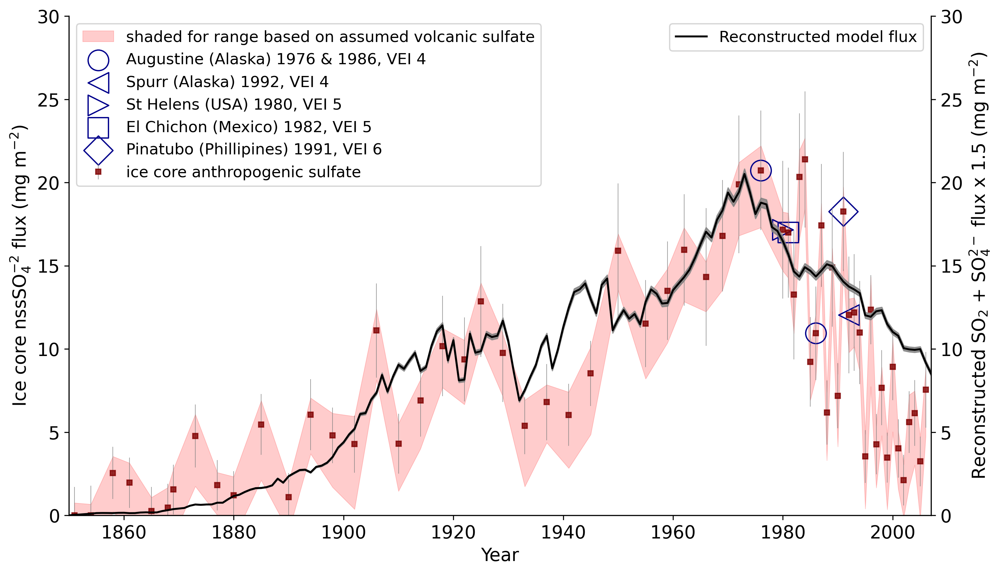

In [352]:
fig, ax = plt.subplots(figsize = [12,7],dpi = 300)
j=14
ax.set_ylabel('Ice core nssSO$_4^{-2}$ flux (mg m$^{-2}$)',fontsize=j)
ax.set_xlabel('Year',fontsize=j)
# plt.title('Volcanic, biogenic, anthropogenic non-sea salt sulfate (big eruptions excluded)',fontsize = 18)
ax.set_xlim([1850,2007])
ax.set_ylim([0,30])
t_emiss_Ggyr = (na_emiss_Ggyr + eu_emiss_Ggyr)*1e-3
yr = range(1850,2008,1)
size = 4

ax.errorbar(year_ind,anthSO4_dep_mg_m2,sigma_anth * np.mean(accum) * 2e-3,fmt='s',markersize=size,zorder=2,
            color='maroon',ecolor='gray',linewidth=0.5,label='ice core anthropogenic sulfate',alpha=0.8)
p2 = ax.fill_between(year_ind,anthSO4_5_dep_mg_m2,
                anthSO4_95_dep_mg_m2,color='red',
                label='shaded for range based on assumed volcanic sulfate',linewidth=0.5,alpha=0.2)
p3 = ax.scatter(eruptyrs[0],eruptdep[0],marker='o',s=size**4,color='#FF000000',edgecolor='darkblue',
           label='Augustine (Alaska) 1976 & 1986, VEI 4')
p4 = ax.scatter(eruptyrs[1],eruptdep[1],marker='<',s=size**4,color='#FF000000',edgecolor='darkblue',
           label='Spurr (Alaska) 1992, VEI 4')
p5 = ax.scatter(eruptyrs[2],eruptdep[2],marker='>',s=size**4,color='#FF000000',edgecolor='darkblue',
           label='St Helens (USA) 1980, VEI 5')
p6 = ax.scatter(eruptyrs[3],eruptdep[3],marker='s',s=size**4,color='#FF000000',edgecolor='darkblue',
           label='El Chichon (Mexico) 1982, VEI 5')
p7 = ax.scatter(eruptyrs[4],eruptdep[4],marker='o',s=size**4,color='#FF000000',edgecolor='darkblue')
p8 = ax.scatter(eruptyrs[5],eruptdep[5],marker='D',s=size**4,color='#FF000000',edgecolor='darkblue',
           label='Pinatubo (Phillipines) 1991, VEI 6')

l1 = ax.legend([p1,p2,p3,p4,p5,p6,p7,p8],
            ['Ice core anthropogenic sulfate',
             'Range based on assumed volcanic sulfate',
             'Augustine (Alaska) 1976 & 1986, VEI 4',
             'Spurr (Alaska) 1992, VEI 4',
             'St Helens (USA) 1980, VEI 5',
             'El Chichon (Mexico) 1982, VEI 5',
             'Pinatubo (Phillipines) 1991, VEI 6'],loc='upper left',fontsize=j-6)

ax2 = ax.twinx()
ax2.set_ylabel('Reconstructed SO$_2$ + SO$_4^{2-}$ flux x 1.5 (mg m$^{-2}$)',fontsize=j)
ax2.set_xlabel('Year',fontsize=j)
dep_fac = 1.5
ax2.plot(ceds_yrs,recon_anth_dep*dep_fac,color='k',label = 'Reconstructed model flux')
ax2.fill_between(ceds_yrs,recon_anth_dep_5*dep_fac,recon_anth_dep_95*dep_fac,
              color='gray',alpha=0.8) #,label='model $f_{anth}$ uncertainty')

ax.legend(loc='upper left',fontsize=j-2)
ax2.legend(loc='upper right',fontsize=j-2)

# ax2.plot(yr,t_emiss_Ggyr,linestyle='--',color='k',linewidth=l,
#          label='N. America + EU Emissions')
ax2.set_ylim([0,30])
# ax2.set_ylabel('Anthropogenic SO$_2$ emissions (Tg S yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)
ax2.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)


In [304]:
anthSO4_dep_mg_m2[5]

0.47221223581250865

In [305]:
baseline_dep_mean

0.08852005065894282

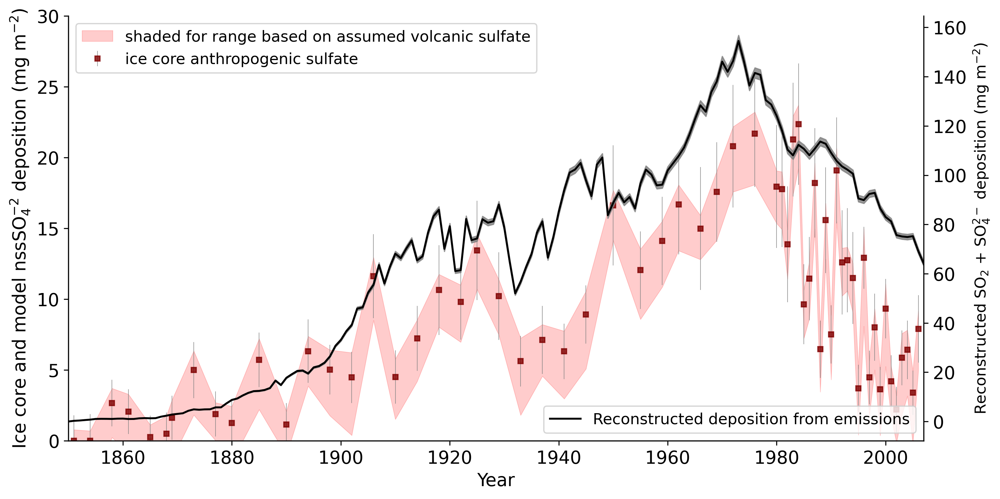

In [297]:
baseline_ice = anthSO4_dep_mg_m2[0:5]
baseline_ice[baseline_ice<0] = 0
baseline_ice_mean = np.mean(baseline_ice)
recon_anth_dep[recon_anth_dep<0] = 0
baseline_dep = recon_anth_dep[0:18]
baseline_dep_mean = np.mean(baseline_dep)

fig, ax = plt.subplots(figsize = [12,6],dpi = 300)
j=14
ax.set_ylabel('Ice core and model nssSO$_4^{-2}$ deposition (mg m$^{-2}$)',fontsize=j)
ax.set_xlabel('Year',fontsize=j)
# plt.title('Volcanic, biogenic, anthropogenic non-sea salt sulfate (big eruptions excluded)',fontsize = 18)
ax.set_xlim([1850,2007])
ax.set_ylim([0,30])
t_emiss_Ggyr = (na_emiss_Ggyr + eu_emiss_Ggyr)*1e-3
yr = range(1850,2008,1)
size = 4

ax.errorbar(year_ind,anthSO4_dep_mg_m2/baseline_ice_mean,(sigma_anth * np.mean(accum) * 2e-3)/baseline_ice_mean,fmt='s',markersize=size,zorder=2,
            color='maroon',ecolor='gray',linewidth=0.5,label='ice core anthropogenic sulfate',alpha=0.8)
p2 = ax.fill_between(year_ind,anthSO4_5_dep_mg_m2/baseline_ice_mean,
                anthSO4_95_dep_mg_m2/baseline_ice_mean,color='red',
                label='shaded for range based on assumed volcanic sulfate',linewidth=0.5,alpha=0.2)
# p3 = ax.scatter(eruptyrs[0],eruptconc[0],marker='o',s=size**4,color='#FF000000',edgecolor='darkblue',
#            label='Augustine (Alaska) 1976 & 1986, VEI 4')
# p4 = ax.scatter(eruptyrs[1],eruptconc[1],marker='<',s=size**4,color='#FF000000',edgecolor='darkblue',
#            label='Spurr (Alaska) 1992, VEI 4')
# p5 = ax.scatter(eruptyrs[2],eruptconc[2],marker='>',s=size**4,color='#FF000000',edgecolor='darkblue',
#            label='St Helens (USA) 1980, VEI 5')
# p6 = ax.scatter(eruptyrs[3],eruptconc[3],marker='s',s=size**4,color='#FF000000',edgecolor='darkblue',
#            label='El Chichon (Mexico) 1982, VEI 5')
# p7 = ax.scatter(eruptyrs[4],eruptconc[4],marker='o',s=size**4,color='#FF000000',edgecolor='darkblue')
# p8 = ax.scatter(eruptyrs[5],eruptconc[5],marker='D',s=size**4,color='#FF000000',edgecolor='darkblue',
#            label='Pinatubo (Phillipines) 1991, VEI 6')

# l1 = ax.legend([p1,p2,p3,p4,p5,p6,p7,p8],
#             ['Ice core anthropogenic sulfate',
#              'Range based on assumed volcanic sulfate',
#              'Augustine (Alaska) 1976 & 1986, VEI 4',
#              'Spurr (Alaska) 1992, VEI 4',
#              'St Helens (USA) 1980, VEI 5',
#              'El Chichon (Mexico) 1982, VEI 5',
#              'Pinatubo (Phillipines) 1991, VEI 6'],loc='upper left',fontsize=j-6)

ax2 = ax.twinx()
ax2.set_ylabel('Reconstructed SO$_2$ + SO$_4^{2-}$ deposition (mg m$^{-2}$)',fontsize=j-2)
ax2.set_xlabel('Year',fontsize=j)

ax2.plot(ceds_yrs,recon_anth_dep/baseline_dep_mean,color='k',label = 'Reconstructed deposition from emissions')
ax2.fill_between(ceds_yrs,recon_anth_dep_5/baseline_dep_mean,recon_anth_dep_95/baseline_dep_mean,
              color='gray',alpha=0.8) #,label='model $f_{anth}$ uncertainty')

ax.legend(loc='upper left',fontsize=j-2)
ax2.legend(loc='lower right',fontsize=j-2)

# ax2.plot(yr,t_emiss_Ggyr,linestyle='--',color='k',linewidth=l,
#          label='N. America + EU Emissions')
# ax2.set_ylim([0,19])
# ax2.set_ylabel('Anthropogenic SO$_2$ emissions (Tg S yr$^{-1}$)',fontsize=j)

ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)
ax2.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)


In [259]:
top_of_core_emiss = na_eu_su_emiss_ceds[146:157]
earlier_emiss = na_eu_su_emiss_ceds[68:83]

top_of_core_anthdep = recon_anth_dep[146:157]
earlier_anthdep = recon_anth_dep[68:83]

top_of_core_icedep = anthSO4_dep_mg_m2[50:]
earlier_icedep = anthSO4_dep_mg_m2[18:22]
year_ind[22]

1933

In [260]:
x1, p_emiss = stats.ttest_ind(top_of_core_emiss, 
                                earlier_emiss, axis=0, equal_var=True, nan_policy='omit')

x2, p_ice_core = stats.ttest_ind(top_of_core_conc, 
                                earlier_conc, axis=0, equal_var=True, nan_policy='omit')

x3, p_anthdep = stats.ttest_ind(top_of_core_anthdep, 
                                earlier_anthdep, axis=0, equal_var=True, nan_policy='omit')

print('Early years:',ceds_yrs[68],ceds_yrs[83])
print('Top of core years',ceds_yrs[146],ceds_yrs[156])
print('-----------------------------------------------------------')
print('Emissions early (Gg)',np.round(np.mean(earlier_emiss*1e-9),2))
print('Emissions top   (Gg)',np.round(np.mean(top_of_core_emiss*1e-9),2))
print('p value difference',p_emiss)
print('-----------------------------------------------------------')
print('Deposition model early (mg m-2)',np.round(np.mean(earlier_anthdep),2))
print('Deposition model top   (mg m-2)',np.round(np.mean(top_of_core_anthdep),2))
print('p value difference',p_anthdep)
print('-----------------------------------------------------------')
print('Deposition ice core early (Gg)',np.round(np.mean(earlier_icedep),2))
print('Deposition ice core top   (Gg)',np.round(np.mean(top_of_core_icedep),2))
print('p value difference',p_ice_core)

Early years: 1918.0 1933.0
Top of core years 1996.0 2006.0
-----------------------------------------------------------
Emissions early (Gg) 18.25
Emissions top   (Gg) 19.96
p value difference 0.07390778683043757
-----------------------------------------------------------
Deposition model early (mg m-2) 6.47
Deposition model top   (mg m-2) 7.1
p value difference 0.07390778683043783
-----------------------------------------------------------
Deposition ice core early (Gg) 10.54
Deposition ice core top   (Gg) 5.94
p value difference 0.0003974062244919403


(0.0, 1.1)

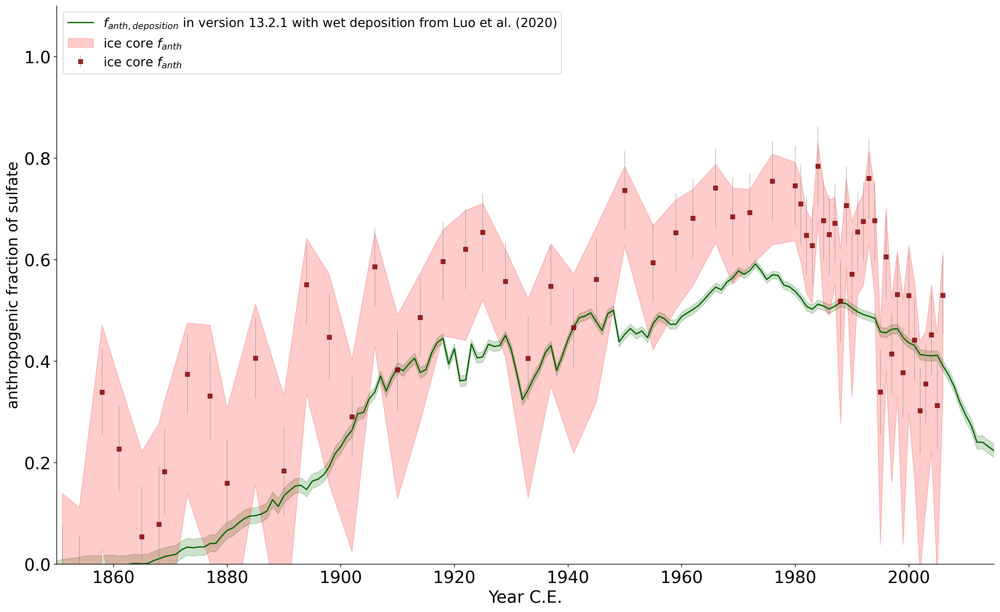

In [353]:
fanth_uj = np.mean(fanth_bayes,axis=1)
fanth_v12 = np.mean(fanth_bayesv12,axis=1)
fanth_bayes_dep_5 = np.array([])
fanth_bayes_dep_95 = np.array([])
fanth_bayes_5 = np.array([])
fanth_bayes_95 = np.array([])
fanth_bayesv12_5 = np.array([])
fanth_bayesv12_95 = np.array([])

fig,ax = plt.subplots(ncols=1,nrows=1,figsize=[20,12],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)
ax.patch.set_facecolor('white')
ax.patch.set_alpha(0)


l = 1.5
el = 0.5
aa = 0.8
aaa=0.05
j=20
size=75

for i in range(0,len(ceds_yrs)):
#     plt.scatter(ceds_yrs[i]*np.ones(1000),fanth_bayes[i,:],marker='.',alpha=0.1,s=size/5,color='k')
    fanth_bayes_dep_5 = np.hstack([fanth_bayes_dep_5,np.percentile(fanth_bayes_dep[i,:],5)])
    fanth_bayes_dep_95 = np.hstack([fanth_bayes_dep_95,np.percentile(fanth_bayes_dep[i,:],95)])
    fanth_bayes_5 = np.hstack([fanth_bayes_5,np.percentile(fanth_bayes[i,:],5)])
    fanth_bayes_95 = np.hstack([fanth_bayes_95,np.percentile(fanth_bayes[i,:],95)])
    fanth_bayesv12_5 = np.hstack([fanth_bayesv12_5,np.percentile(fanth_bayesv12[i,:],5)])
    fanth_bayesv12_95 = np.hstack([fanth_bayesv12_95,np.percentile(fanth_bayesv12[i,:],95)])

ax.plot(ceds_yrs,np.mean(fanth_bayes_dep,axis=1),linestyle='-',color='darkgreen',linewidth=l,
         label='$f_{anth,deposition}$ in version 13.2.1 with wet deposition from Luo et al. (2020)') # [1750 burden]
ax.fill_between(ceds_yrs,fanth_bayes_dep_5,fanth_bayes_dep_95,
              color='darkgreen',alpha=0.2) #,label='model $f_{anth}$ uncertainty')

ax.errorbar(year_ind,ice_core_fanth,sigma_fanth,fmt='s',markersize=5,
            color='maroon',ecolor='gray',linewidth=0.5,label='ice core $f_{anth}$',alpha=0.8)

ax.fill_between(year_ind,fanth_5,fanth_95,
              color='red',alpha=0.2,label='ice core $f_{anth}$')


ax.set_xlim([1850,2015])

ax.set_ylabel('anthropogenic fraction of sulfate',fontsize=j-2)
ax.set_xlabel('Year C.E.',fontsize=j)
ax.tick_params(axis='x', labelsize= j)
ax.tick_params(axis='y', labelsize= j)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(loc='upper left', fontsize= j-5)
ax.set_ylim([0,1.1])

In [222]:
bayes_pi_h2s17 = bayes_pi + (burden_h2s17.values - (ys2[0]+ys2[1])/2)

diff = (burden_h2s17.values - (ys2[0]+ys2[1])/2)

bayes_burden_h2s17 = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope[0,:])])
bioburden = ((novolc_burden_pi.values + novolc_burden_pi_met07.values)/2)
volcburden = bayes_pi_h2s17 - bioburden

fvolc_bayes_h2s17 = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope[0,:])])
fbio_bayes_h2s17 = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope[0,:])])
fanth_bayes_h2s17 = np.zeros([len(na_eu_su_emiss_ceds),len(bayes_slope[0,:])])

for i in range(0,len(na_eu_su_emiss_ceds)):
    bayes_burden_h2s17[i,:] = na_eu_su_emiss_ceds[i] * bayes_slope[0,:] + bayes_intercept[0,:] + diff
    fanth_bayes_h2s17[i,:] = (bayes_burden_h2s17[i,:]-bayes_pi_h2s17) / (bayes_burden_h2s17[i,:])
    fvolc_bayes_h2s17[i,:] = volcburden/bayes_burden_h2s17[i,:]
    fbio_bayes_h2s17[i,:] = bioburden/bayes_burden_h2s17[i,:]

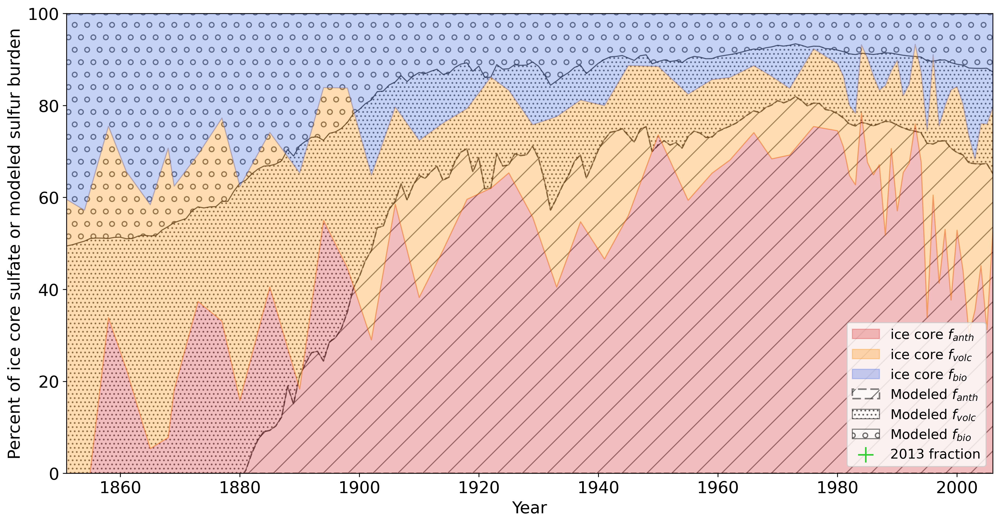

In [223]:
fanth_h2s17 = np.mean(fanth_bayes_h2s17,axis=1)
fbio_h2s17  = np.mean(fbio_bayes_h2s17,axis=1)
fvolc_h2s17 = np.mean(fvolc_bayes_h2s17,axis=1)

fig, ax = plt.subplots(ncols=1,nrows=1,figsize=[16,8],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)

j=16
ax.set_xlim([1851,2006])
ax.set_ylim([0,100])
ax.set_ylabel('Percent of ice core sulfate or modeled sulfur burden',fontsize=j)
ax.set_xlabel('Year',fontsize=j)

ax.tick_params(labelsize=j)


ax.fill_between(year_ind,0,ice_core_fanth*100,
              color='tab:red',alpha=0.3,label='ice core $f_{anth}$')

ax.fill_between(year_ind,ice_core_fanth*100,(ice_core_fanth+ice_core_fvolc)*100,
              color='darkorange',alpha=0.3,label='ice core $f_{volc}$')

ax.fill_between(year_ind,(ice_core_fanth+ice_core_fvolc)*100,(ice_core_fanth+ice_core_fvolc+ice_core_fbio)*100,
              color='royalblue',alpha=0.3,label='ice core $f_{bio}$')


ax.fill_between(ceds_yrs,fanth_h2s17*100,linestyle='--',facecolor='white',linewidth=l,edgecolor='k',
                hatch='/',alpha=0.5,zorder=0,
         label='Modeled $f_{anth}$')

ax.fill_between(ceds_yrs,fanth_h2s17*100,(fanth_h2s17 + fvolc_h2s17)*100,facecolor='white',edgecolor='k',
                hatch='...',alpha=0.5,zorder=0,
         label='Modeled $f_{volc}$')

ax.fill_between(ceds_yrs,(fanth_h2s17 + fvolc_h2s17)*100,(fanth_h2s17 + fvolc_h2s17 + fbio_h2s17)*100,facecolor='white',
               edgecolor='k',hatch='o',alpha=0.5,zorder=0,
         label='Modeled $f_{bio}$')


ax.scatter(2013,fanth_std*100,marker='+',s=size*3,color='limegreen',
           label='2013 fraction')
# ax.scatter(1991.5,0.68,marker='+',s=size**4,color = 'darkgreen',
#            label='Eruption of Pinatubo in Phillipines in June 1991')


ax.legend(loc='lower right',fontsize=j-3)


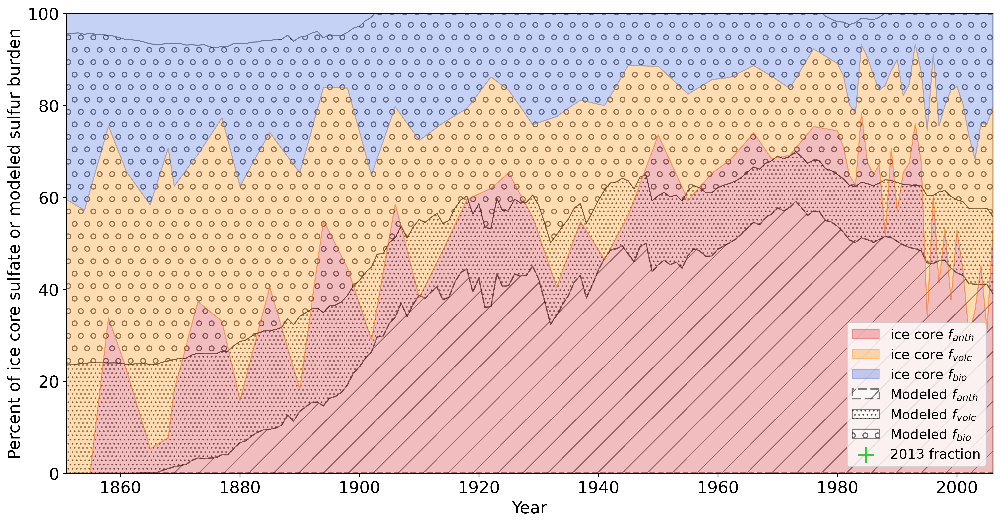

In [224]:
fig, ax = plt.subplots(ncols=1,nrows=1,figsize=[16,8],dpi=300)
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=-0.1)

j=16
ax.set_xlim([1851,2006])
ax.set_ylim([0,100])
ax.set_ylabel('Percent of ice core sulfate or modeled sulfur burden',fontsize=j)
ax.set_xlabel('Year',fontsize=j)

ax.tick_params(labelsize=j)


ax.fill_between(year_ind,0,ice_core_fanth*100,
              color='tab:red',alpha=0.3,label='ice core $f_{anth}$')

ax.fill_between(year_ind,ice_core_fanth*100,(ice_core_fanth+ice_core_fvolc)*100,
              color='darkorange',alpha=0.3,label='ice core $f_{volc}$')

ax.fill_between(year_ind,(ice_core_fanth+ice_core_fvolc)*100,(ice_core_fanth+ice_core_fvolc+ice_core_fbio)*100,
              color='royalblue',alpha=0.3,label='ice core $f_{bio}$')


ax.fill_between(ceds_yrs,np.mean(fanth_bayes_dep,axis=1)*100,linestyle='--',facecolor='white',linewidth=l,edgecolor='k',
                hatch='/',alpha=0.5,zorder=0,
         label='Modeled $f_{anth}$')

ax.fill_between(ceds_yrs,np.mean(fanth_bayes_dep,axis=1)*100,(np.mean(fanth_bayes_dep,axis=1) + fvolc_dep)*100,facecolor='white',edgecolor='k',
                hatch='...',alpha=0.5,zorder=0,
         label='Modeled $f_{volc}$')

ax.fill_between(ceds_yrs,(np.mean(fanth_bayes_dep,axis=1) + fvolc_dep)*100,(np.mean(fanth_bayes_dep,axis=1) + fvolc_dep + fbio_dep)*100,facecolor='white',
               edgecolor='k',hatch='o',alpha=0.5,zorder=0,
         label='Modeled $f_{bio}$')


ax.scatter(2013,fanth_std*100,marker='+',s=size*3,color='limegreen',
           label='2013 fraction')
# ax.scatter(1991.5,0.68,marker='+',s=size**4,color = 'darkgreen',
#            label='Eruption of Pinatubo in Phillipines in June 1991')


ax.legend(loc='lower right',fontsize=j-3)


In [157]:
ice_anth_1850_1900 = np.mean(anthSO4[2:14])
ice_anth_1960_1990 = np.mean(anthSO4[29:45])
ice_anth_1995_2006 = np.mean(anthSO4[48:])

sigma_ice_anth_1850_1900 = np.std(anthSO4[2:14])
sigma_ice_anth_1960_1990 = np.std(anthSO4[29:45])
sigma_ice_anth_1995_2006 = np.std(anthSO4[48:])

gc_anth_1850_1900 = np.mean(t_emiss_Ggyr[8:51])
gc_anth_1960_1990 = np.mean(t_emiss_Ggyr[110:141])
gc_anth_1995_2006 = np.mean(t_emiss_Ggyr[145:157])

sigma_gc_anth_1850_1900 = np.std(t_emiss_Ggyr[8:51])
sigma_gc_anth_1960_1990 = np.std(t_emiss_Ggyr[110:141])
sigma_gc_anth_1995_2006 = np.std(t_emiss_Ggyr[145:157])

table = [['source','1850 to 1900 percent','1960 to 1990 percent','1995 to 2006 percent'],
         ['Ice core (µg kg-1)',np.round(ice_anth_1850_1900,2),np.round(ice_anth_1960_1990,2),np.round(ice_anth_1995_2006,2)],
         ['Ice core simga',np.round(sigma_ice_anth_1850_1900,2),np.round(sigma_ice_anth_1960_1990,2),np.round(sigma_ice_anth_1995_2006,2)],
         ['CEDS (Tg S yr-1)',np.round(gc_anth_1850_1900,2),np.round(gc_anth_1960_1990,2),np.round(gc_anth_1995_2006,2)]]

print('     ANTHRO TRENDS')
print(tabulate(table,headers='firstrow',tablefmt='fancy_grid'))

     ANTHRO TRENDS
╒════════════════════╤════════════════════════╤════════════════════════╤════════════════════════╕
│ source             │   1850 to 1900 percent │   1960 to 1990 percent │   1995 to 2006 percent │
╞════════════════════╪════════════════════════╪════════════════════════╪════════════════════════╡
│ Ice core (µg kg-1) │                  12.72 │                  67.49 │                  25.29 │
├────────────────────┼────────────────────────┼────────────────────────┼────────────────────────┤
│ Ice core simga     │                   8.81 │                  18.36 │                  12.69 │
├────────────────────┼────────────────────────┼────────────────────────┼────────────────────────┤
│ CEDS (Tg S yr-1)   │                   7.82 │                  68.79 │                  30.62 │
╘════════════════════╧════════════════════════╧════════════════════════╧════════════════════════╛


In [158]:
fanth_uj = np.mean(fanth_bayes,axis=1)
ice_fanth_1850_1900 = np.mean(ice_core_fanth[2:14])
ice_fanth_1960_1990 = np.mean(np.hstack([ice_core_fanth[29:33],ice_core_fanth[37:40],ice_core_fanth[41:45]]))
ice_fanth_1995_2006 = np.mean(ice_core_fanth[48:])

ice_fbio_1850_1900 = np.mean(ice_core_fbio[2:14])
ice_fbio_1960_1990 = np.mean(np.hstack([ice_core_fbio[29:33],ice_core_fbio[37:40],ice_core_fbio[41:45]]))
ice_fbio_1995_2006 = np.mean(ice_core_fbio[48:])

ice_fvolc_1850_1900 = np.mean(ice_core_fvolc[2:14])
ice_fvolc_1960_1990 = np.mean(np.hstack([ice_core_fvolc[29:33],ice_core_fvolc[37:40],ice_core_fvolc[41:45]]))
ice_fvolc_1995_2006 = np.mean(ice_core_fvolc[48:])

sigma_ice_fanth_1850_1900 = np.std(ice_core_fanth[2:14])
sigma_ice_fanth_1960_1990 = np.std(np.hstack([ice_core_fanth[29:33],ice_core_fanth[37:40],ice_core_fanth[41:45]]))
sigma_ice_fanth_1995_2006 = np.std(ice_core_fanth[48:])

sigma_ice_fbio_1850_1900 = np.std(ice_core_fbio[2:14])
sigma_ice_fbio_1960_1990 = np.std(np.hstack([ice_core_fbio[29:33],ice_core_fbio[37:40],ice_core_fbio[41:45]]))
sigma_ice_fbio_1995_2006 = np.std(ice_core_fbio[48:])

sigma_ice_fvolc_1850_1900 = np.std(ice_core_fvolc[2:14])
sigma_ice_fvolc_1960_1990 = np.std(np.hstack([ice_core_fvolc[29:33],ice_core_fvolc[37:40],ice_core_fvolc[41:45]]))
sigma_ice_fvolc_1995_2006 = np.std(ice_core_fvolc[48:])


gc_fanth_1850_1900 = np.mean(fanth_uj[8:51])
gc_fanth_1960_1990 = np.mean(np.hstack([fanth_uj[110:126],fanth_uj[127:130],fanth_uj[131:132],fanth_uj[133:136],
                                       fanth_uj[137:141]]))
gc_fanth_1995_2006 = np.mean(fanth_uj[145:157])

gc_fbio_1850_1900 = np.mean(fbio_uj[8:51])
gc_fbio_1960_1990 = np.mean(np.hstack([fbio_uj[110:126],fbio_uj[127:130],fbio_uj[131:132],fbio_uj[133:136],
                                      fbio_uj[137:141]]))
gc_fbio_1995_2006 = np.mean(fbio_uj[145:157])

gc_fvolc_1850_1900 = np.mean(fvolc_uj[8:51])
gc_fvolc_1960_1990 = np.mean(np.hstack([fvolc_uj[110:126],fvolc_uj[127:130],fvolc_uj[131:132],fvolc_uj[133:136],
                                       fvolc_uj[137:141]]))
gc_fvolc_1995_2006 = np.mean(fvolc_uj[145:157])

sigma_gc_fanth_1850_1900 = np.std(fanth_uj[8:51])
sigma_gc_fanth_1960_1990 = np.std(np.hstack([fanth_uj[110:126],fanth_uj[127:130],fanth_uj[131:132],
                                            fanth_uj[133:136],fanth_uj[137:141]]))
sigma_gc_fanth_1995_2006 = np.std(fanth_uj[145:157])

gc_5_fanth_1850_1900 = np.mean(fanth_bayes_5[8:51])
gc_5_fanth_1960_1990 = np.mean(np.hstack([fanth_bayes_5[110:126],fanth_bayes_5[127:130],fanth_bayes_5[131:132],
                                         fanth_bayes_5[133:136],fanth_bayes_5[136:141]]))
gc_5_fanth_1995_2006 = np.mean(fanth_bayes_5[145:157])
gc_95_fanth_1850_1900 = np.mean(fanth_bayes_95[8:51])
gc_95_fanth_1960_1990 = np.mean(np.hstack([fanth_bayes_95[110:126],fanth_bayes_95[127:130],fanth_bayes_95[131:132],
                                          fanth_bayes_95[133:136],fanth_bayes_95[137:141]]))
gc_95_fanth_1995_2006 = np.mean(fanth_bayes_95[145:157])
gc_err_fanth_1850_1900 = (gc_95_fanth_1850_1900-gc_5_fanth_1850_1900)/2
gc_err_fanth_1960_1990 = (gc_95_fanth_1960_1990-gc_5_fanth_1960_1990)/2
gc_err_fanth_1995_2006 = (gc_95_fanth_1995_2006-gc_5_fanth_1995_2006)/2


sigma_gc_fbio_1850_1900 = np.std(fbio_uj[8:51])
sigma_gc_fbio_1960_1990 = np.std(np.hstack([fbio_uj[110:126],fbio_uj[127:130],fbio_uj[131:132],fbio_uj[133:136],
                                           fbio_uj[137:141]]))
sigma_gc_fbio_1995_2006 = np.std(fbio_uj[145:157])

sigma_gc_fvolc_1850_1900 = np.std(fvolc_uj[8:51])
sigma_gc_fvolc_1960_1990 = np.std(np.hstack([fvolc_uj[110:126],fvolc_uj[127:130],fvolc_uj[131:132],
                                            fvolc_uj[133:136],fvolc_uj[137:141]]))
sigma_gc_fvolc_1995_2006 = np.std(fvolc_uj[145:157])

fanth_dif_1850_1900 = (gc_fanth_1850_1900 - ice_fanth_1850_1900)/ice_fanth_1850_1900
fanth_dif_1960_1990 = (gc_fanth_1960_1990 - ice_fanth_1960_1990)/ice_fanth_1960_1990
fanth_dif_1995_2006 = (gc_fanth_1995_2006 - ice_fanth_1995_2006)/ice_fanth_1995_2006

fbio_dif_1850_1900 = (gc_fbio_1850_1900 - ice_fbio_1850_1900)/ice_fbio_1850_1900
fbio_dif_1960_1990 = (gc_fbio_1960_1990 - ice_fbio_1960_1990)/ice_fbio_1960_1990
fbio_dif_1995_2006 = (gc_fbio_1995_2006 - ice_fbio_1995_2006)/ice_fbio_1995_2006

fvolc_dif_1850_1900 = (gc_fvolc_1850_1900 - ice_fvolc_1850_1900)/ice_fvolc_1850_1900
fvolc_dif_1960_1990 = (gc_fvolc_1960_1990 - ice_fvolc_1960_1990)/ice_fvolc_1960_1990
fvolc_dif_1995_2006 = (gc_fvolc_1995_2006 - ice_fvolc_1995_2006)/ice_fvolc_1995_2006


table = [['source','1850 to 1900 percent','1960 to 1990 percent','1995 to 2006 percent'],
         ['anth',np.round(ice_fanth_1850_1900,2)*1e2,np.round(ice_fanth_1960_1990,2)*1e2,np.round(ice_fanth_1995_2006,2)*1e2],
         ['bio',np.round(ice_fbio_1850_1900,2)*1e2,np.round(ice_fbio_1960_1990,2)*1e2,np.round(ice_fbio_1995_2006,2)*1e2],
         ['volc',np.round(ice_fvolc_1850_1900,2)*1e2,np.round(ice_fvolc_1960_1990,2)*1e2,np.round(ice_fvolc_1995_2006,2)*1e2]]


print('     ICE CORE')
print(tabulate(table,headers='firstrow',tablefmt='fancy_grid'))

table = [['source','1850 to 1900 sigma','1960 to 1990 sigma','1995 to 2006 sigma'],
         ['anth',np.round(sigma_ice_fanth_1850_1900,2)*1e2,np.round(sigma_ice_fanth_1960_1990,2)*1e2,np.round(sigma_ice_fanth_1995_2006,2)*1e2],
         ['bio',np.round(sigma_ice_fbio_1850_1900,2)*1e2,np.round(sigma_ice_fbio_1960_1990,2)*1e2,np.round(sigma_ice_fbio_1995_2006,2)*1e2],
         ['volc',np.round(sigma_ice_fvolc_1850_1900,2)*1e2,np.round(sigma_ice_fvolc_1960_1990,2)*1e2,np.round(sigma_ice_fvolc_1995_2006,2)*1e2]]


print('     ICE CORE SIGMAS')
print(tabulate(table,headers='firstrow',tablefmt='fancy_grid'))

table = [['source','1850 to 1900 percent','1960 to 1990 percent','1995 to 2006 percent'],
         ['anth',np.round(gc_fanth_1850_1900,2)*1e2,np.round(gc_fanth_1960_1990,2)*1e2,np.round(gc_fanth_1995_2006,2)*1e2],
         ['bio',np.round(gc_fbio_1850_1900,2)*1e2,np.round(gc_fbio_1960_1990,2)*1e2,np.round(gc_fbio_1995_2006,2)*1e2],
         ['volc',np.round(gc_fvolc_1850_1900,2)*1e2,np.round(gc_fvolc_1960_1990,2)*1e2,np.round(gc_fvolc_1995_2006,2)*1e2]]

print('     MODEL')
print(tabulate(table,headers='firstrow',tablefmt='fancy_grid'))

table = [['source','1850 to 1900 sigma','1960 to 1990 sigma','1995 to 2006 sigma'],
         ['anth',np.round(sigma_gc_fanth_1850_1900,2)*1e2,np.round(sigma_gc_fanth_1960_1990,2)*1e2,np.round(sigma_gc_fanth_1995_2006,2)*1e2],
         ['bio',np.round(sigma_gc_fbio_1850_1900,3)*1e2,np.round(sigma_gc_fbio_1960_1990,3)*1e2,np.round(sigma_gc_fbio_1995_2006,3)*1e2],
         ['volc',np.round(sigma_gc_fvolc_1850_1900,3)*1e2,np.round(sigma_gc_fvolc_1960_1990,3)*1e2,np.round(sigma_gc_fvolc_1995_2006,3)*1e2]]

print('     MODEL SIGMAS')
print(tabulate(table,headers='firstrow',tablefmt='fancy_grid'))

table = [['source','1850 to 1900 sigma','1960 to 1990 sigma','1995 to 2006 sigma'],
         ['5th',np.round(gc_5_fanth_1850_1900,2)*1e2,np.round(gc_5_fanth_1960_1990,2)*1e2,np.round(gc_5_fanth_1995_2006,2)*1e2],
         ['95th',np.round(gc_95_fanth_1850_1900,3)*1e2,np.round(gc_95_fanth_1960_1990,3)*1e2,np.round(gc_95_fanth_1995_2006,3)*1e2],
         ['diff',np.round(gc_err_fanth_1850_1900,3)*1e2,np.round(gc_err_fanth_1960_1990,3)*1e2,np.round(gc_err_fanth_1995_2006,3)*1e2]]

print('     MODEL BAYES ERROR')
print(tabulate(table,headers='firstrow',tablefmt='fancy_grid'))


table = [['source','1850 to 1900 perc dif','1960 to 1990 perc dif','1995 to 2006 perc dif'],
         ['anth',np.round(fanth_dif_1850_1900,2)*1e2,np.round(fanth_dif_1960_1990,2)*1e2,np.round(fanth_dif_1995_2006,2)*1e2],
         ['bio',np.round(fbio_dif_1850_1900,3)*100,np.round(fbio_dif_1960_1990,3)*100,np.round(fbio_dif_1995_2006,3)]*100,
         ['volc',np.round(fvolc_dif_1850_1900,3)*100,np.round(fvolc_dif_1960_1990,3)*100,np.round(fvolc_dif_1995_2006,3)*100]]

print('     MODEL ICE CORE PERCENT DIFFERENCE')
print(tabulate(table,headers='firstrow',tablefmt='fancy_grid'))



     ICE CORE
╒══════════╤════════════════════════╤════════════════════════╤════════════════════════╕
│ source   │   1850 to 1900 percent │   1960 to 1990 percent │   1995 to 2006 percent │
╞══════════╪════════════════════════╪════════════════════════╪════════════════════════╡
│ anth     │                     28 │                     67 │                     45 │
├──────────┼────────────────────────┼────────────────────────┼────────────────────────┤
│ bio      │                     29 │                     13 │                     21 │
├──────────┼────────────────────────┼────────────────────────┼────────────────────────┤
│ volc     │                     43 │                     20 │                     34 │
╘══════════╧════════════════════════╧════════════════════════╧════════════════════════╛
     ICE CORE SIGMAS
╒══════════╤══════════════════════╤══════════════════════╤══════════════════════╕
│ source   │   1850 to 1900 sigma │   1960 to 1990 sigma │   1995 to 2006 sigma │
╞════════